# LOAN DEFAULT PREDICTION ANALYSIS

### Objective: The goal is to discern patterns indicating a client's potential difficulty in repaying loans.

## APPROACH

### Data Cleaning and Preprocessing
### Univariate Analysis to understand individual variable distributions
### Bivariate and Multivariate Analysis to identify relationships and patterns
### Data Treatments like outlier handling and target imbalance correction.


## CHALLENGES

### Handling missing values and outliers in the dataset
### Ensuring the analysis caters to the diverse nature of the dataset, considering both numerical and categorical variables.


## ASSUMPTIONS

### External data source scores are reliable indicators of client creditworthiness. 
### All provided data is accurate and up-to-date.
### XAP/XNA were missing values.
### Outliers were treated to ensure model robustness. The target variable's imbalance was addressed to ensure model accuracy.

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [5]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_row', None)

In [8]:
df = pd.read_csv(r"C:\Users\dell\Downloads\Loan Defaulter Project\Loan Defaulter Datasets\application_data.csv")
print(df.shape)
df.head()

(307511, 122)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [9]:
df.columns = df.columns.str.lower()

#### Objective: Discern patterns indicating a client's potential difficulty in repaying loans.

In [10]:
## Checking for duplicates
df.duplicated().sum()

0

In [12]:
## Creating DataFrame to store statistics information

def stats_overview(df):
    stats = pd.DataFrame(columns=['count', 'nunique', 'miss_perc', 'dtype', 'numeric', 'mode', 'mean', 'std', 'minimum',
                              'q25', 'median', 'q75', 'maximum', 'skewed', 'kurtosis'], index=df.columns)

    for column in df.columns:
        col_data = df[column]
        numeric = pd.api.types.is_numeric_dtype(col_data)
        
        stats.at[column, 'count'] = col_data.count()
        stats.at[column, 'nunique'] = col_data.nunique()
        stats.at[column, 'miss_perc'] = round(col_data.isna().sum() / df.shape[0] * 100, 2)
        stats.at[column, 'dtype'] = col_data.dtype
        stats.at[column, 'numeric'] = numeric
        stats.at[column, 'mode'] = col_data.mode()[0] if col_data.count() > 0 else np.nan
        stats.at[column, 'mean'] = col_data.mean() if numeric else np.nan
        stats.at[column, 'std'] = col_data.std() if numeric else np.nan
        stats.at[column, 'minimum'] = col_data.min() if numeric else np.nan
        stats.at[column, 'q25'] = col_data.quantile(0.25) if numeric else np.nan
        stats.at[column, 'median'] = col_data.median() if numeric else np.nan
        stats.at[column, 'q75'] = col_data.quantile(0.75) if numeric else np.nan
        stats.at[column, 'maximum'] = col_data.max() if numeric else np.nan
        stats.at[column, 'skewed'] = col_data.skew() if numeric else np.nan
        stats.at[column, 'kurtosis'] = col_data.kurtosis() if numeric else np.nan

    return stats.sort_values(by=['miss_perc', 'skewed', 'nunique'], ascending=False)
stats_overview(df)

,count,nunique,miss_perc,dtype,numeric,mode,mean,std,minimum,q25,median,q75,maximum,skewed,kurtosis
commonarea_mode,92646,3128,69.87,float64,True,0.0,0.042553,0.074445,0.0,0.0072,0.019,0.049,1.0,5.620589,48.860992
commonarea_avg,92646,3181,69.87,float64,True,0.0,0.044621,0.076036,0.0,0.0078,0.0211,0.0515,1.0,5.457305,45.988017
commonarea_medi,92646,3202,69.87,float64,True,0.0,0.044595,0.076144,0.0,0.0079,0.0208,0.0513,1.0,5.419238,45.263586
nonlivingapartments_mode,93997,167,69.43,float64,True,0.0,0.008076,0.046276,0.0,0.0,0.0,0.0039,1.0,16.251819,309.726947
nonlivingapartments_medi,93997,214,69.43,float64,True,0.0,0.008651,0.047415,0.0,0.0,0.0,0.0039,1.0,15.671995,289.492455
nonlivingapartments_avg,93997,386,69.43,float64,True,0.0,0.008809,0.047732,0.0,0.0,0.0,0.0039,1.0,15.541185,284.730336
fondkapremont_mode,97216,4,68.39,object,False,reg oper account,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
livingapartments_avg,97312,1868,68.35,float64,True,0.0504,0.100775,0.092576,0.0,0.0504,0.0756,0.121,1.0,3.042198,16.49063
livingapartments_medi,97312,1097,68.35,float64,True,0.0513,0.101954,0.093642,0.0,0.0513,0.0761,0.1231,1.0,2.988291,15.697053
livingapartments_mode,97312,736,68.35,float64,True,0.0551,0.105645,0.09788,0.0,0.0542,0.0771,0.1313,1.0,2.902672,14.224994


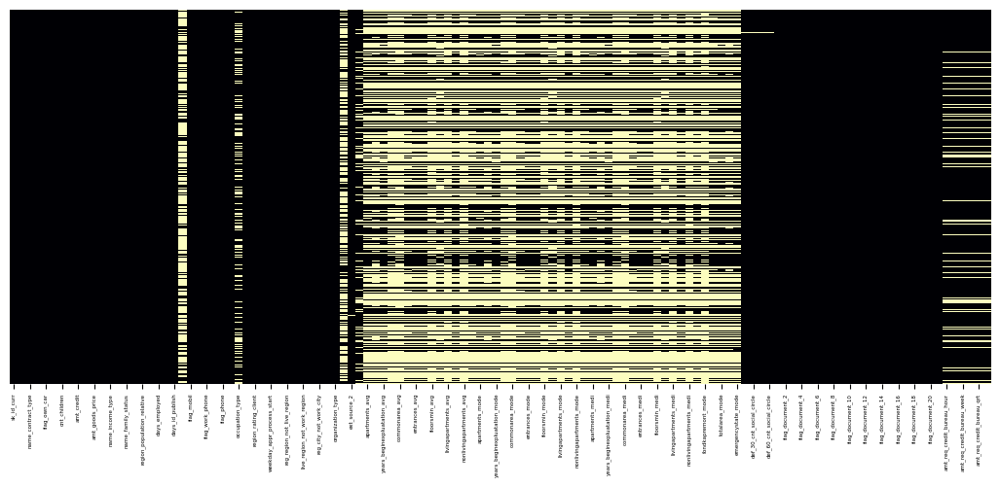

In [13]:
## Visualising missing data in the dataset

plt.figure(figsize=(13, 5))
sns.heatmap(df.isna(), cmap = 'magma', cbar=False, yticklabels=False)
plt.xticks(fontsize=4);

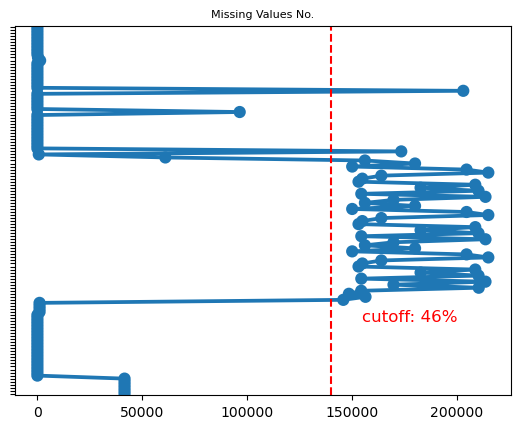

In [14]:
## Annotation indicating the percentage of missing values

ax = sns.pointplot(x = df.isna().sum(), y = df.columns)
ax.axvline(140000, ls='--', color='red')
textstr = f'cutoff: {round(140000/len(df)*100)}%'
ax.text(0.7, 0.2, textstr, fontsize=12, color='red', transform=plt.gca().transAxes)
plt.yticks(visible=False)
plt.title('Missing Values No.', fontsize=8)
plt.show()

In [15]:
high_miss_values = df.columns[df.isna().sum()/len(df)*100 > 45]

In [16]:
df[high_miss_values].sample(10)

,own_car_age,ext_source_1,apartments_avg,basementarea_avg,years_beginexpluatation_avg,years_build_avg,commonarea_avg,elevators_avg,entrances_avg,floorsmax_avg,floorsmin_avg,landarea_avg,livingapartments_avg,livingarea_avg,nonlivingapartments_avg,nonlivingarea_avg,apartments_mode,basementarea_mode,years_beginexpluatation_mode,years_build_mode,commonarea_mode,elevators_mode,entrances_mode,floorsmax_mode,floorsmin_mode,landarea_mode,livingapartments_mode,livingarea_mode,nonlivingapartments_mode,nonlivingarea_mode,apartments_medi,basementarea_medi,years_beginexpluatation_medi,years_build_medi,commonarea_medi,elevators_medi,entrances_medi,floorsmax_medi,floorsmin_medi,landarea_medi,livingapartments_medi,livingarea_medi,nonlivingapartments_medi,nonlivingarea_medi,fondkapremont_mode,housetype_mode,totalarea_mode,wallsmaterial_mode,emergencystate_mode
105914,NaN,NaN,0.1381,NaN,0.9836,NaN,0.0157,0.00,0.1034,0.0417,0.0417,NaN,0.0303,0.0174,0.3784,0.0394,0.1408,NaN,0.9836,NaN,0.0158,0.0000,0.1034,0.0417,0.0417,NaN,0.0331,0.0181,0.3813,0.0417,0.1395,NaN,0.9836,NaN,0.0158,0.00,0.1034,0.0417,0.0417,NaN,0.0308,0.0177,0.3804,0.0402,NaN,NaN,0.0222,NaN,No
51097,18.0,NaN,NaN,NaN,0.9523,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0057,NaN,NaN,NaN,NaN,0.9523,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0059,NaN,NaN,NaN,NaN,0.9523,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0058,NaN,NaN,NaN,NaN,0.0045,NaN,No
184198,8.0,0.533536,0.0371,0.0213,0.9891,NaN,NaN,0.04,0.0345,0.3333,NaN,0.0225,NaN,0.0315,NaN,0.0021,0.0378,0.0221,0.9891,NaN,NaN,0.0403,0.0345,0.3333,NaN,0.0230,NaN,0.0328,NaN,0.0022,0.0375,0.0213,0.9891,NaN,NaN,0.04,0.0345,0.3333,NaN,0.0229,NaN,0.0321,NaN,0.0021,NaN,block of flats,0.0252,Panel,No
146575,NaN,0.248763,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7989,20.0,0.697307,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
115746,7.0,NaN,0.0619,0.0728,0.9891,0.8504,0.0102,0.00,0.1379,0.1667,0.2083,0.0000,0.0504,0.0546,0.0000,0.0000,0.0630,0.0755,0.9891,0.8563,0.0103,0.0000,0.1379,0.1667,0.2083,0.0000,0.0551,0.0568,0.0000,0.0000,0.0625,0.0728,0.9891,0.8524,0.0103,0.00,0.1379,0.1667,0.2083,0.0000,0.0513,0.0555,0.0000,0.0000,reg oper account,block of flats,0.0485,"Stone, brick",No
282080,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
131544,NaN,0.770933,0.0680,0.0641,0.9856,0.8028,0.0292,0.00,0.1379,0.1667,0.0417,0.0458,0.0555,0.0604,0.0000,0.0155,0.0693,0.0665,0.9856,0.8105,0.0294,0.0000,0.1379,0.1667,0.0417,0.0468,0.0606,0.0629,0.0000,0.0165,0.0687,0.0641,0.9856,0.8054,0.0294,0.00,0.1379,0.1667,0.0417,0.0465,0.0564,0.0614,0.0000,0.0159,reg oper account,block of flats,0.0668,Panel,No
59811,NaN,0.643822,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
110583,NaN,NaN,0.0247,0.0374,0.9776,0.6940,0.0142,0.00,0.0690,0.0833,0.0417,0.0431,0.0202,0.0220,0.0000,0.0000,0.0252,0.0388,0.9777,0.7060,0.0143,0.0000,0.0690,0.0833,0.0417,0.0441,0.0220,0.0229,0.0000,0.0000,0.0250,0.0374,0.9776,0.6981,0.0143,0.00,0.0690,0.0833,0.0417,0.0439,0.0205,0.0224,0.0000,0.0000,reg oper spec account,block of flats,0.0231,"Stone, brick",No


In [20]:
## NaN values for own_car_age could possibely be marked nan for thsoe who do not own a car

df.loc[(df['flag_own_car'] == 'N'), 'own_car_age'] = df.loc[:,'own_car_age'][(df['flag_own_car'] == 'N')].replace(np.nan, 0)
df['own_car_age'].isnull().sum()  # the feature no longer has potentially high missing values                                              

5

In [42]:
df.shape

(244278, 74)

In [28]:
## Columns that requires imputation
pd.pivot_table(values = 'amt_income_total', index = 'occupation_type', columns = 'name_education_type', data = df, aggfunc = 'median')

name_education_type,Academic degree,Higher education,Incomplete higher,Lower secondary,Secondary / secondary special
occupation_type,,,,,
Accountants,209250.0,180000.0,157500.0,186750.0,157500.0
Cleaning staff,202500.0,130500.0,117000.0,112500.0,112500.0
Cooking staff,67500.0,153000.0,135000.0,112500.0,126000.0
Core staff,225000.0,171000.0,153000.0,112500.0,135000.0
Drivers,162000.0,180000.0,180000.0,157500.0,180000.0
HR staff,NaN,180000.0,135000.0,NaN,157500.0
High skill tech staff,157500.0,180000.0,157500.0,139500.0,153000.0
IT staff,NaN,180000.0,180000.0,112500.0,157500.0
Laborers,225000.0,171000.0,157500.0,135000.0,144000.0


In [29]:
df.loc[(df['name_education_type'] == 'Academic degree') & (df['amt_income_total'] <= 100000), 'occupation_type'] = df.loc[(df['name_education_type'] == 'Academic degree') & (df['amt_income_total'] <= 100000), 'occupation_type'].replace(np.nan, 'Low-skill Laborers')
df.loc[(df['name_education_type'] == 'Academic degree') & (df['amt_income_total'] > 100000) & (df['amt_income_total'] <= 150000), 'occupation_type'] = df.loc[(df['name_education_type'] == 'Academic degree') & (df['amt_income_total'] > 100000) & (df['amt_income_total'] <= 150000), 'occupation_type'].replace(np.nan, 'Sales staff')
df.loc[(df['name_education_type'] == 'Academic degree') & (df['amt_income_total'] > 150000) & (df['amt_income_total'] <= 175000), 'occupation_type'] = df.loc[(df['name_education_type'] == 'Academic degree') & (df['amt_income_total'] > 150000) & (df['amt_income_total'] <= 175000), 'occupation_type'].replace(np.nan, 'High skill tech staff')
df.loc[(df['name_education_type'] == 'Academic degree') & (df['amt_income_total'] > 175000) & (df['amt_income_total'] <= 200000), 'occupation_type'] = df.loc[(df['name_education_type'] == 'Academic degree') & (df['amt_income_total'] > 175000) & (df['amt_income_total'] <= 200000), 'occupation_type'].replace(np.nan, 'Security staff')
df.loc[(df['name_education_type'] == 'Academic degree') & (df['amt_income_total'] > 200000) & (df['amt_income_total'] <= 225000), 'occupation_type'] = df.loc[(df['name_education_type'] == 'Academic degree') & (df['amt_income_total'] > 200000) & (df['amt_income_total'] <= 225000), 'occupation_type'].replace(np.nan, 'Realty agents')
df.loc[(df['name_education_type'] == 'Academic degree') & (df['amt_income_total'] > 225000), 'occupation_type'] = df.loc[(df['name_education_type'] == 'Academic degree') & (df['amt_income_total'] > 225000), 'occupation_type'].replace(np.nan, 'Private service staff')


df.loc[(df['name_education_type'] == 'Higher education') & (df['amt_income_total'] <= 150000), 'occupation_type'] = df.loc[(df['name_education_type'] == 'Higher education') & (df['amt_income_total'] <= 150000), 'occupation_type'].replace(np.nan, 'Cooking staff')
df.loc[(df['name_education_type'] == 'Higher education') & (df['amt_income_total'] > 150000) & (df['amt_income_total'] <= 175000), 'occupation_type'] = df.loc[(df['name_education_type'] == 'Higher education') & (df['amt_income_total'] > 150000) & (df['amt_income_total'] <= 175000), 'occupation_type'].replace(np.nan, 'Medicine staff')
df.loc[(df['name_education_type'] == 'Higher education') & (df['amt_income_total'] > 175000) & (df['amt_income_total'] <= 200000), 'occupation_type'] = df.loc[(df['name_education_type'] == 'Higher education') & (df['amt_income_total'] > 175000) & (df['amt_income_total'] <= 200000), 'occupation_type'].replace(np.nan, 'HR staff')
df.loc[(df['name_education_type'] == 'Higher education') & (df['amt_income_total'] > 200000), 'occupation_type'] = df.loc[(df['name_education_type'] == 'Higher education') & (df['amt_income_total'] > 200000), 'occupation_type'].replace(np.nan, 'Managers')


df.loc[(df['name_education_type'] == 'Incomplete higher') & (df['amt_income_total'] <= 120000), 'occupation_type'] = df.loc[(df['name_education_type'] == 'Incomplete higher') & (df['amt_income_total'] <= 120000), 'occupation_type'].replace(np.nan, 'Cleaning staff')
df.loc[(df['name_education_type'] == 'Incomplete higher') & (df['amt_income_total'] > 120000) & (df['amt_income_total'] <= 150000), 'occupation_type'] = df.loc[(df['name_education_type'] == 'Incomplete higher') & (df['amt_income_total'] > 120000) & (df['amt_income_total'] <= 150000), 'occupation_type'].replace(np.nan, 'Secretaries')
df.loc[(df['name_education_type'] == 'Incomplete higher') & (df['amt_income_total'] > 150000) & (df['amt_income_total'] <= 175000), 'occupation_type'] = df.loc[(df['name_education_type'] == 'Incomplete higher') & (df['amt_income_total'] > 150000) & (df['amt_income_total'] <= 175000), 'occupation_type'].replace(np.nan, 'Core staff')
df.loc[(df['name_education_type'] == 'Incomplete higher') & (df['amt_income_total'] > 175000) & (df['amt_income_total'] <= 200000), 'occupation_type'] = df.loc[(df['name_education_type'] == 'Incomplete higher') & (df['amt_income_total'] > 175000) & (df['amt_income_total'] <= 200000), 'occupation_type'].replace(np.nan, 'IT staff')
df.loc[(df['name_education_type'] == 'Incomplete higher') & (df['amt_income_total'] > 200000), 'occupation_type'] = df.loc[(df['name_education_type'] == 'Incomplete higher') & (df['amt_income_total'] > 200000), 'occupation_type'].replace(np.nan, 'Managers')


df.loc[(df['name_education_type'] == 'Lower secondary') & (df['amt_income_total'] <= 120000), 'occupation_type'] = df.loc[(df['name_education_type'] == 'Lower secondary') & (df['amt_income_total'] <= 120000), 'occupation_type'].replace(np.nan, 'Waiters/barmen staff')
df.loc[(df['name_education_type'] == 'Lower secondary') & (df['amt_income_total'] > 120000) & (df['amt_income_total'] <= 150000), 'occupation_type'] = df.loc[(df['name_education_type'] == 'Lower secondary') & (df['amt_income_total'] > 120000) & (df['amt_income_total'] <= 150000), 'occupation_type'].replace(np.nan, 'Sales staff')
df.loc[(df['name_education_type'] == 'Lower secondary') & (df['amt_income_total'] > 150000) & (df['amt_income_total'] <= 175000), 'occupation_type'] = df.loc[(df['name_education_type'] == 'Lower secondary') & (df['amt_income_total'] > 150000) & (df['amt_income_total'] <= 175000), 'occupation_type'].replace(np.nan, 'Secretaries')
df.loc[(df['name_education_type'] == 'Lower secondary') & (df['amt_income_total'] > 175000) & (df['amt_income_total'] <= 200000), 'occupation_type'] = df.loc[(df['name_education_type'] == 'Lower secondary') & (df['amt_income_total'] > 175000) & (df['amt_income_total'] <= 200000), 'occupation_type'].replace(np.nan, 'Accountants')
df.loc[(df['name_education_type'] == 'Lower secondary') & (df['amt_income_total'] > 200000), 'occupation_type'] = df.loc[(df['name_education_type'] == 'Lower secondary') & (df['amt_income_total'] > 200000), 'occupation_type'].replace(np.nan, 'Managers')


df.loc[(df['name_education_type'] == 'Secondary / secondary special') & (df['amt_income_total'] <= 120000), 'occupation_type'] = df.loc[(df['name_education_type'] == 'Secondary / secondary special') & (df['amt_income_total'] <= 120000), 'occupation_type'].replace(np.nan, 'Cleaning staff')
df.loc[(df['name_education_type'] == 'Secondary / secondary special') & (df['amt_income_total'] > 120000) & (df['amt_income_total'] <= 150000), 'occupation_type'] = df.loc[(df['name_education_type'] == 'Secondary / secondary special') & (df['amt_income_total'] > 120000) & (df['amt_income_total'] <= 150000), 'occupation_type'].replace(np.nan, 'Low-skill Laborers')
df.loc[(df['name_education_type'] == 'Secondary / secondary special') & (df['amt_income_total'] > 150000) & (df['amt_income_total'] <= 175000), 'occupation_type'] = df.loc[(df['name_education_type'] == 'Secondary / secondary special') & (df['amt_income_total'] > 150000) & (df['amt_income_total'] <= 175000), 'occupation_type'].replace(np.nan, 'HR staff')
df.loc[(df['name_education_type'] == 'Secondary / secondary special') & (df['amt_income_total'] > 175000) & (df['amt_income_total'] <= 200000), 'occupation_type'] = df.loc[(df['name_education_type'] == 'Secondary / secondary special') & (df['amt_income_total'] > 175000) & (df['amt_income_total'] <= 200000), 'occupation_type'].replace(np.nan, 'Realty agents')
df.loc[(df['name_education_type'] == 'Secondary / secondary special') & (df['amt_income_total'] > 200000), 'occupation_type'] = df.loc[(df['name_education_type'] == 'Secondary / secondary special') & (df['amt_income_total'] > 200000), 'occupation_type'].replace(np.nan, 'Private service staff')


In [30]:
## dropping rows with columns 15% of missing values
df.dropna(inplace=True)

In [31]:
df.shape

(244278, 74)

In [32]:
df.loc[:,['days_birth', 'days_employed', 'days_registration', 'days_id_publish', 'days_last_phone_change']] = df[[
    'days_birth', 'days_employed', 'days_registration', 'days_id_publish', 'days_last_phone_change']].abs()

def change_yr (column):
    return column//365
days_yr = df[['days_birth', 'days_employed', 'days_registration', 'days_id_publish', 'days_last_phone_change']]
for column in days_yr:
    df.loc[:, column] = df[column].apply(change_yr).astype(int)
    
df[['days_birth', 'days_employed', 'days_registration', 'days_id_publish', 'days_last_phone_change']].head()

,days_birth,days_employed,days_registration,days_id_publish,days_last_phone_change
0,25,1,9,5,3
2,52,0,11,6,2
5,46,4,13,1,6
6,37,8,3,1,4
7,51,1,12,6,2


In [34]:
df2 = df.copy()

In [35]:
## Standardising skewed data
cols_to_standardise = [column for column in df2.select_dtypes(include=['number']) 
                       if df2[column].skew() > 1 or df2[column].skew() < -1]

# Removing the first two columns
cols_to_standardise = cols_to_standardise[2:]

for col in cols_to_standardise:
    df2[col] = np.log(df2[col] + 1)

In [36]:
df2.drop('flag_mobil', axis=1, inplace=True) # all values are same across entire dataset

<Figure size 1200x1200 with 0 Axes>

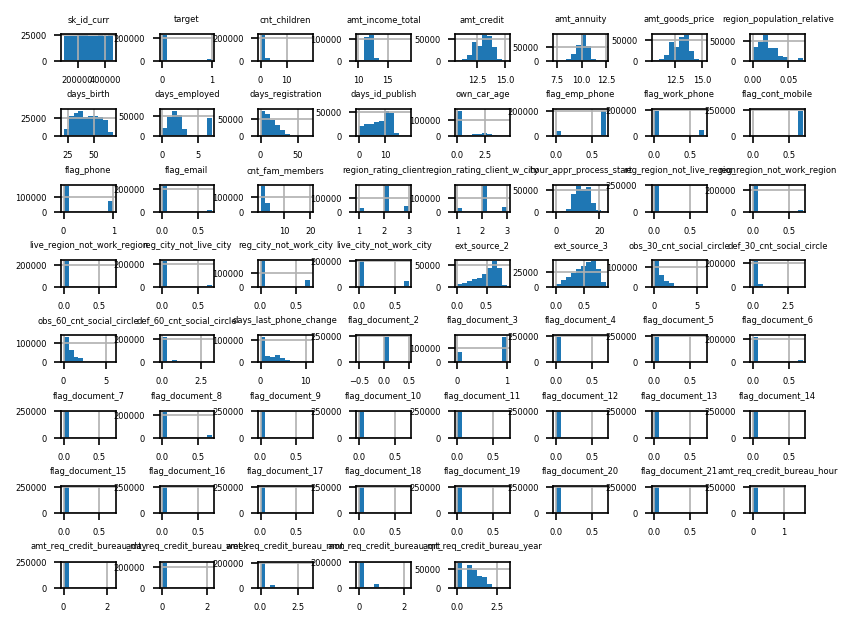

In [37]:
plt.figure(figsize=(8,8))
plt.rcParams['figure.dpi'] = 150
fig = df2.hist(xlabelsize=4, ylabelsize = 4)
[x.title.set_size(4) for x in fig.ravel()]
plt.subplots_adjust(hspace=1.8, wspace=0.8)
plt.show()

target: Highly imbalanced with most data points in one category.

cnt_children: Requires bucketing into categories (e.g., 0, 1-2, 3+).

amt_income_total and other "amt_" prefixed columns: Right-skewed distribution. Can consider log transformation or binning to handle skewness. Check for outliers.

days_birth, days_employed, days_registration, days_id_publish: Can consider transforming days to years for better interpretability; and investigate outliers.

flag_mobil, flag_emp_phone, flag_work_phone and other "flag_" prefixed columns: Binary flags with imbalanced distribution. Can examine correlation with target variable. And thereby, dropping if low variance or if they don't provide meaningful insights.

region_population_relative: Few peaks suggesting some specific regions are more represented.

columns related to "document": Majority of values are concentrated at 0. Can consider combining related columns.

columns related to "social_circle": Right-skewed distribution. These could indicate the number of observations of client's social surroundings. Investigate any outliers, and consider transformations or binning.

columns related to "bureau": Varying distributions. Needs investigation for the significance of each column.

In [38]:
# function to plot distribution and box plot to assess univariate relation for numerical variables

def univatriate_analysis (df):
    
    numeric_column = df.select_dtypes(include='number')
    
    for cols in numeric_column:
        
        # distplot
        fig, axes = plt.subplots(ncols = 2, nrows = 1, figsize=(8, 3))
        plt.subplots_adjust(wspace = 0.8)
        sns.distplot(df[cols], kde=True, ax=axes[0], color='c')
        axes[0].set_title('Distribution plot')
        
        # boxplot
        sns.boxplot(data = df, y = cols, ax=axes[1], color='c')
        axes[1].set_title('Box plot')
        plt.show()
        
        # outlier detection
        col = df[cols]
        IQR = np.percentile(col, 75) - np.percentile(col, 25)
        cutoff = IQR * 1.5
        upper_bound = np.percentile(col, 75) + cutoff
        lower_bound = np.percentile(col, 25) - cutoff
        outliers = df[(col < lower_bound) | (col > upper_bound)]
        print(f'{cols}, no of outliers {len(outliers)}')

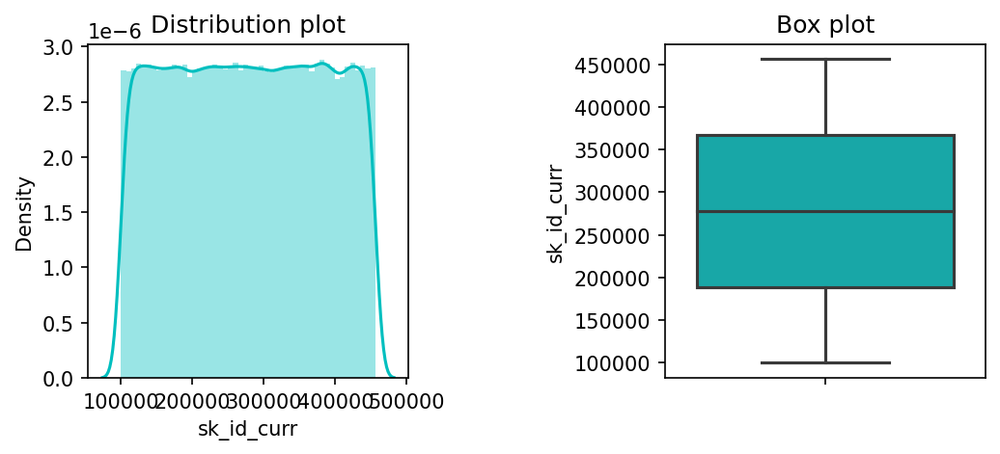

sk_id_curr, no of outliers 0


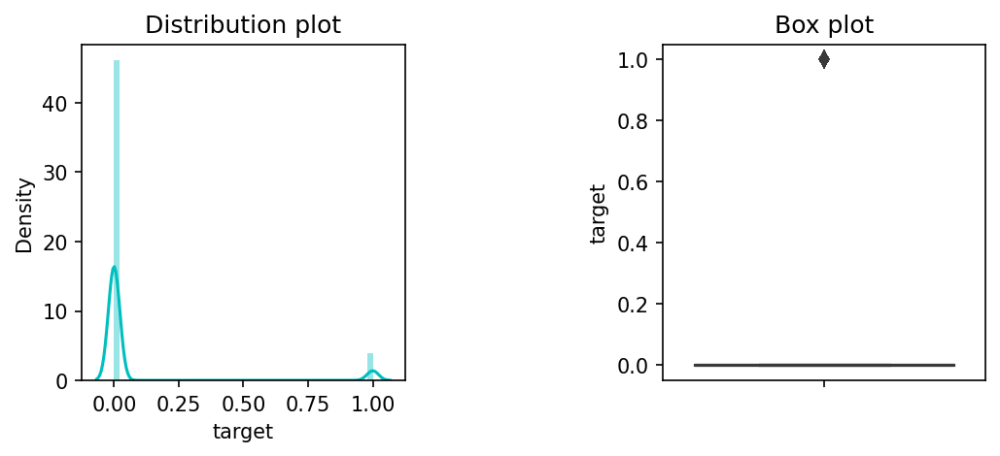

target, no of outliers 19032


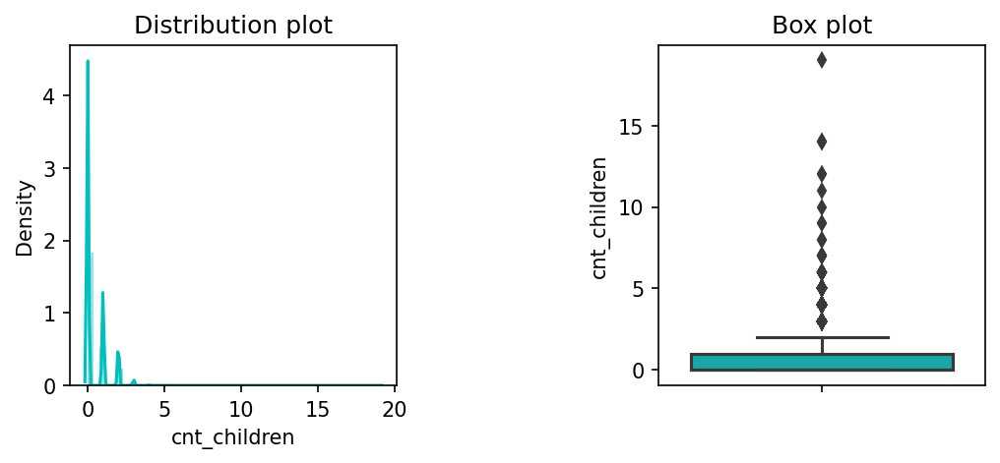

cnt_children, no of outliers 3448


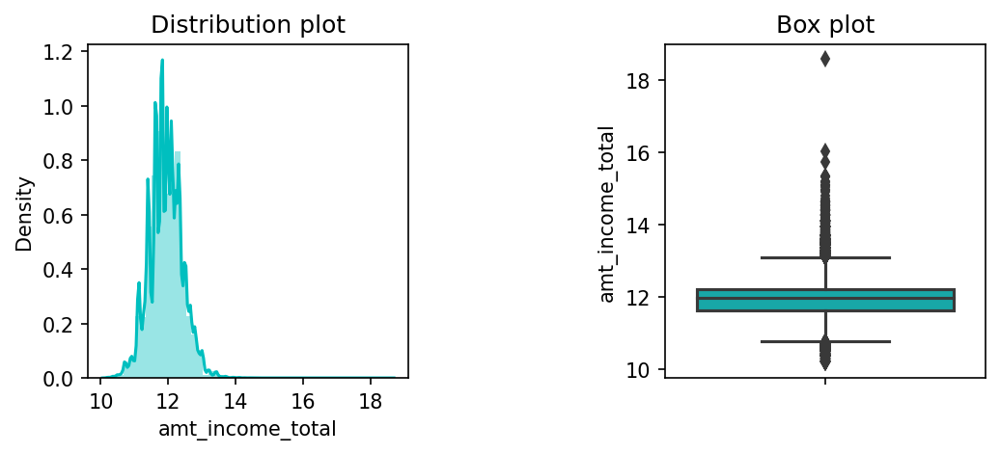

amt_income_total, no of outliers 4882


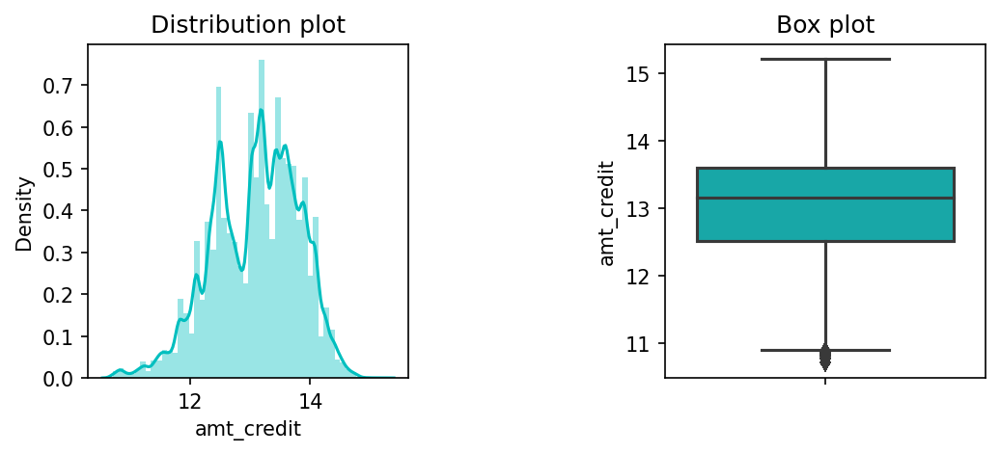

amt_credit, no of outliers 932


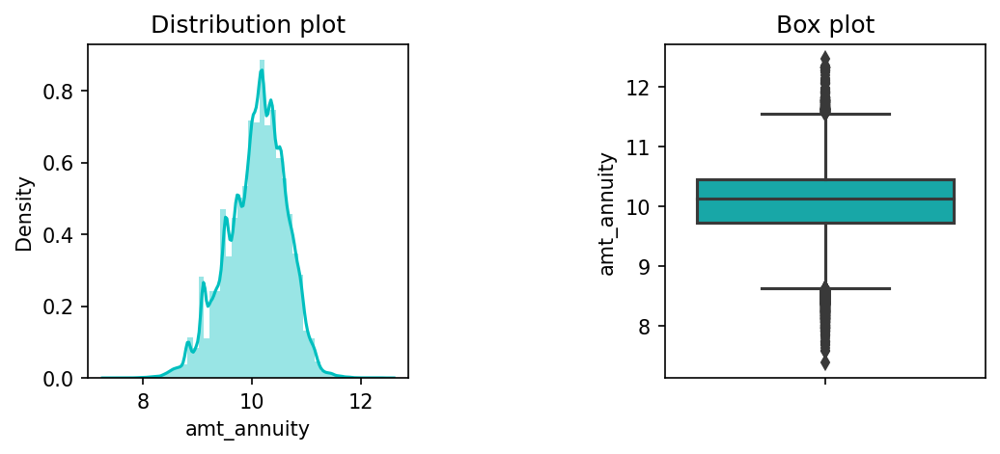

amt_annuity, no of outliers 1913


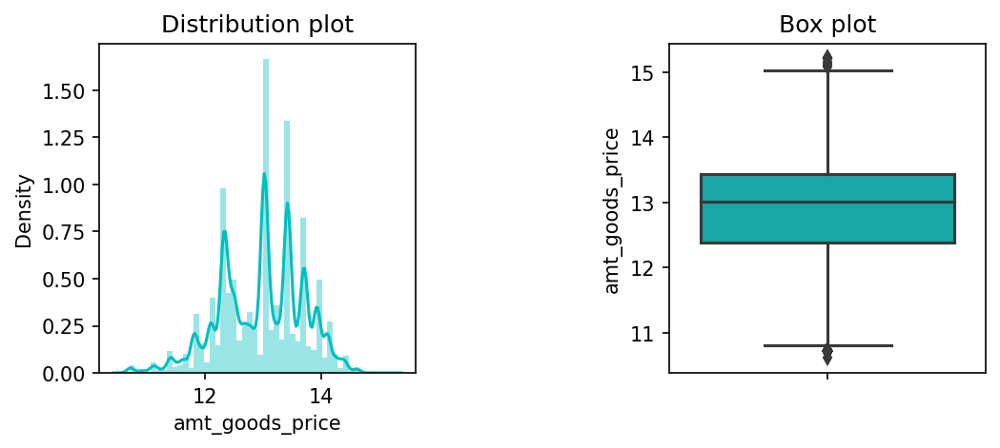

amt_goods_price, no of outliers 937


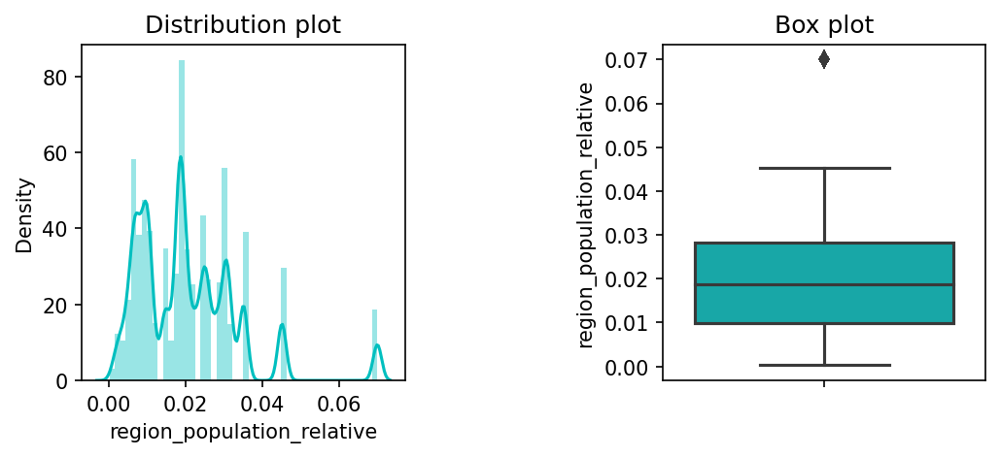

region_population_relative, no of outliers 6393


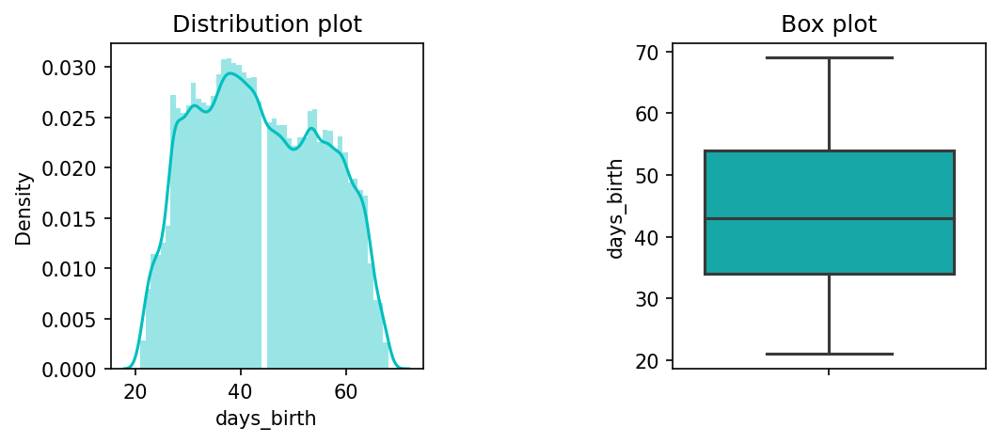

days_birth, no of outliers 0


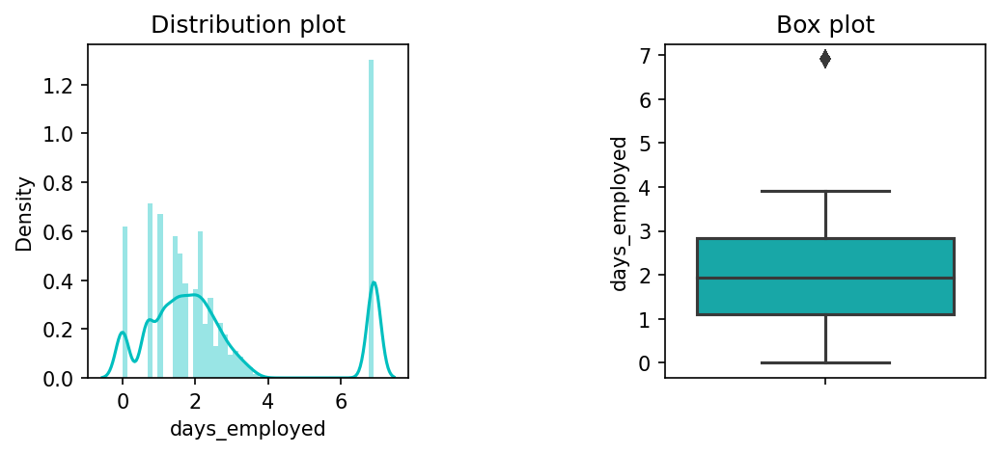

days_employed, no of outliers 43909


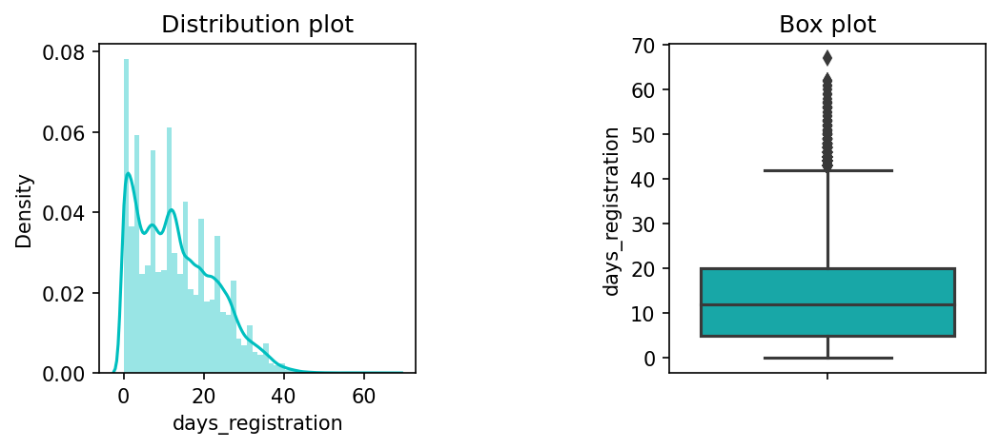

days_registration, no of outliers 505


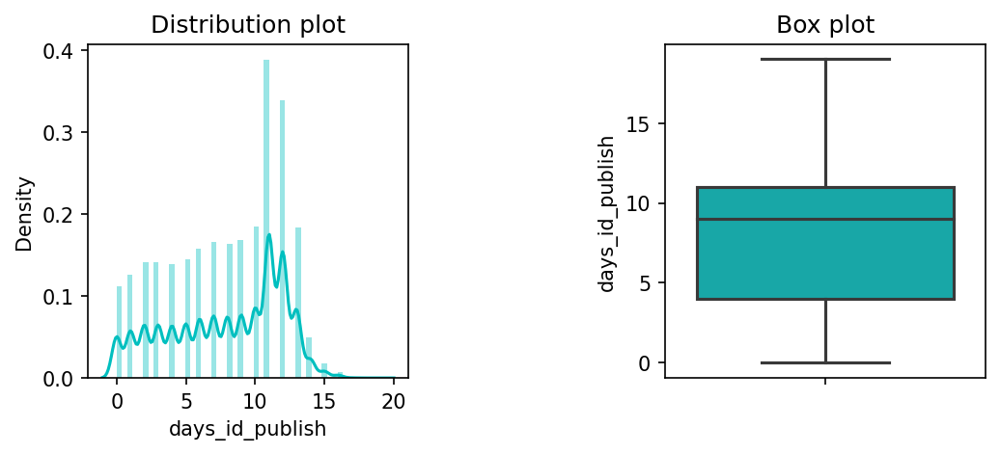

days_id_publish, no of outliers 0


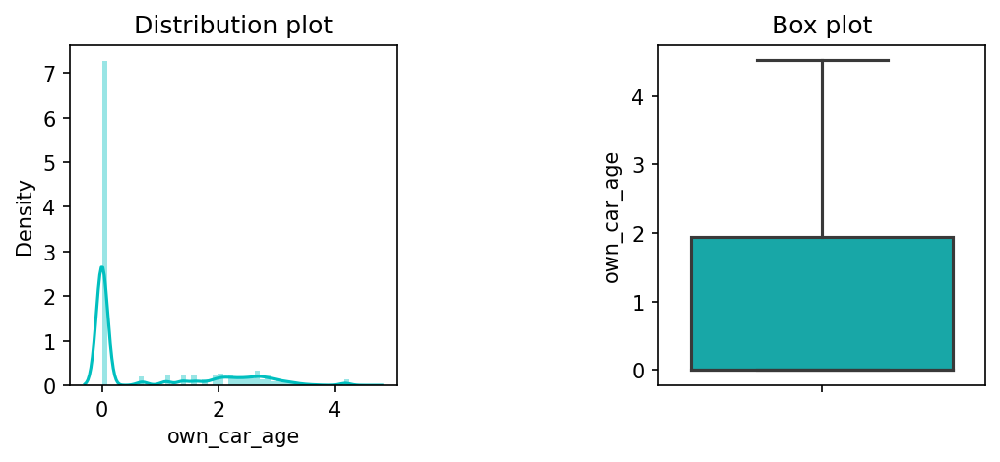

own_car_age, no of outliers 0


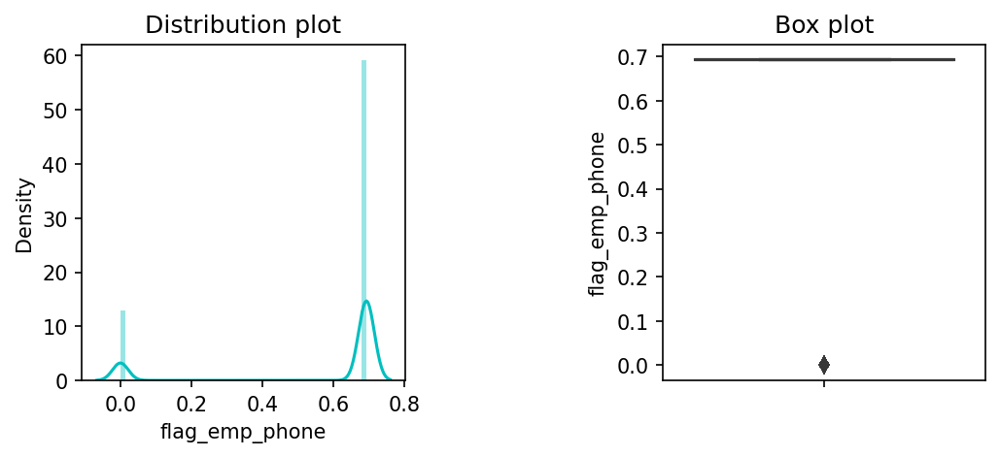

flag_emp_phone, no of outliers 43918


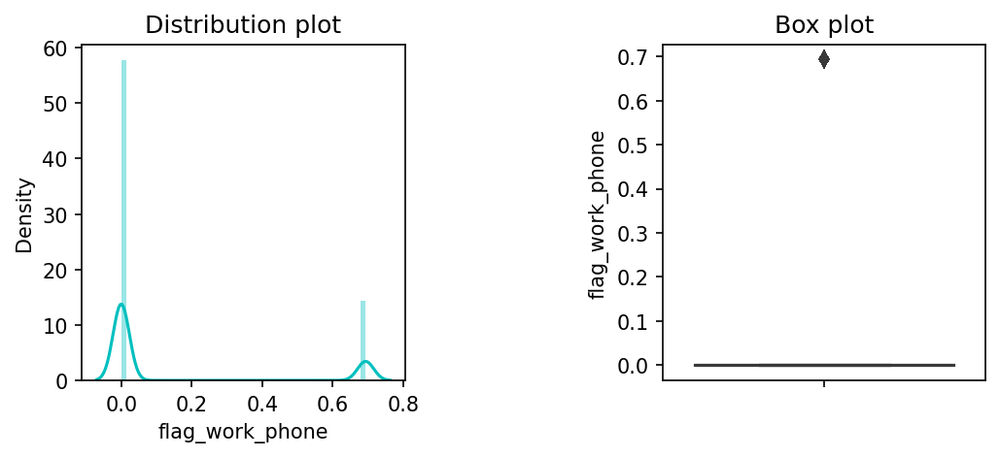

flag_work_phone, no of outliers 48733


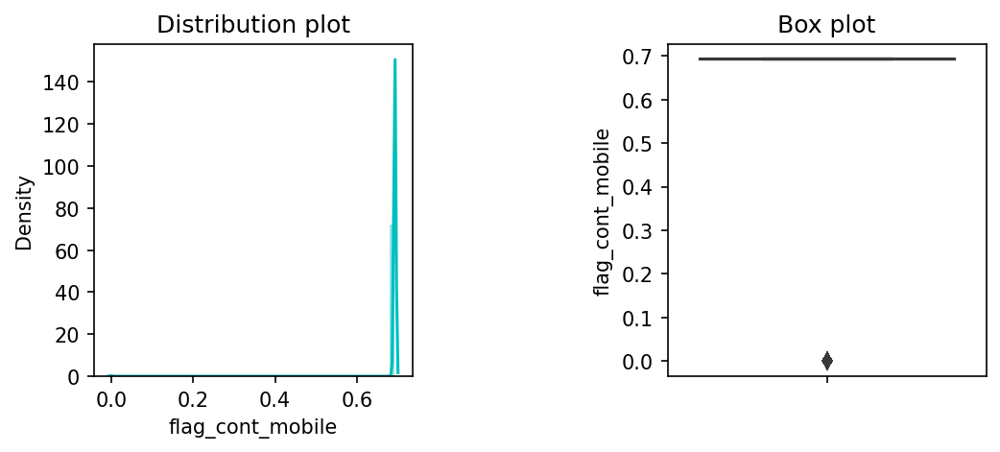

flag_cont_mobile, no of outliers 482


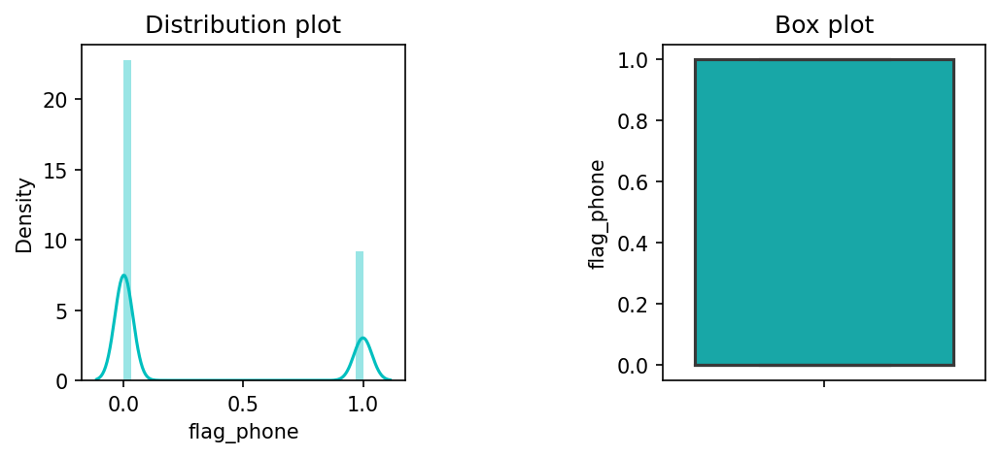

flag_phone, no of outliers 0


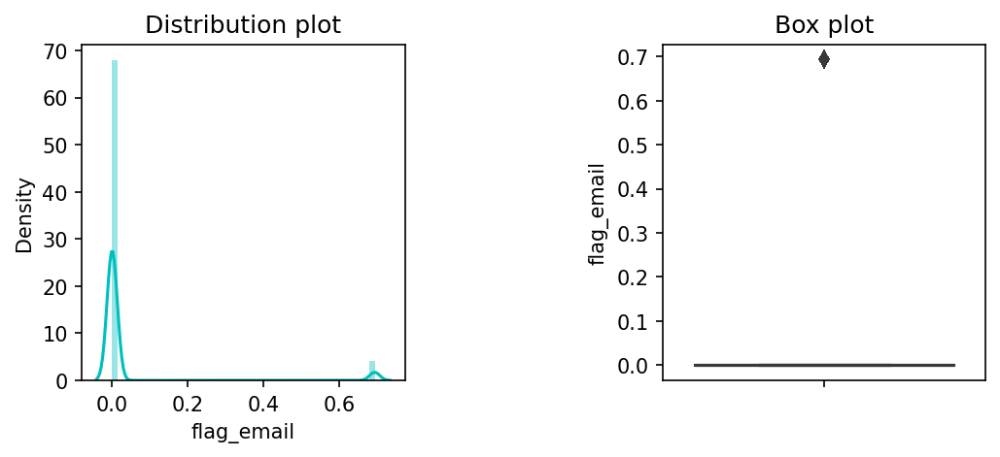

flag_email, no of outliers 14305


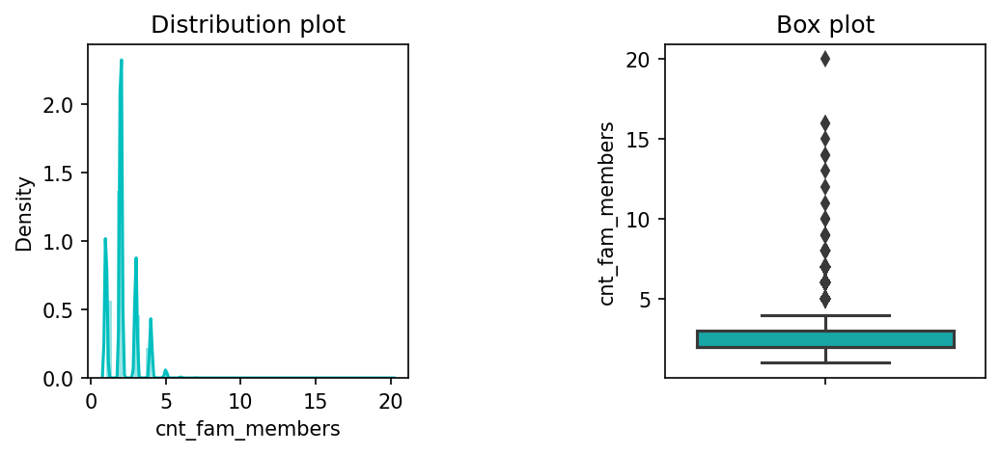

cnt_fam_members, no of outliers 3244


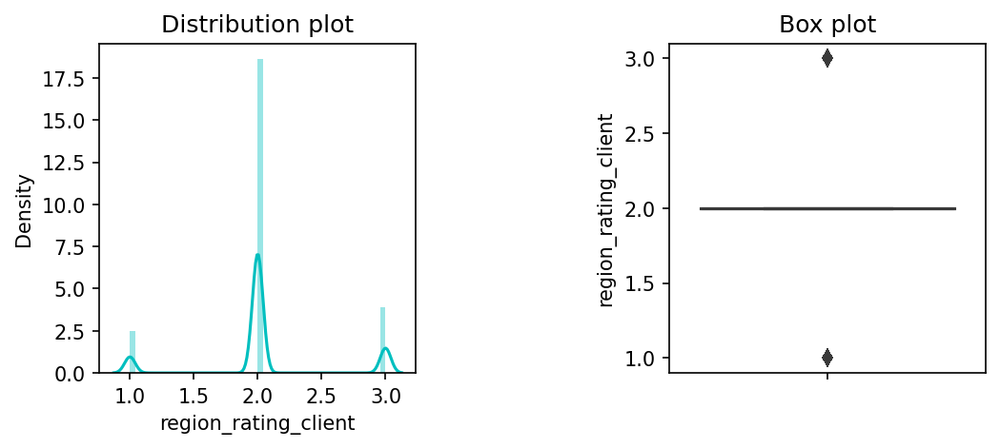

region_rating_client, no of outliers 62352


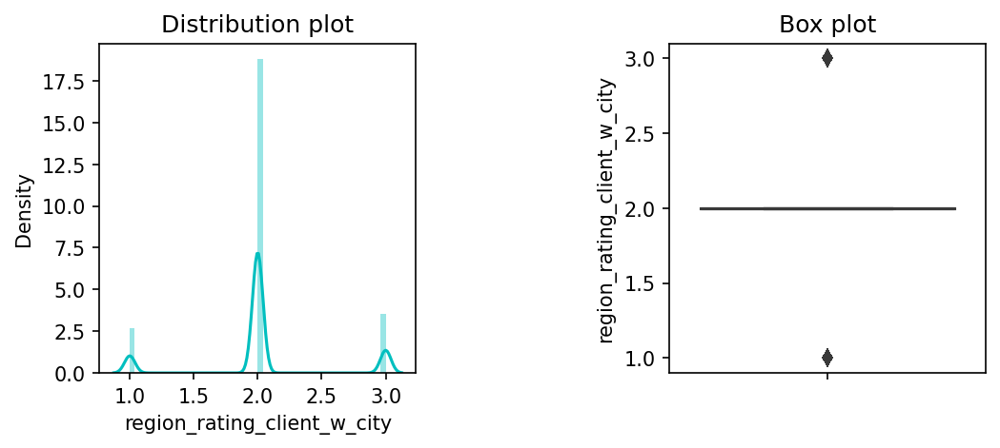

region_rating_client_w_city, no of outliers 60578


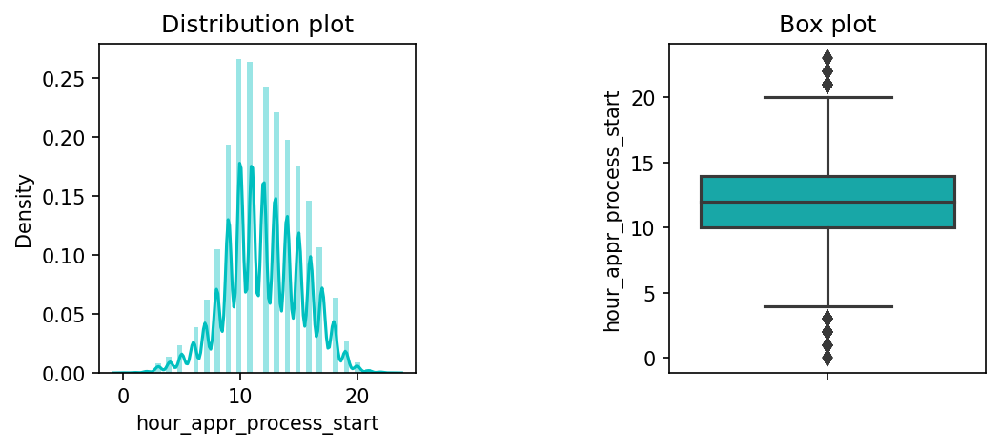

hour_appr_process_start, no of outliers 1706


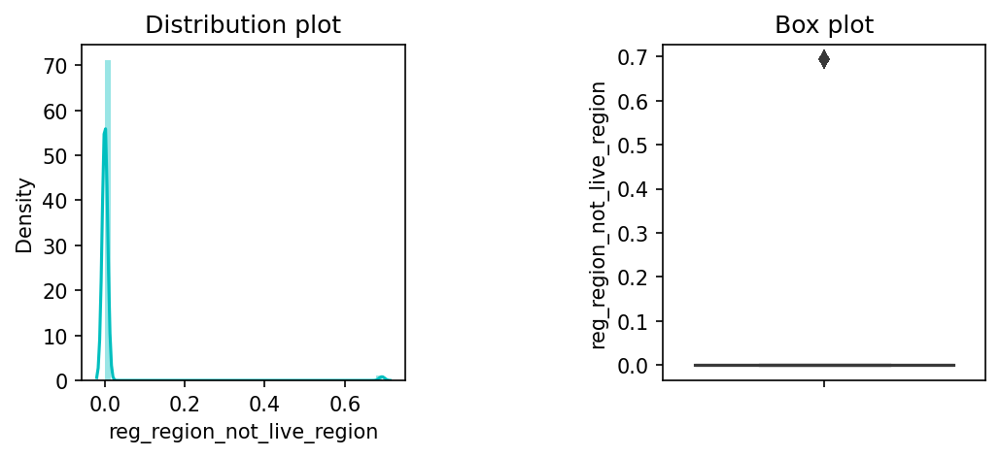

reg_region_not_live_region, no of outliers 3464


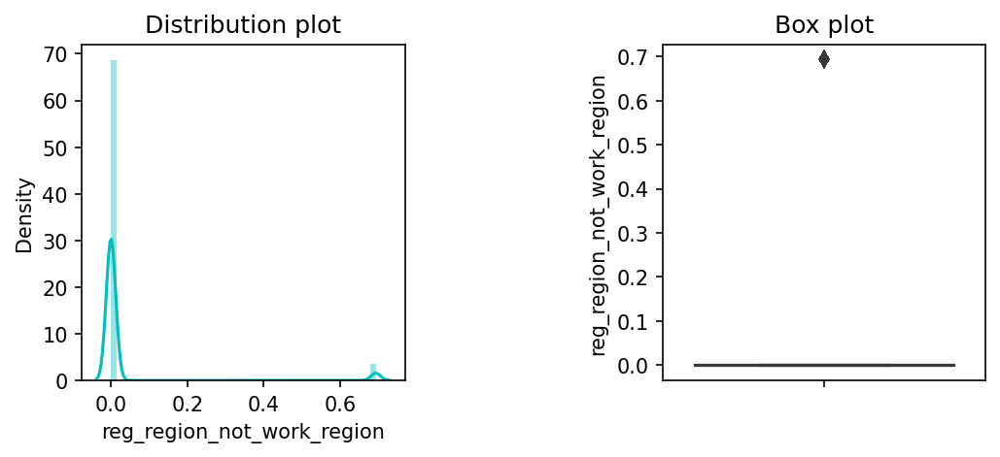

reg_region_not_work_region, no of outliers 11911


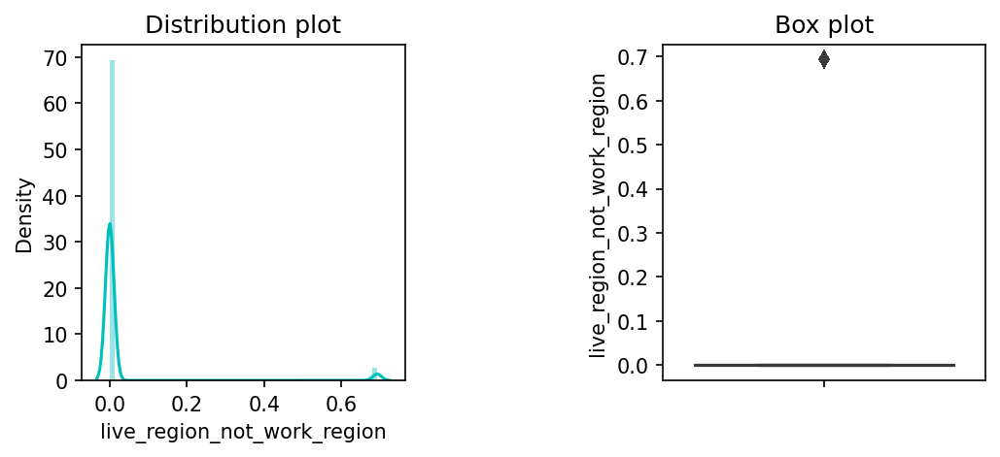

live_region_not_work_region, no of outliers 9621


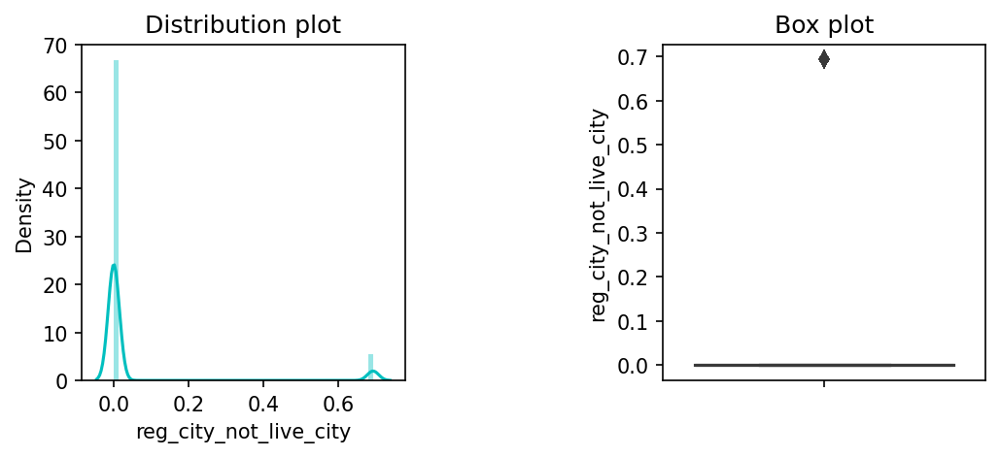

reg_city_not_live_city, no of outliers 18245


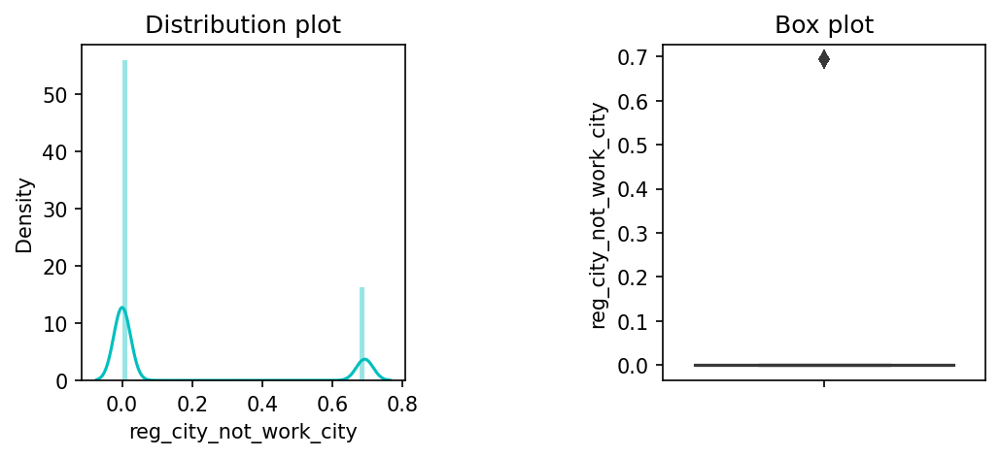

reg_city_not_work_city, no of outliers 55038


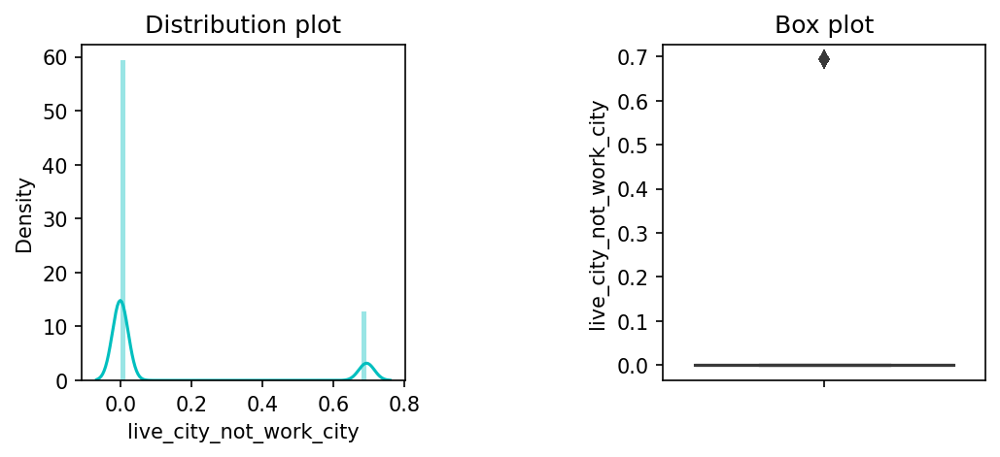

live_city_not_work_city, no of outliers 43267


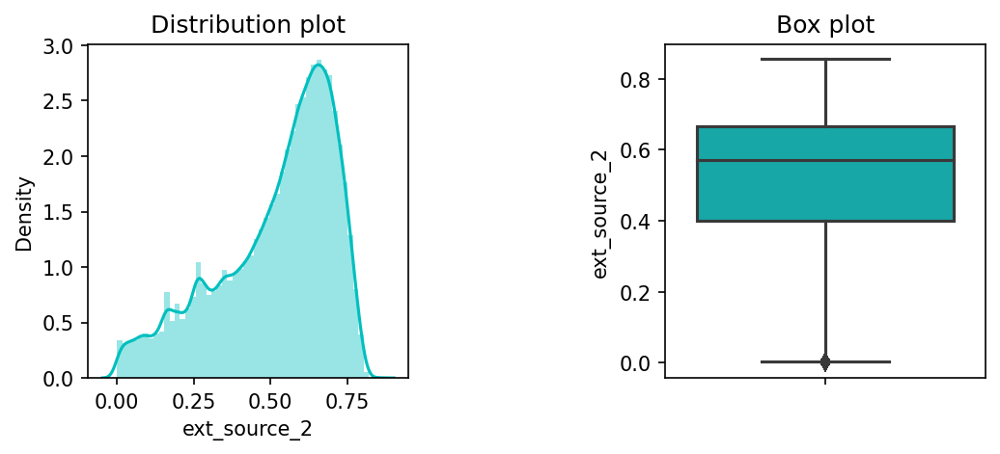

ext_source_2, no of outliers 458


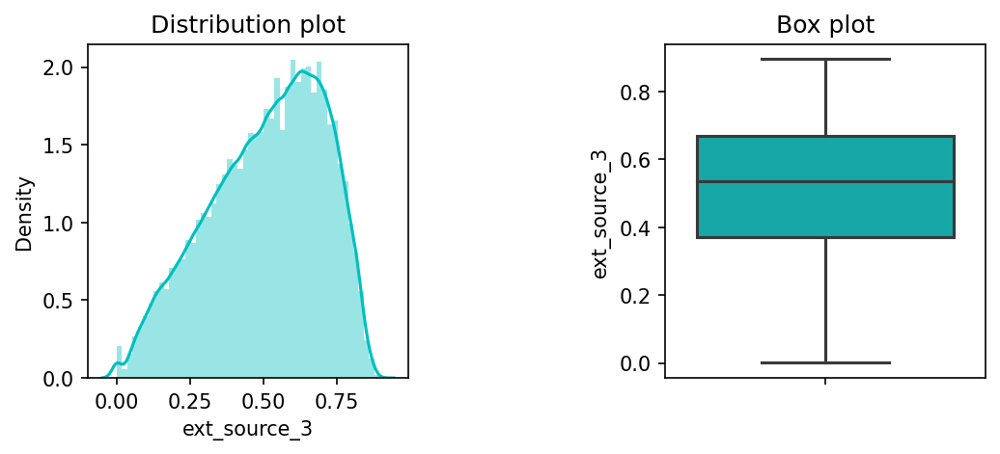

ext_source_3, no of outliers 0


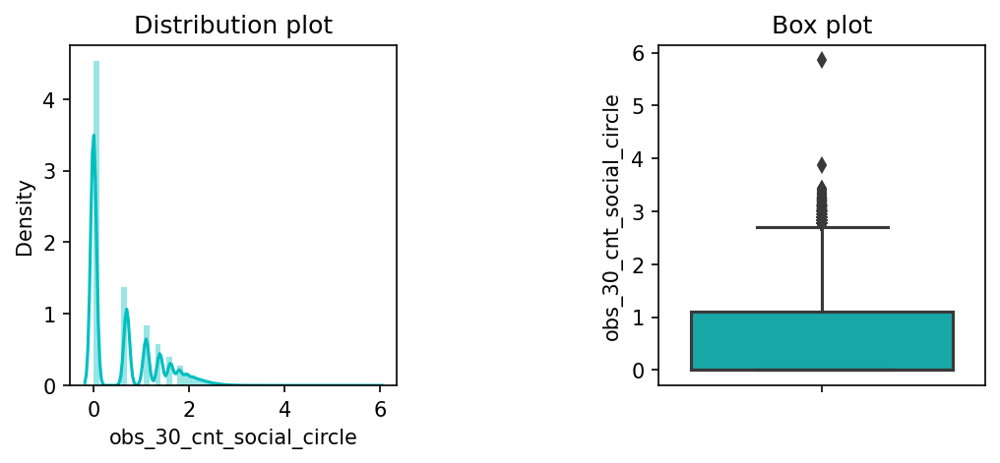

obs_30_cnt_social_circle, no of outliers 481


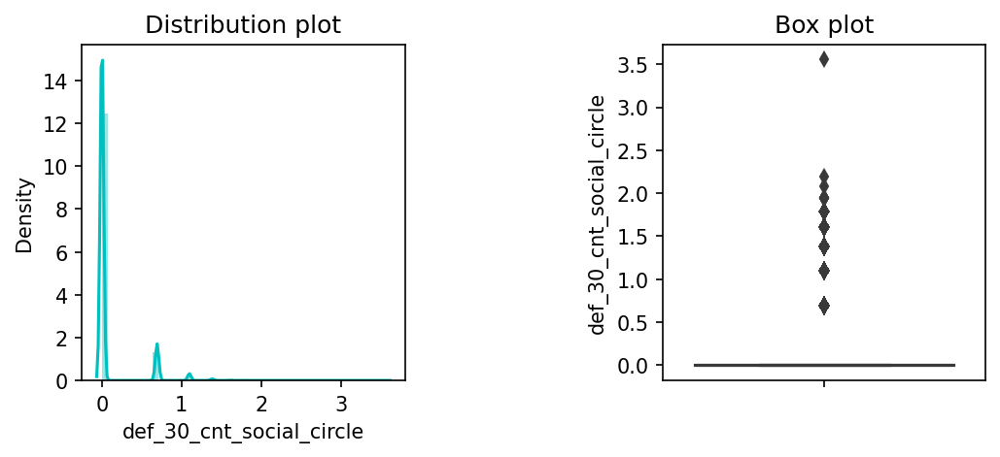

def_30_cnt_social_circle, no of outliers 28261


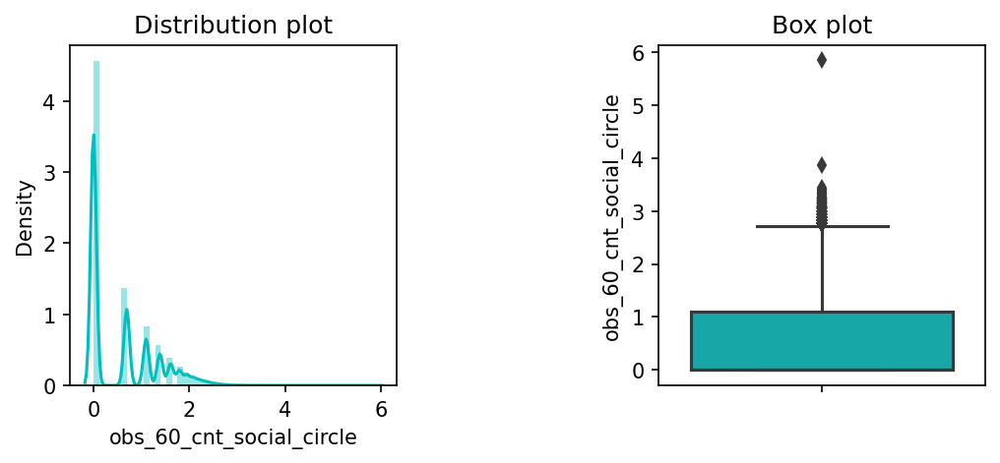

obs_60_cnt_social_circle, no of outliers 471


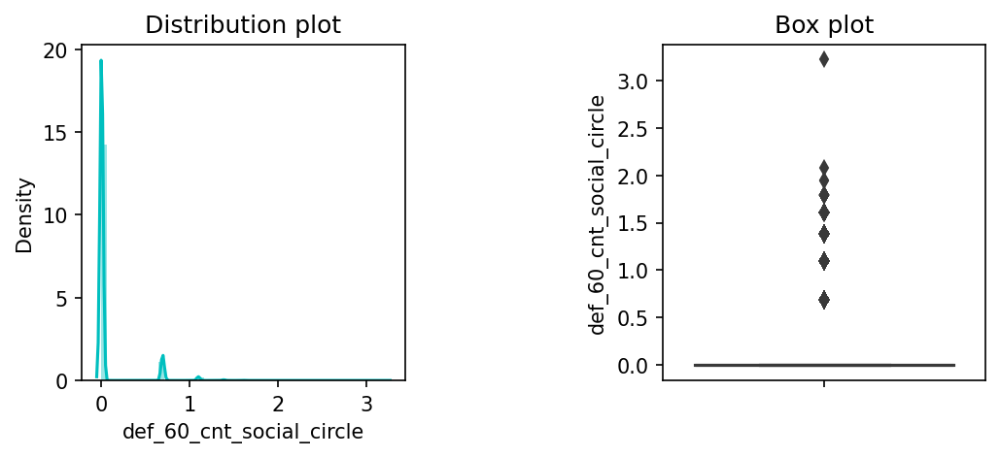

def_60_cnt_social_circle, no of outliers 20598


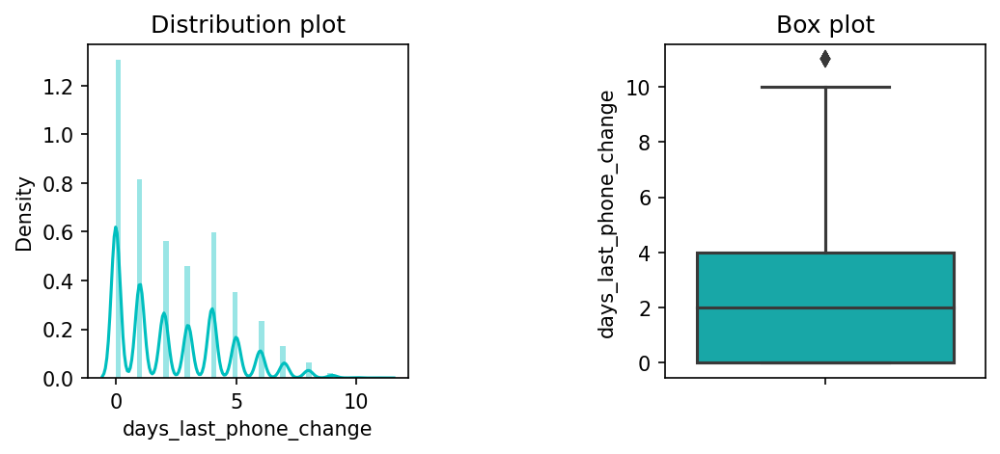

days_last_phone_change, no of outliers 23


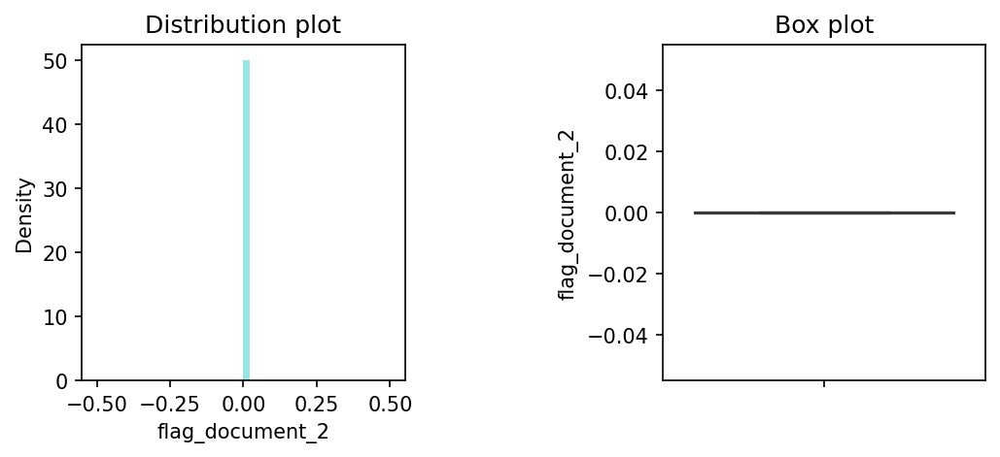

flag_document_2, no of outliers 0


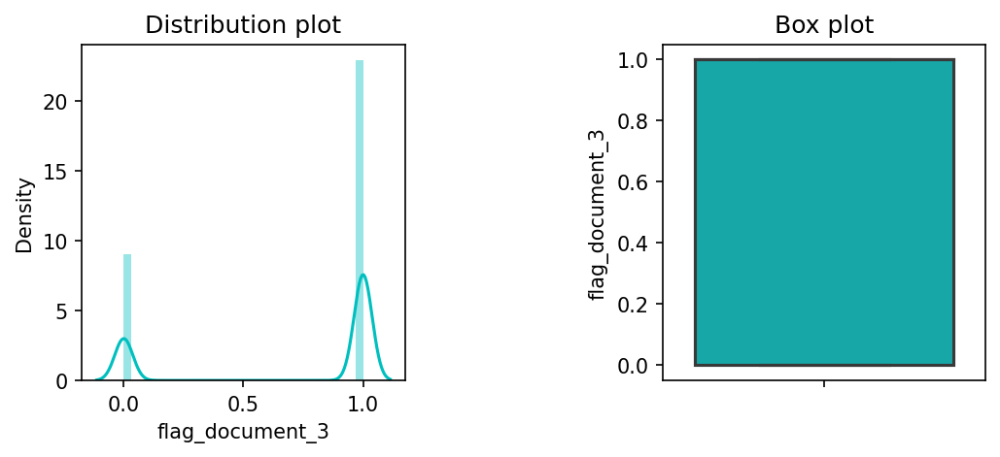

flag_document_3, no of outliers 0


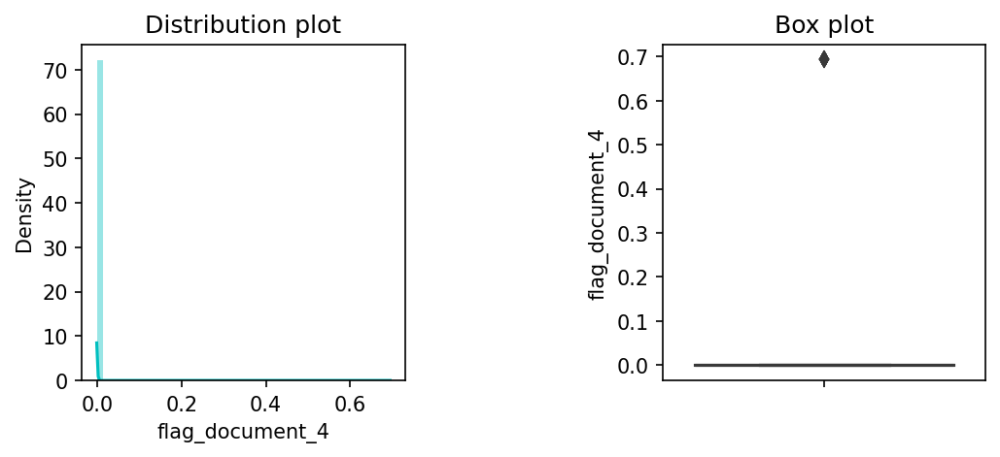

flag_document_4, no of outliers 20


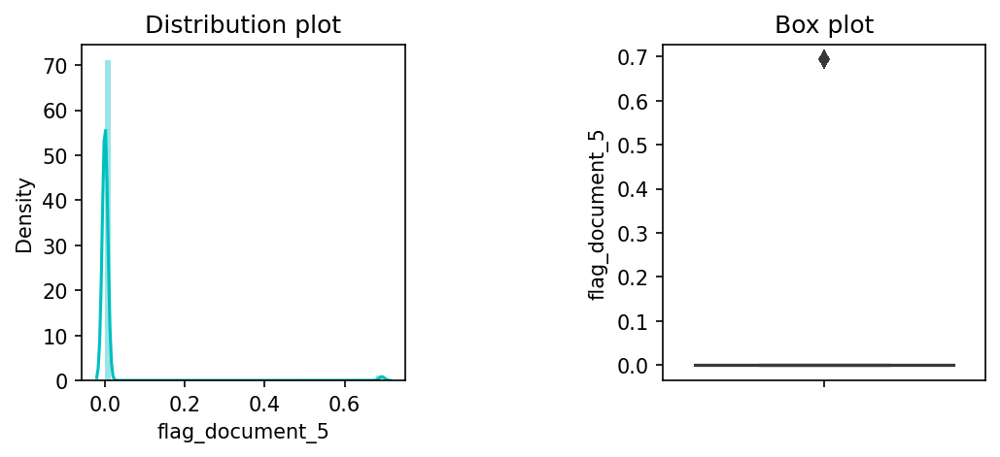

flag_document_5, no of outliers 3579


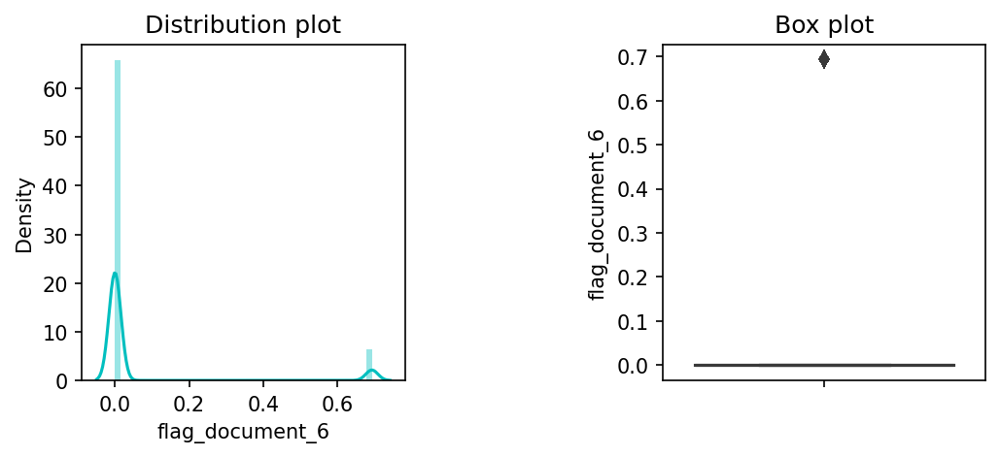

flag_document_6, no of outliers 21470


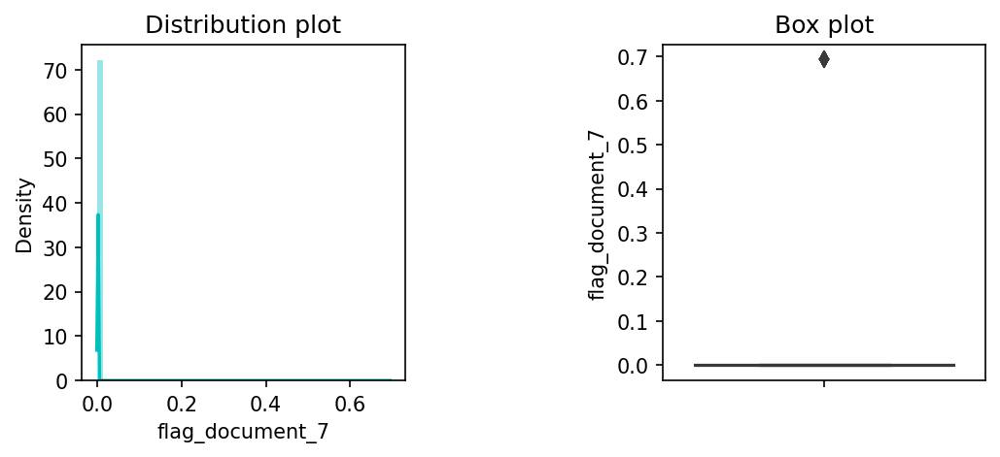

flag_document_7, no of outliers 31


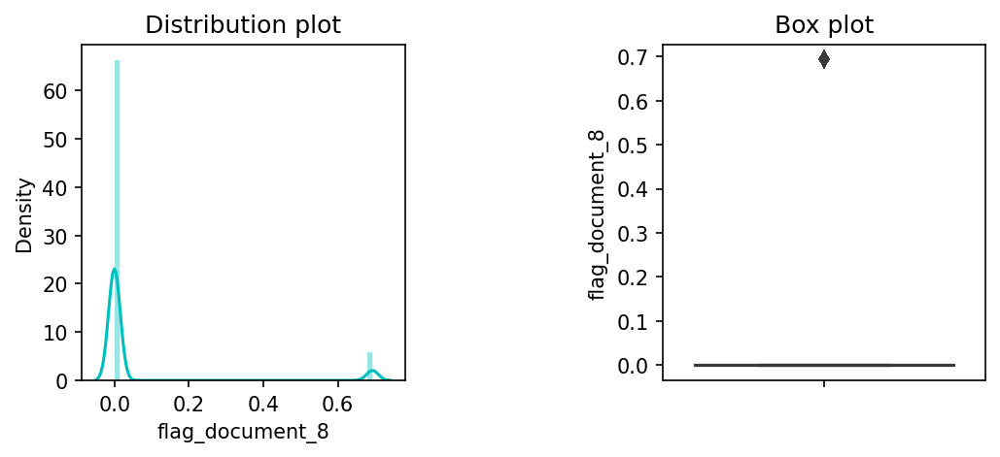

flag_document_8, no of outliers 19924


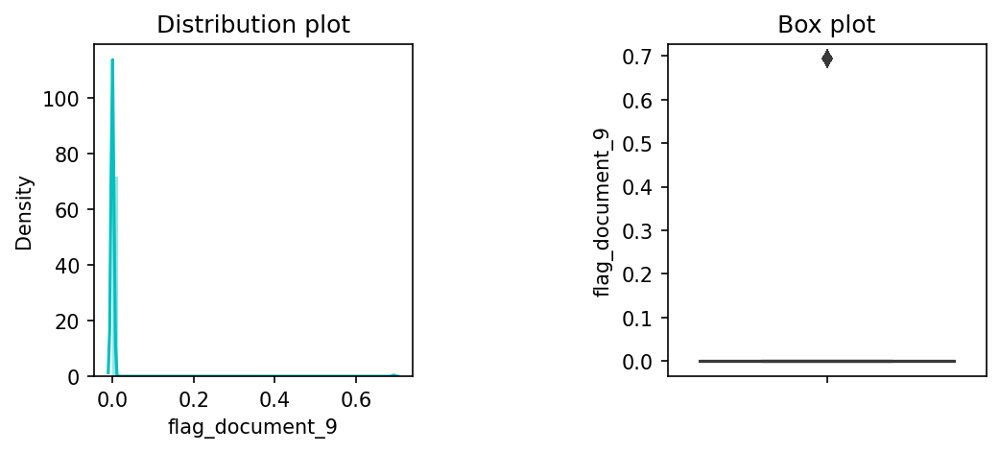

flag_document_9, no of outliers 880


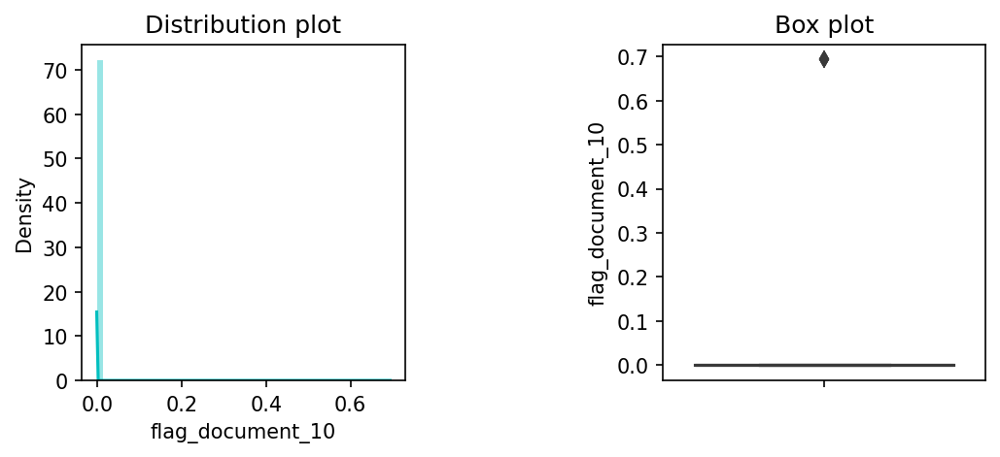

flag_document_10, no of outliers 6


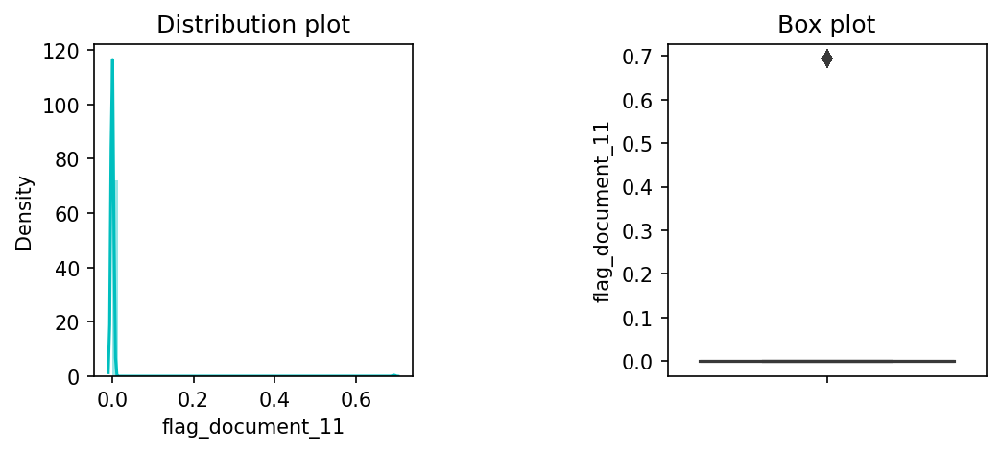

flag_document_11, no of outliers 803


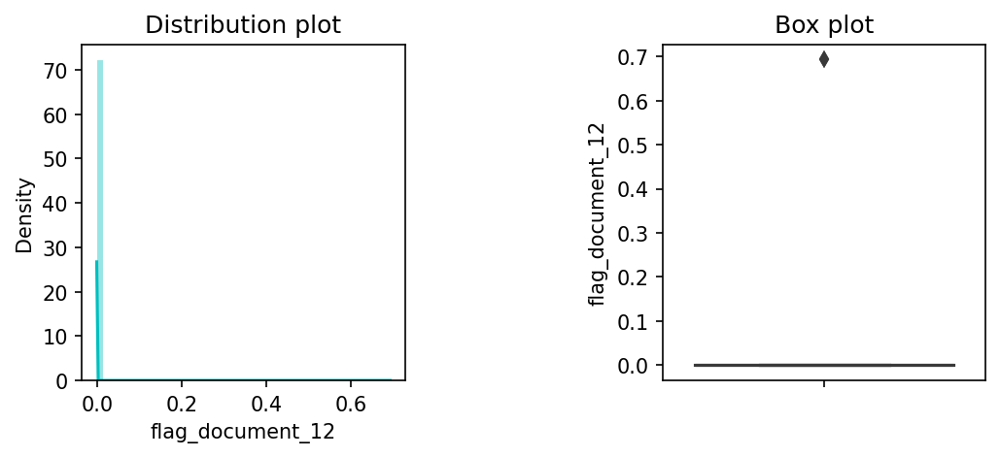

flag_document_12, no of outliers 2


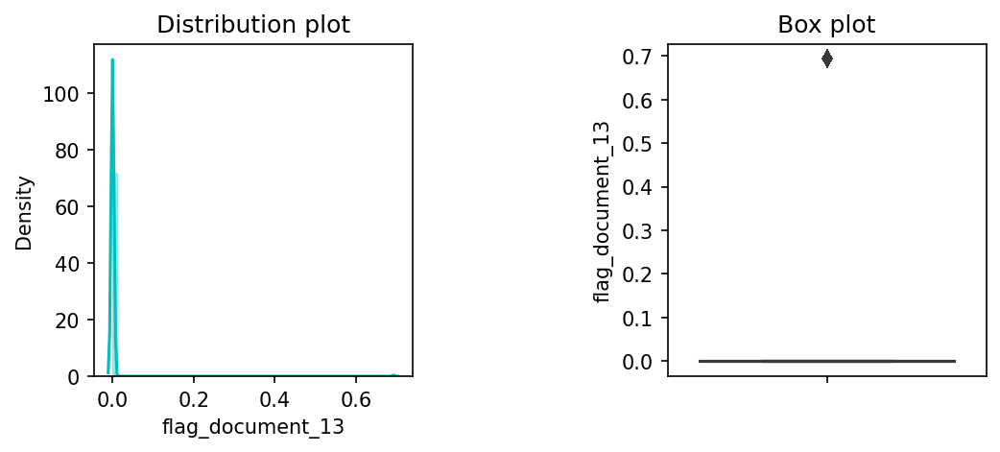

flag_document_13, no of outliers 920


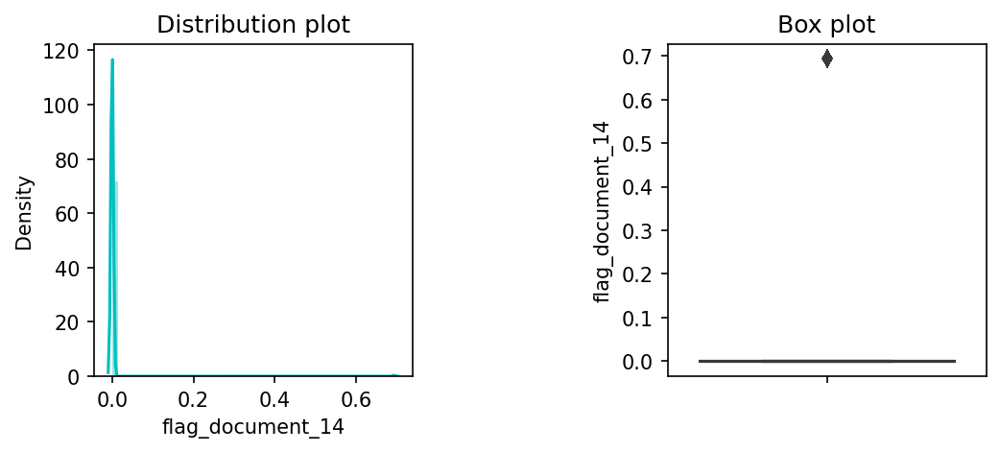

flag_document_14, no of outliers 741


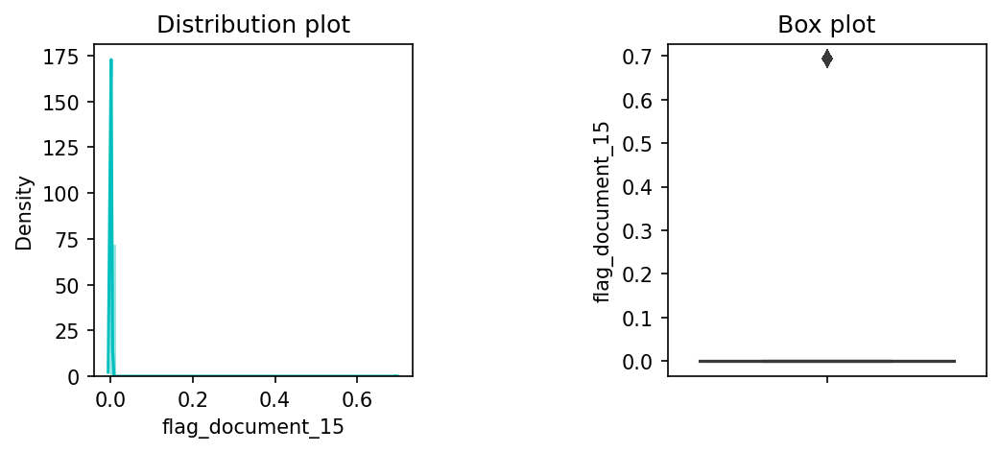

flag_document_15, no of outliers 295


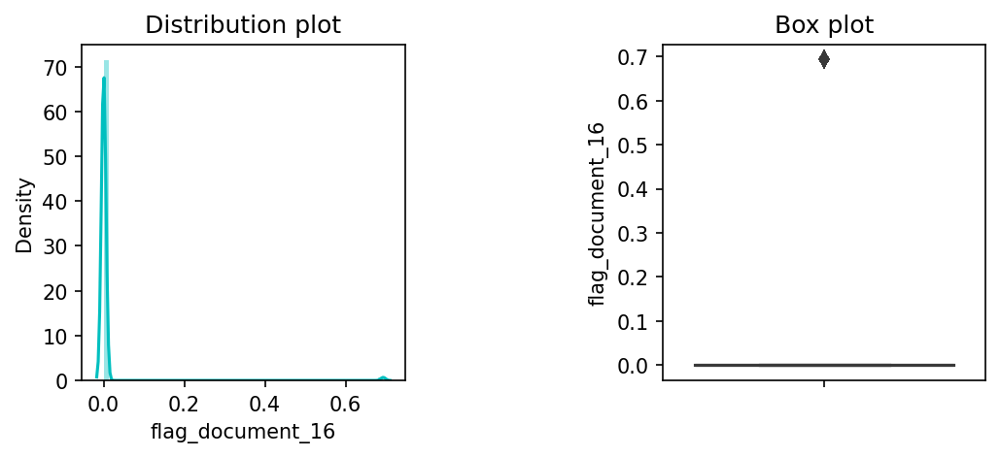

flag_document_16, no of outliers 2437


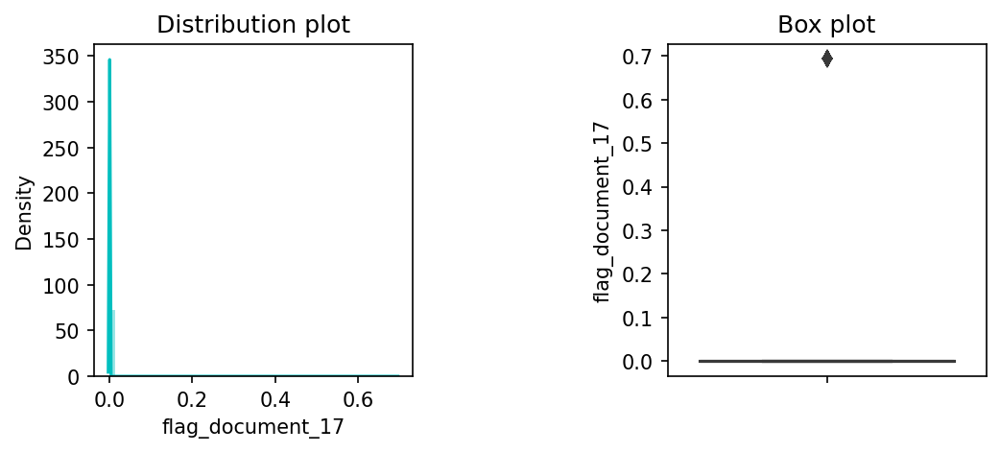

flag_document_17, no of outliers 71


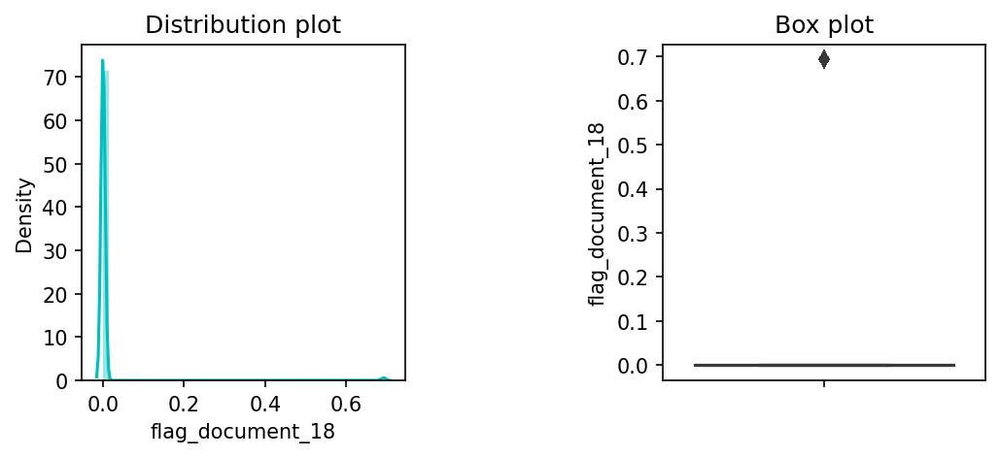

flag_document_18, no of outliers 2005


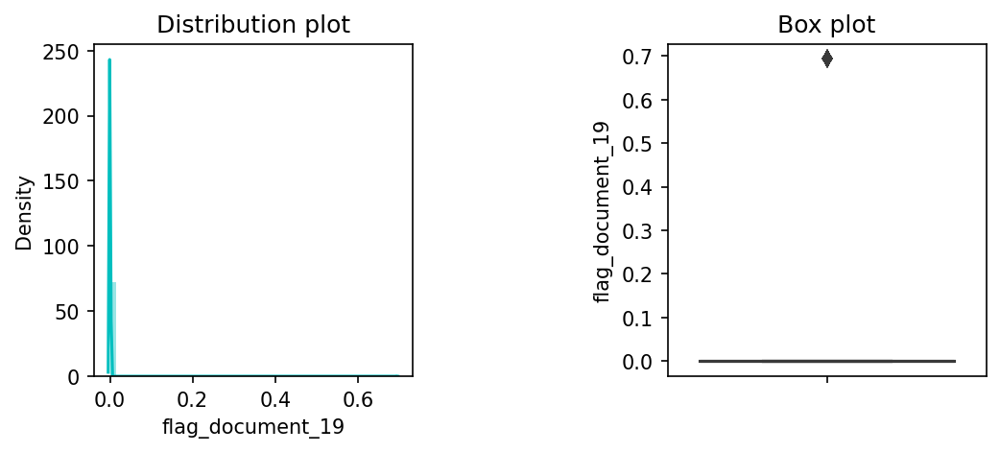

flag_document_19, no of outliers 148


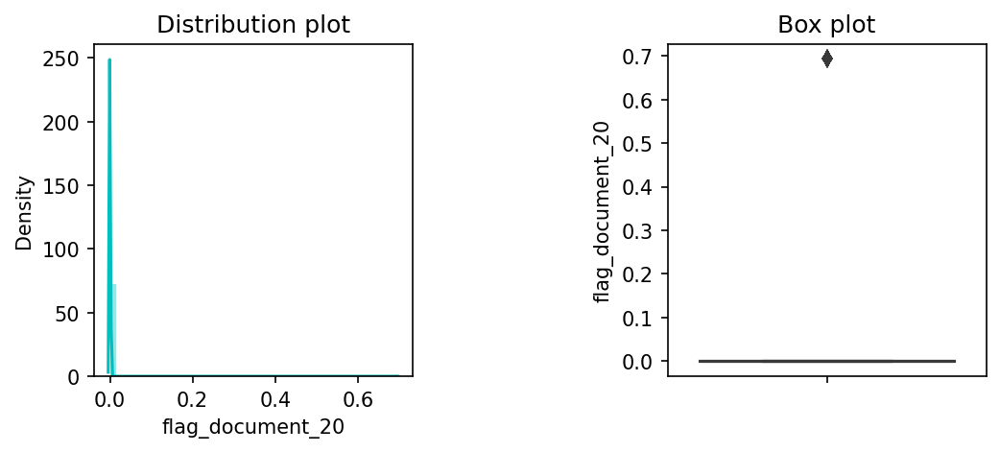

flag_document_20, no of outliers 145


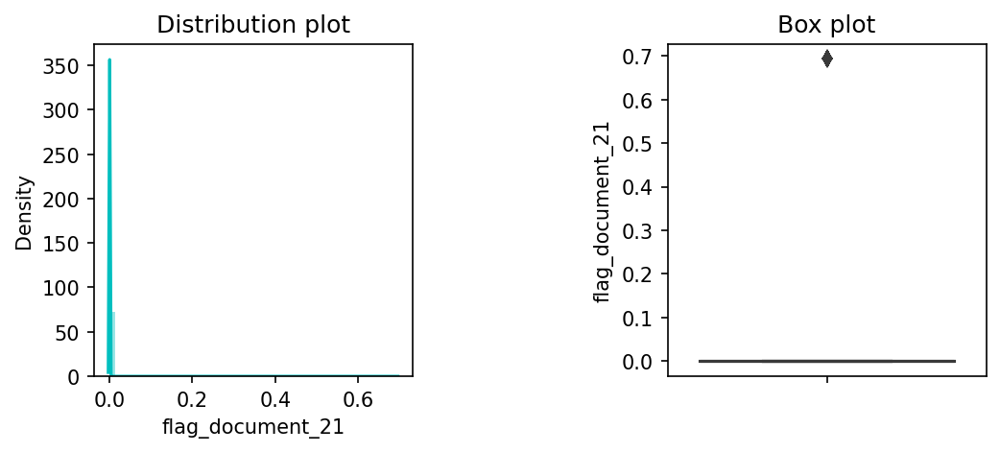

flag_document_21, no of outliers 78


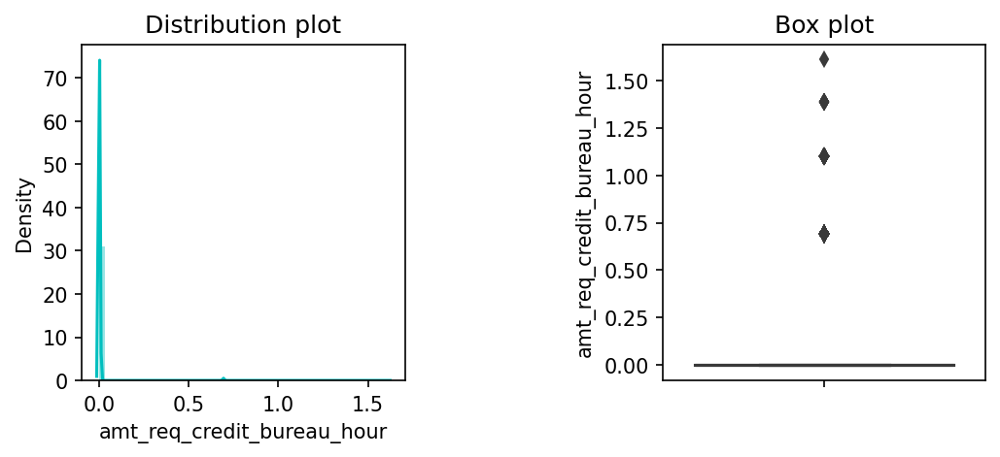

amt_req_credit_bureau_hour, no of outliers 1487


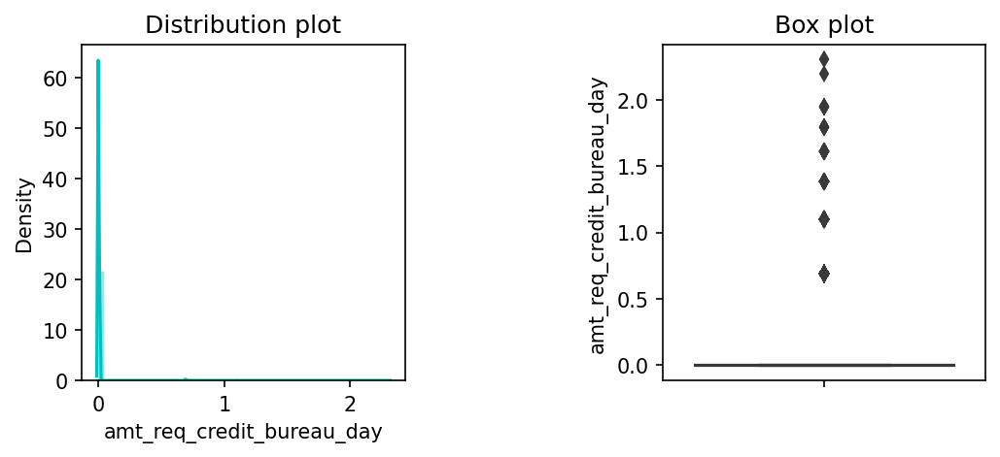

amt_req_credit_bureau_day, no of outliers 1348


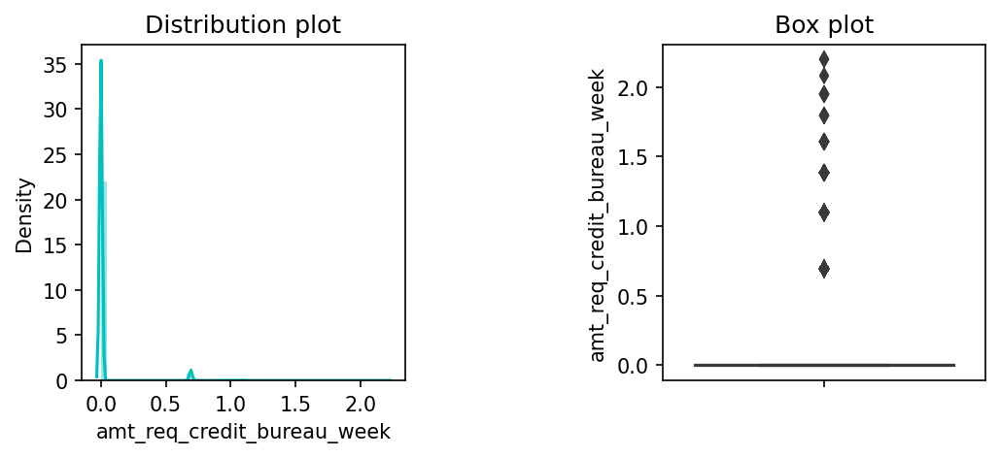

amt_req_credit_bureau_week, no of outliers 7889


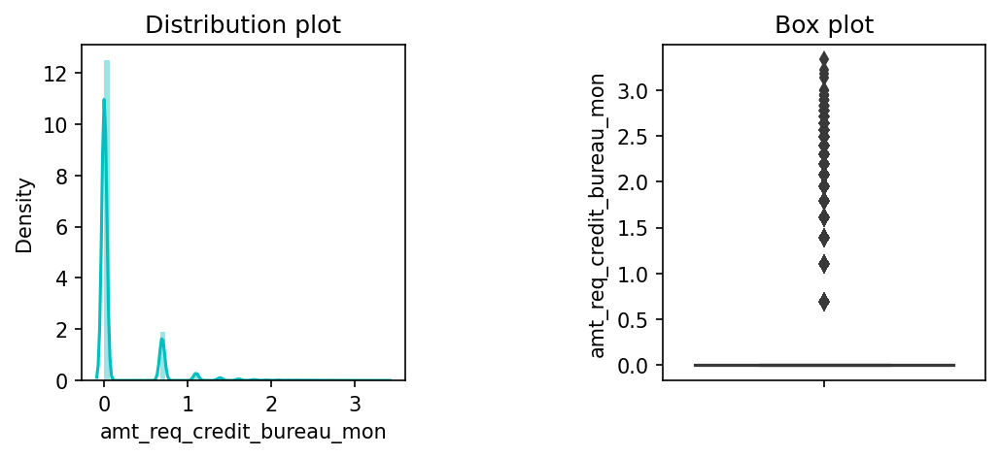

amt_req_credit_bureau_mon, no of outliers 40951


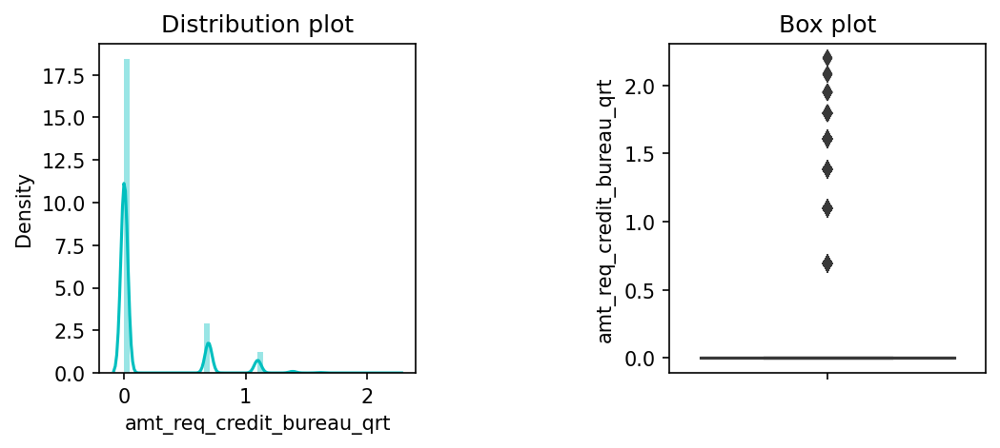

amt_req_credit_bureau_qrt, no of outliers 46519


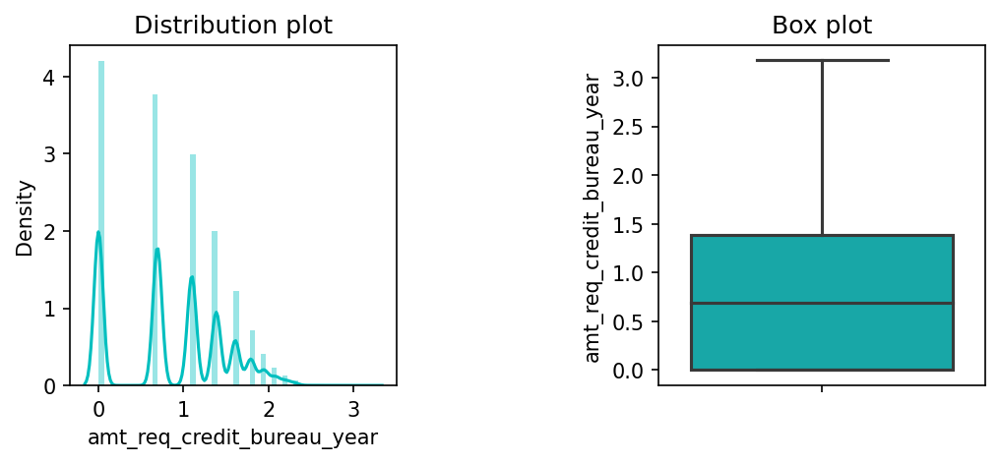

amt_req_credit_bureau_year, no of outliers 0


In [39]:
univatriate_analysis (df2)

In [40]:
print(len(df2[df2['target'] == 0]))
print(len(df2[df2['target'] == 1]))

225246
19032


In [41]:
def outlier_treatment(df, target_column, target_value=0):
    
    numeric_df = df.select_dtypes(include='number')
    numeric_df = numeric_df.iloc[:, 2:]
    
    # Sorting columns based on their skewness
    sorted_cols = numeric_df.apply(lambda x: x.skew()).abs().sort_values().index.tolist()

    for cols in sorted_cols: # treating columns with lesser skewness first, so rows dropped due to outliers in these columns won't impact the treatment of more skewed columns.
        col = df[cols]
        
        # outlier detection
        IQR = np.percentile(col, 75) - np.percentile(col, 25)
        cutoff = IQR * 1.5
        upper_bound = np.percentile(col, 75) + cutoff
        lower_bound = np.percentile(col, 25) - cutoff
        
        upper_outliers_mask = (df[cols] > upper_bound)
        lower_outliers_mask = (df[cols] < lower_bound)
        
        # Combine the masks
        outliers_mask = upper_outliers_mask | lower_outliers_mask
        outliers = df[outliers_mask]
        
        print(cols)
        
        # treating outliers            
        if not outliers.empty:
            if col.skew() <= 20:
                outliers_target = outliers[outliers[target_column] == target_value]
                # balancing dataset by dropping rows with outliers with the target as 0
                if not outliers_target.empty:
                    df.drop(index=outliers_target.index, inplace=True)
                    print(f'Total rows after dropping: {df.shape[0]}')
                
                # Re-evaluate outliers after dropping rows and replace with quartiles
                df.loc[df[cols] > upper_bound, cols] = df[cols].quantile(0.75)
                df.loc[df[cols] < lower_bound, cols] = df[cols].quantile(0.25)
                df = df.reset_index(drop=True)
            else:
                # Replace with upper or lower quartile directly
                df.loc[upper_outliers_mask, cols] = df[cols].quantile(0.75)
                df.loc[lower_outliers_mask, cols] = df[cols].quantile(0.25)
                
        print(df[cols].skew())
        print()
        
    return df

In [43]:
df2 = outlier_treatment (df2, 'target', target_value=0)

flag_document_2
0

hour_appr_process_start
Total rows after dropping: 242702
0.03889583044616771

amt_req_credit_bureau_year
0.018627694927154548

region_rating_client_w_city
Total rows after dropping: 187324
0

region_rating_client
Total rows after dropping: 184753
0

days_birth
0.11245748807413937

amt_income_total
Total rows after dropping: 181913
0.06411348761313525

amt_goods_price
Total rows after dropping: 181145
-0.24399153919105426

amt_annuity
Total rows after dropping: 180313
-0.2893001897353256

amt_credit
-0.27452092681563806

days_id_publish
-0.3901967324928914

ext_source_3
-0.40787942032256796

days_registration
Total rows after dropping: 179993
0.5375046923230338

days_last_phone_change
Total rows after dropping: 179985
0.7346051549778586

ext_source_2
Total rows after dropping: 179374
-0.825061984788403

obs_30_cnt_social_circle
Total rows after dropping: 179027
0.8147599799736231

obs_60_cnt_social_circle
0.822832597304836

flag_phone
1.0038800295593973

flag_documen

In [44]:
df2.shape

(50546, 73)

In [45]:
print(len(df2[df2['target'] == 0]))
print(len(df2[df2['target'] == 1]))

31514
19032


In [46]:
def biv_vizz_c(series, feature, df):
   
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 9))
    plt.subplots_adjust(hspace=0.4, wspace=0.3)
    
    # count plot
    counts_categ = pd.crosstab(df[series], df[feature])
    
    colormap = plt.cm.plasma
    patches = len(counts_categ)
    color = [colormap(i) for i in np.linspace(1, 0.1, patches)]
    
    counts_categ.T.plot.bar(stacked=True, color=color, edgecolor='none', linewidth=0, ax=ax[0])
    ax[0].set_xticks([0,1])
    ax[0].set_xticklabels(['Non-Defaulters', 'Defaulters'], rotation=0)
    ax[0].set_title(f'Non-Defaulters vs Defaulters counts for categories in {series}')
    ax[0].set_xlabel('')
    ax[0].legend_.remove()
    #ax[0][0].legend(loc='upper left', bbox_to_anchor = (1,0.5,0.5,0.5))
    
    # bar plot
    default_prop = df.groupby(series)[feature].mean().reset_index()
    
    def func(pct, allvals):
        absolute = int(pct/100.*np.sum(allvals))
        if pct < 3:
            return ""  
        else:
            return "{:.1f}%".format(pct)
    
    labels = default_prop[series]
    sizes = default_prop[feature]
    
    colormap = plt.cm.plasma
    patches = len(default_prop)
    colors = [colormap(i) for i in np.linspace(1, 0.1, patches)]
    
    wedges, texts, autotexts = ax[1].pie(sizes, startangle=90, autopct=lambda pct: func(pct, sizes), pctdistance=0.85, colors=colors)
    
    centre_circle = plt.Circle((0,0),0.70,fc='white')
    ax[1].add_artist(centre_circle)

    #for text in texts:
     #   text.set(color='grey')
    for autotext in autotexts:
        autotext.set(color='white')
        
    if len(df[series].unique()) > 10:  
        ax[1].legend(labels, title="categories", ncols=2, loc="upper left", bbox_to_anchor=(1, 0, 0.5, 1))
    else:
        ax[1].legend(labels, title="categories", loc="upper left", bbox_to_anchor=(1, 0, 0.5, 1))
    
    ax[1].set_title(f'Default% for each category in "{series}"')
    ax[1].axis('equal')
    
    
    for ax in fig.axes:
        for spine in ax.spines.values():
            spine.set_visible(False)

    
    plt.tight_layout()
    plt.show()

In [49]:
def biv_vizz_n(series, feature, df):
   
    fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(15, 9))
    plt.subplots_adjust(hspace=0.4, wspace=0.3)
    
    # count plot
    counts_categ = pd.crosstab(df[series], df[feature])
    
    colormap = plt.cm.plasma
    patches = len(counts_categ)
    color = [colormap(i) for i in np.linspace(1, 0.2, patches)]
    
    counts_categ.T.plot.bar(stacked=True, color=color, edgecolor='none', linewidth=0, ax=ax[0][0])
    ax[0][0].set_xticks([0,1])
    ax[0][0].set_xticklabels(['Non-Defaulters', 'Defaulters'], rotation=0)
    ax[0][0].set_title(f'Non-Defaulters vs Defaulters counts for categories in {series}')
    ax[0][0].set_xlabel('')
    ax[0][0].legend_.remove()
    #ax[0][0].legend(loc='upper left', bbox_to_anchor = (1,0.5,0.5,0.5))
    
    # bar plot
    default_prop = df.groupby(series)[feature].mean().reset_index()
    
    def func(pct, allvals):
        absolute = int(pct/100.*np.sum(allvals))
        if pct < 3:
            return ""  
        else:
            return "{:.1f}%".format(pct)
    
    labels = default_prop[series]
    sizes = default_prop[feature]
    
    colormap = plt.cm.plasma
    patches = len(default_prop)
    colors = [colormap(i) for i in np.linspace(1, 0.2, patches)]
    
    wedges, texts, autotexts = ax[0][1].pie(sizes, startangle=90, autopct=lambda pct: func(pct, sizes), pctdistance=0.85, colors=colors)
    
    centre_circle = plt.Circle((0,0),0.70,fc='white')
    ax[0][1].add_artist(centre_circle)

    #for text in texts:
     #   text.set(color='grey')
    for autotext in autotexts:
        autotext.set(color='white')
        
    if len(df[series].unique()) > 10:  
        ax[0][1].legend(labels, title="categories", ncols=2, loc="upper left", bbox_to_anchor=(1, 0, 0.5, 1))
    else:
        ax[0][1].legend(labels, title="categories", loc="upper left", bbox_to_anchor=(1, 0, 0.5, 1))
        
    ax[0][1].set_title(f'Default% for each category in "{series}"')
    ax[0][1].axis('equal')
    
    #reg plot for non-defaulters
    counts_categ['non-def%'] = counts_categ.loc[:,0]/(counts_categ.loc[:,0]+counts_categ.loc[:,1])*100
    sns.regplot(y = counts_categ['non-def%'], x = counts_categ.index, scatter=True, color='navy', ax=ax[1][0])
    ax[1][0].set_title(f'Non-Default% regression for "{series}"')
    ax[1][0].set_xlabel('')
    ax[1][0].set_ylabel('')
    
    #reg plot for defaulters
    counts_categ['def%'] = counts_categ.loc[:,1]/(counts_categ.loc[:,0]+counts_categ.loc[:,1])*100
    sns.regplot(y = counts_categ['def%'], x = counts_categ.index, scatter=True, color='red', ax=ax[1][1])
    ax[1][1].set_title(f'Default% regression for "{series}"')
    ax[1][1].set_xlabel('')
    ax[1][1].set_ylabel('')
    

    for ax in fig.axes:
        for spine in ax.spines.values():
            spine.set_visible(False)

    
    plt.tight_layout()
    plt.show()

## Demographic Analysis:

### What is the distribution of gender among defaulters vs. non-defaulters?

In [50]:
df2['code_gender'].value_counts(normalize=True)

F    0.661002
M    0.338998
Name: code_gender, dtype: float64

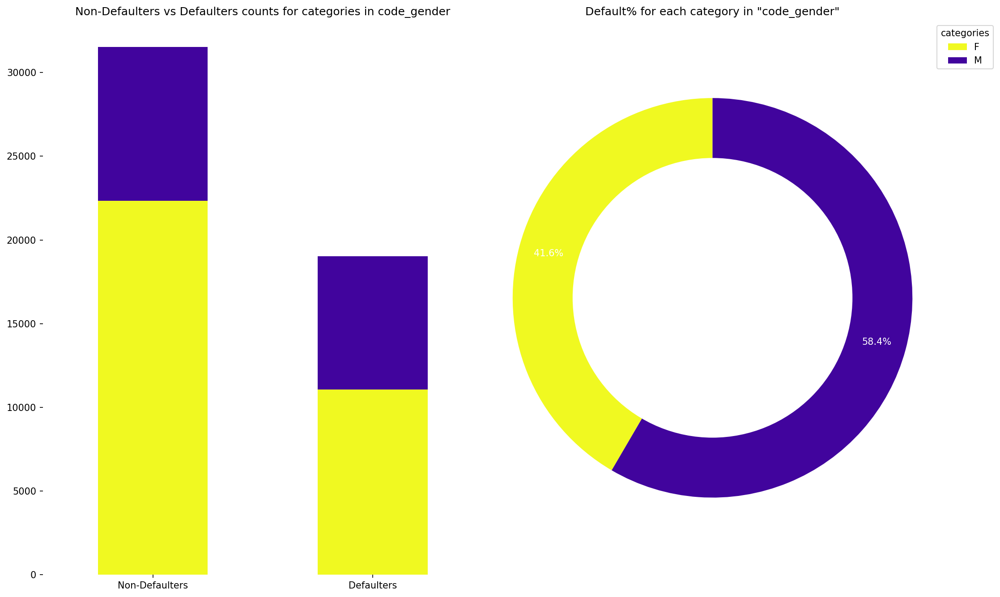

In [51]:
gender = biv_vizz_c('code_gender', 'target', df2)

#### Both genders show a larger number of non-defaulters than defaulters. Although females are likely to have higher probability of having troubles repaying the loan.

### Does the age of a client give any indication about default probability?

In [52]:
df2.rename(columns = {'days_birth': 'years_birth'}, inplace = True)
df2['years_birth_bins'] = df2['years_birth'].round(-1)
df2['years_birth_bins'].value_counts()

40    17896
30    12214
50    11964
60     5610
20     2643
70      219
Name: years_birth_bins, dtype: int64

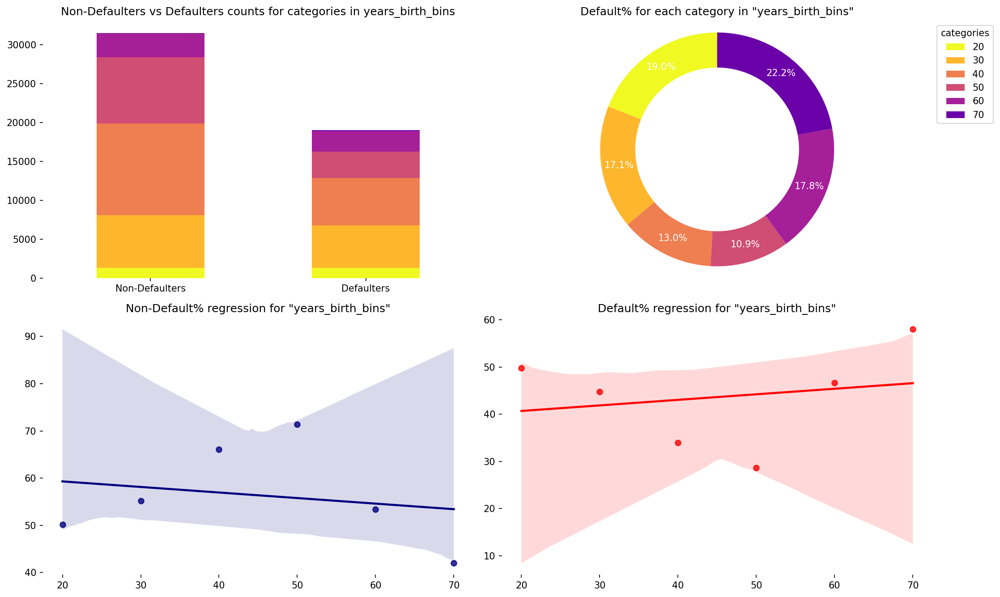

In [53]:
biv_vizz_n('years_birth_bins', 'target', df2)

#### Younger clients (in their 20s and 30s) seem to have a higher likelihood of defaulting compared to older clients (in their 60s and 70s). Thus, the age of a client does give an indication about default probability, with younger clients appearing more prone to default.

### Do clients who own cars or houses have a higher or lower likelihood of defaulting?

In [54]:
df2['flag_own_car'] = df2['flag_own_car'].replace(['Y', 'N'], [1,0])
df2['flag_own_car'].value_counts()

0    33840
1    16706
Name: flag_own_car, dtype: int64

In [55]:
df2['flag_own_realty'] = df2['flag_own_realty'].replace(['Y', 'N'], [1,0])
df2['flag_own_realty'].value_counts()

1    35755
0    14791
Name: flag_own_realty, dtype: int64

In [56]:
df2['flag_own_car_and_realty'] = ((df2['flag_own_car'] == 1) & (df2['flag_own_realty'] == 1)).astype(int)
df2['flag_own_car_and_realty'].value_counts()

0    38601
1    11945
Name: flag_own_car_and_realty, dtype: int64

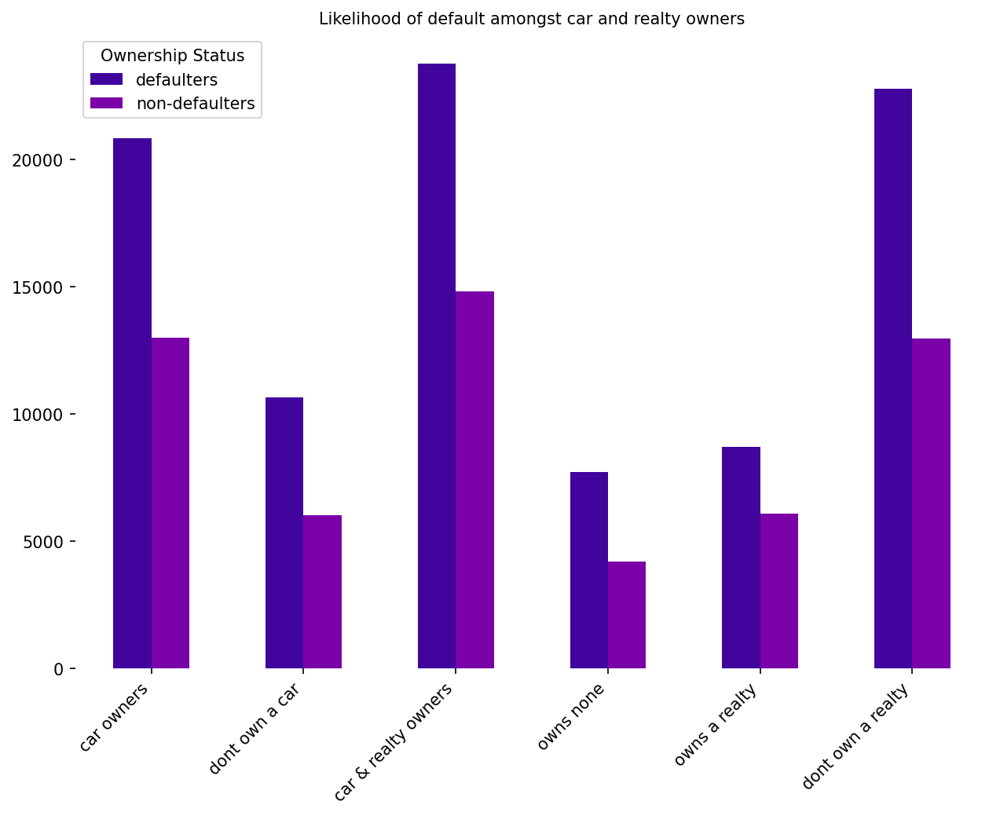

In [57]:
assets_df = df2.melt(id_vars='target', value_vars=['flag_own_car', 'flag_own_realty', 'flag_own_car_and_realty'])
assets_group = assets_df.groupby(['variable', 'value', 'target']).size().unstack()

colors = [plt.cm.plasma(i) for i in np.linspace(0.1, 0.8, len(assets_group))]

ax = assets_group.plot(kind='bar', stacked=False, color=colors, figsize=(10, 7))

labels = ['defaulters', 'non-defaulters']
plt.legend(labels=labels, title='Ownership Status')

xtick_labels = ['car owners', 'dont own a car', 'car & realty owners','owns none', 'owns a realty', 'dont own a realty']
plt.xticks(ticks=range(len(xtick_labels)), labels=xtick_labels, rotation=45, ha='right')

plt.title('Likelihood of default amongst car and realty owners', fontsize=10)
plt.xlabel('')

for spine in ax.spines.values():
    spine.set_visible(False)
    
plt.show()

#### "non-defaulters" are more likely to own assets like cars or real estate than "defaulters". This trend is most evident in individual ownership of cars or real estate, and slightly less so for combined ownership of both.

In [58]:
df2['flag_own_none'] = ((df2['flag_own_car'] == 0) & (df2['flag_own_realty'] == 0)).astype(int)
df2['flag_own_none'].value_counts()

0    40516
1    10030
Name: flag_own_none, dtype: int64

In [59]:
df2['flag_own_car_or_realty'] = ((df2['flag_own_car'] == 1) | (df2['flag_own_realty'] == 1)).astype(int)
df2['flag_own_car_or_realty'].value_counts()

1    40516
0    10030
Name: flag_own_car_or_realty, dtype: int64

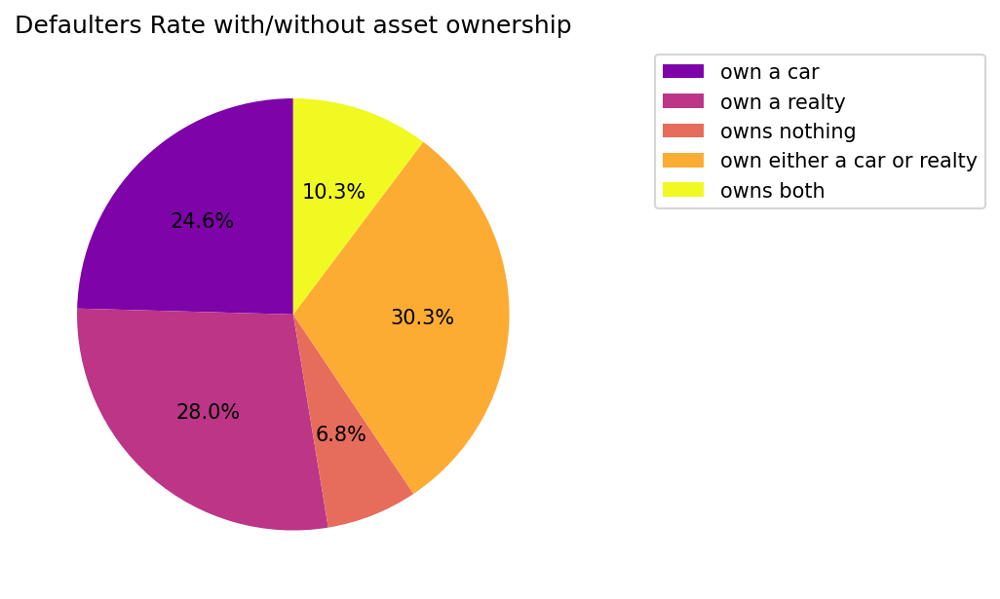

In [60]:
melted_df = df2.melt(id_vars='target', value_vars=['flag_own_car', 'flag_own_realty','flag_own_car_or_realty', 'flag_own_car_and_realty', 'flag_own_none'])
assests = melted_df.groupby(['variable', 'value', 'target']).size().unstack()
data_to_plot = assests.T.iloc[0, ::2]
colors = [plt.cm.plasma(i) for i in np.linspace(0.25, 1, len(data_to_plot))]
data_to_plot.plot(kind='pie', startangle=90, colors=colors, autopct='%1.1f%%', labels=None)
plt.title('Defaulters Rate with/without asset ownership')
plt.ylabel('')
labels = ['own a car', 'own a realty', 'owns nothing', 'own either a car or realty', 'owns both']
plt.legend(labels=labels, loc="upper right", bbox_to_anchor=(1.8, 1))
plt.show()

### How does the number of children a client has relate to default rates?

In [61]:
df2['cnt_children'].value_counts(normalize=True)

0    0.656333
1    0.244550
2    0.099118
Name: cnt_children, dtype: float64

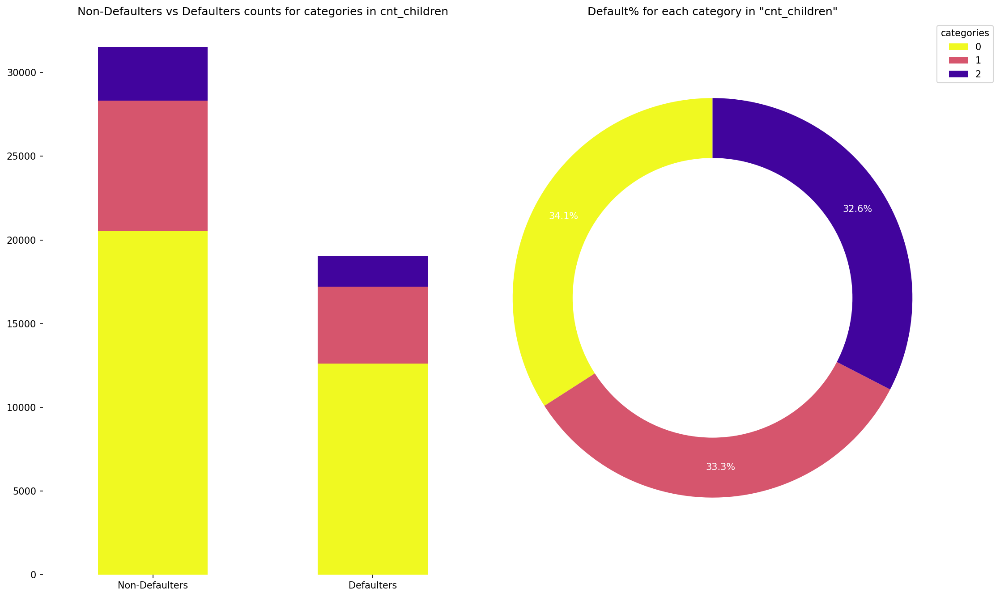

In [62]:
children =  biv_vizz_c('cnt_children', 'target', df2)

#### While the majority of clients have no children, there appears to be a trend where the default rate increases as the number of children goes up.

### Does family status (e.g. married, single, etc.) impact default rates?

In [63]:
df2['name_family_status'].value_counts()

Married                 32335
Single / not married     7746
Civil marriage           5182
Separated                3495
Widow                    1788
Name: name_family_status, dtype: int64

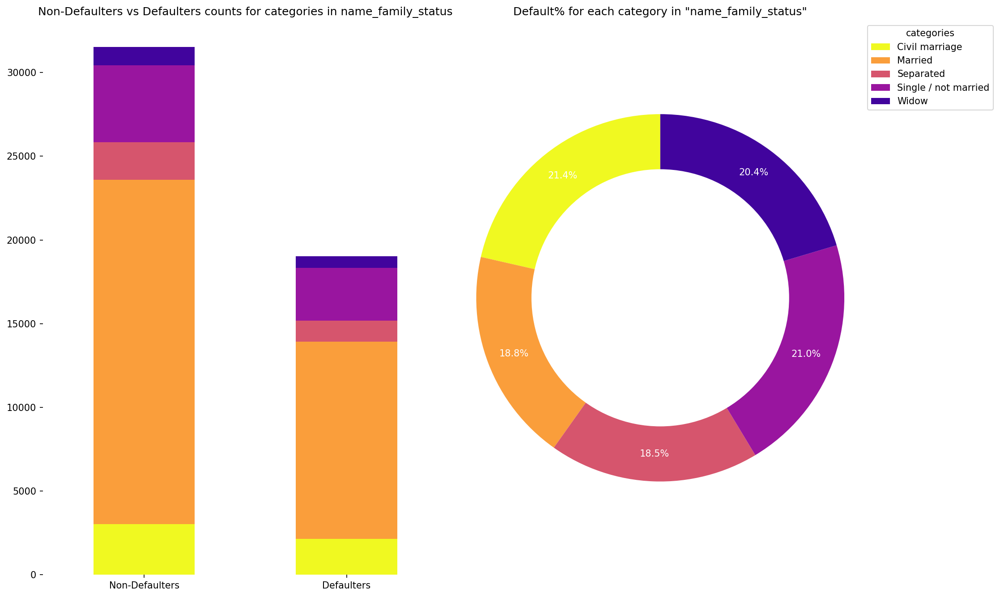

In [64]:
family_status =  biv_vizz_c('name_family_status', 'target', df2)

#### The "Married" category dominates in terms of absolute numbers for both defaulters and non-defaulters. However, when it comes to default rates, they have a lower tendency to default compared to "Widow", "Civil marriage", and "Single / not married" groups.

#### Even though the "Widow" group has a small representation in terms of absolute numbers, they have the highest default rate. This could indicate potential financial strains faced by this group.

#### The "Separated" group, despite its challenges, has the lowest default rate.

## Economic Analysis:

### What is the income distribution for clients who default versus those who don't?

In [65]:
print(np.exp(df2['amt_income_total'].min()))
print(np.exp(df2['amt_income_total'].max()))

47250.99999999997
486000.9999999996


In [66]:
bin_income = pd.qcut(df2['amt_income_total'], 5)
bin_income.sample(5)

45065    (12.304, 13.094]
20935    (11.631, 11.813]
27044    (12.304, 13.094]
30199    (11.995, 12.304]
48976    (10.762, 11.631]
Name: amt_income_total, dtype: category
Categories (5, interval[float64, right]): [(10.762, 11.631] < (11.631, 11.813] < (11.813, 11.995] < (11.995, 12.304] < (12.304, 13.094]]

In [67]:
amount_label = bin_income.unique().categories
labels = [f'{int(np.exp(value.left))} - {int(np.exp(value.right))}' for value in amount_label]

In [68]:
def abbreviate_labels (label):
    start, end = label.split(' - ')
    start, end = int(start), int(end)
    start_str = f'{start/10**3:.0f}K'
    end_str = f'{end/10**3:.0f}K'
    return f'{start_str} - {end_str}'

print([abbreviate_labels (label) for label in labels])
abbreviate_numbers = [abbreviate_labels (label) for label in labels]

['47K - 113K', '113K - 135K', '135K - 162K', '162K - 221K', '221K - 486K']


In [69]:
income_dist = pd.pivot_table(index=bin_income, columns='target', values='amt_income_total', data=df2, aggfunc='count')
income_dist['total'] = income_dist[1] + income_dist[0]
income_dist['def%'] = (income_dist[1]/income_dist['total']*100).round(2)
income_dist['non-def%'] = (income_dist[0]/income_dist['total']*100).round(2)
default_earners = income_dist['def%'].tolist()
non_default_earners = income_dist['non-def%'].tolist()
textstr = f' Default earners %: {default_earners} \n'
textstr += f' Non-Default earners %: {non_default_earners}'
income_dist

target,0,1,total,def%,non-def%
amt_income_total,,,,,
"(10.762, 11.631]",9359,6017,15376,39.13,60.87
"(11.631, 11.813]",5503,3176,8679,36.59,63.41
"(11.813, 11.995]",4120,2404,6524,36.85,63.15
"(11.995, 12.304]",6148,3763,9911,37.97,62.03
"(12.304, 13.094]",6384,3672,10056,36.52,63.48


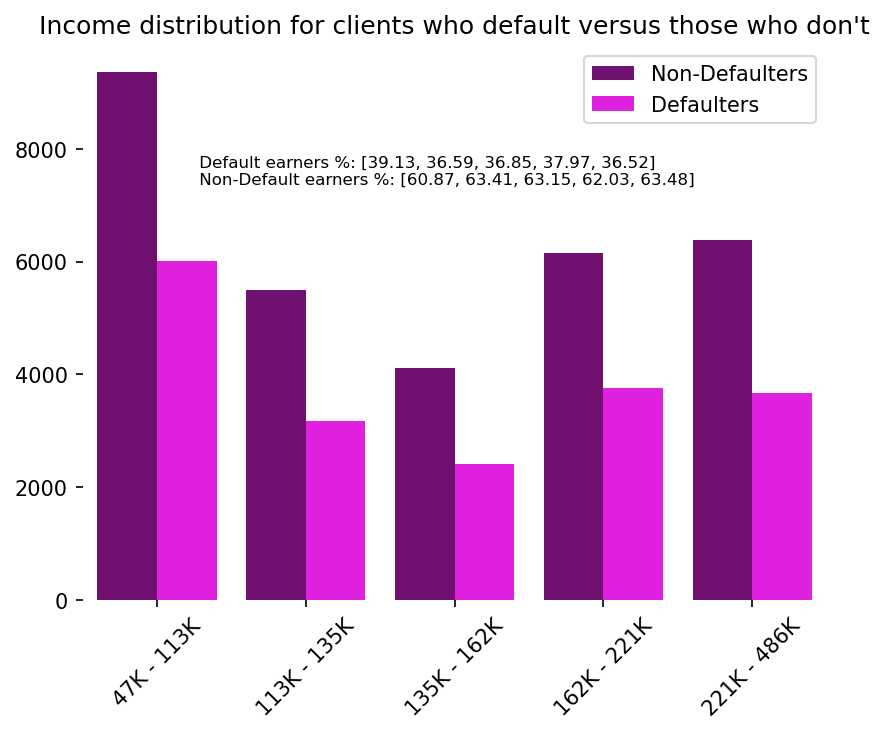

In [70]:
bin_income = pd.qcut(df2['amt_income_total'], 5, labels=labels)
ax = sns.countplot( x = bin_income, data = df2, hue = 'target', palette = ['purple', 'magenta'])
plt.xticks(rotation=45, ticks=range(5), labels=abbreviate_numbers)
ax.text(0.15, 0.75, textstr, fontsize=8, color='black', transform=plt.gca().transAxes)
plt.title('Income distribution for clients who default versus those who don\'t')
plt.legend(labels = ['Non-Defaulters', 'Defaulters'])
plt.ylabel('')
plt.xlabel('')
for spine in ax.spines.values():
    spine.set_visible(False);

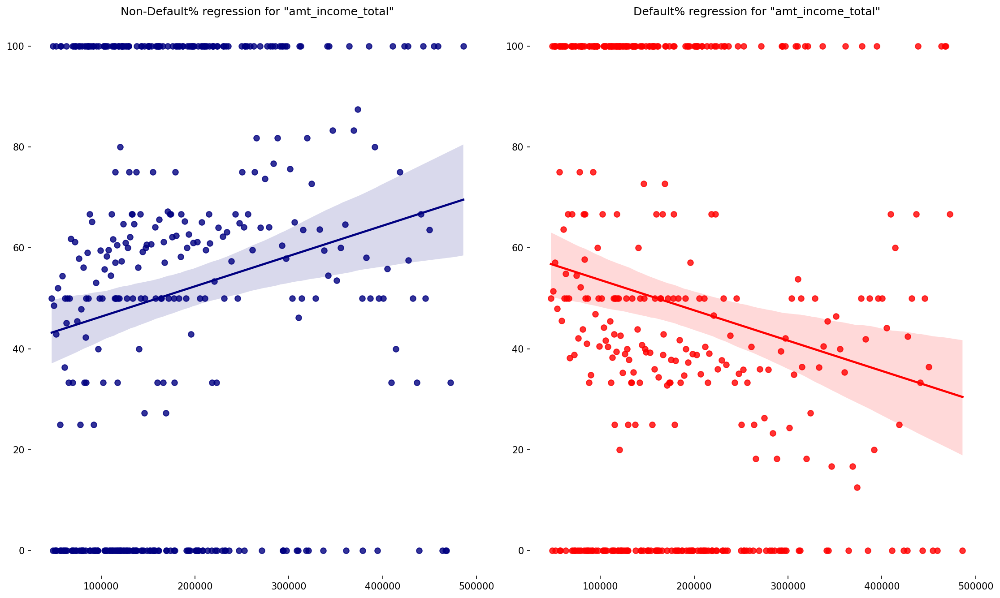

In [71]:
# cross table
counts_categ = pd.crosstab(df2['amt_income_total'], df2['target'])

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,9))

# reg plot for non-defaulters
counts_categ['non-def%'] = counts_categ.loc[:,0] / (counts_categ.loc[:,0] + counts_categ.loc[:,1]) * 100
sns.regplot(y=counts_categ['non-def%'], x=np.exp(counts_categ.index), scatter=True, color='navy', ax=ax[0])
ax[0].set_title(f'Non-Default% regression for "amt_income_total"')
ax[0].set_xlabel('')
ax[0].set_ylabel('')

# reg plot for defaulters
counts_categ['def%'] = counts_categ.loc[:,1] / (counts_categ.loc[:,0] + counts_categ.loc[:,1]) * 100
sns.regplot(y=counts_categ['def%'], x=np.exp(counts_categ.index), scatter=True, color='red', ax=ax[1])
ax[1].set_title(f'Default% regression for "amt_income_total"')
ax[1].set_xlabel('')
ax[1].set_ylabel('')

for axis in fig.axes:
    for spine in axis.spines.values():
        spine.set_visible(False)

plt.tight_layout()
plt.show()


#### Individuals with higher "amt_income_total" values appear to have a reduced likelihood of defaulting compared to those with lower incomes.

### Does the credit amount or loan annuity show any correlation with default rates?

In [72]:
np.exp(df2['amt_credit']).value_counts()

450001.0     1762
675001.0     1488
270001.0     1424
180001.0     1365
225001.0     1146
545041.0     1039
900001.0      920
808651.0      843
521281.0      700
755191.0      681
254701.0      613
1078201.0     589
640081.0      554
284401.0      552
1288351.0     548
1125001.0     527
135001.0      444
592561.0      441
269551.0      425
202501.0      415
247501.0      376
781921.0      369
835381.0      365
1006921.0     365
337501.0      347
942301.0      340
454501.0      322
315001.0      319
314101.0      317
405001.0      307
497521.0      297
360001.0      285
540001.0      275
343801.0      247
1350001.0     240
508496.5      240
679501.0      235
1546021.0     213
495001.0      204
585001.0      192
152821.0      191
239851.0      187
1223011.0     164
312769.0      164
544492.0      163
157501.0      159
526492.0      157
728461.0      154
314056.0      151
288874.0      143
1256401.0     140
1042561.0     137
381529.0      133
382501.0      130
814042.0      130
263687.5  

In [73]:
pd.set_option('display.float_format', '{:,.0f}'.format)

In [74]:
df2['amt_credit_bin'] = np.exp(df2['amt_credit'].round(1)).astype(int)
df2['amt_credit_bin'] = df2['amt_credit_bin'].apply(lambda x: round(x, -4))
df2['amt_credit_bin'].value_counts().sort_values(ascending=False)

540000     4130
660000     3560
440000     3114
810000     3041
270000     2951
330000     2571
1090000    2390
490000     2341
730000     2243
600000     2077
890000     2071
240000     1915
300000     1913
980000     1903
180000     1804
220000     1696
400000     1560
1330000    1548
360000     1211
1200000    1191
200000      938
130000      699
160000      654
150000      491
1620000     448
1470000     423
1790000     303
100000      250
110000      246
120000      209
1980000     159
70000       142
90000       141
80000        63
2190000      61
60000        38
2420000      34
50000        11
2680000       5
2960000       1
Name: amt_credit_bin, dtype: int64

In [75]:
df2['amt_credit_bin'].skew()

1.1326801168440517

In [76]:
df2[~(df2['amt_credit_bin']>=2000000)]['amt_credit_bin'].skew()

1.0172558560073321

In [77]:
df2.drop(index=(df2[(df2['amt_credit_bin']>2000000)]).index, inplace = True)

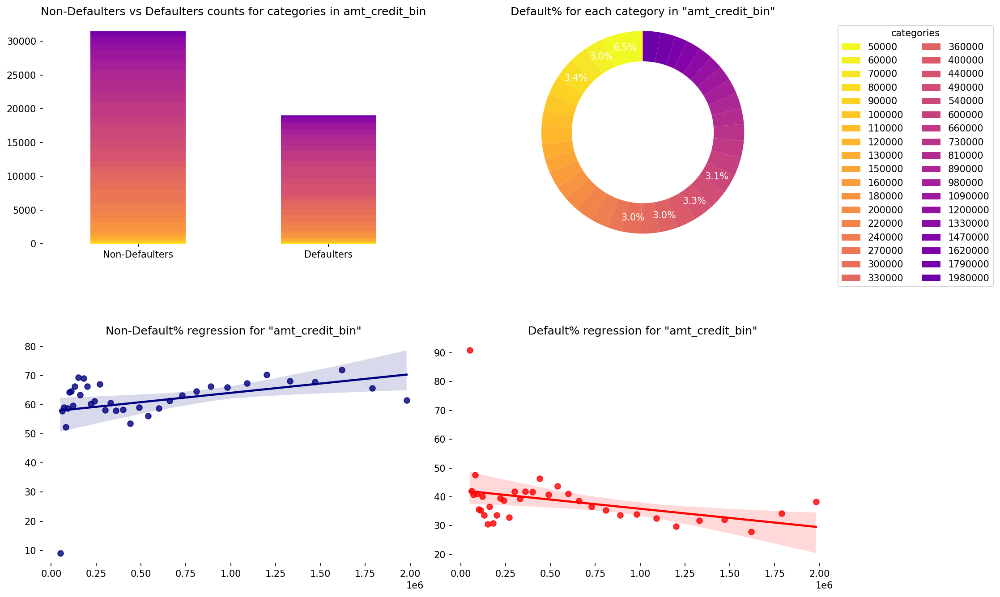

In [78]:
biv_vizz_n('amt_credit_bin', 'target', df2)

#### The data points are denser around lower credit bin values, suggesting that as the credit bin amount increases, the default rate appears to increase, although the trend is not very steep.

In [79]:
np.exp(df2['amt_annuity']).value_counts()

9,001     1252
13,501    1188
10,126     365
37,801     357
26,218     355
26,641     309
6,751      302
31,654     290
20,251     289
36,460     280
16,876     277
12,376     262
25,538     253
11,251     251
31,263     240
22,501     227
22,020     223
16,574     185
29,971     183
33,026     176
40,321     173
30,529     168
23,775     161
32,604     157
21,907     148
26,447     147
21,889     142
21,110     125
31,631     122
15,751     117
27,001     115
22,600     112
26,510     107
28,409     104
33,751     104
42,792     102
35,938      99
29,251      99
7,876       98
31,154      97
46,086      97
21,776      94
26,317      94
27,424      93
38,332      90
32,275      89
13,965      89
16,156      85
19,868      85
23,932      85
45,334      84
34,912      84
28,216      83
31,465      83
24,544      82
19,126      82
51,544      80
27,325      80
25,408      80
26,285      79
35,394      78
24,593      77
36,865      76
35,686      75
31,524      75
30,079      75
51,949    

In [80]:
df2['amt_annuity_bin'] = np.exp(df2['amt_annuity'].round(1)).astype(int)
df2['amt_annuity_bin'] = df2['amt_annuity_bin'].apply(lambda x: round(x, -3))
len(df2['amt_annuity_bin'].value_counts().sort_values(ascending=False))

28

In [81]:
df2['amt_annuity_bin'].skew()

0.8714253458103114

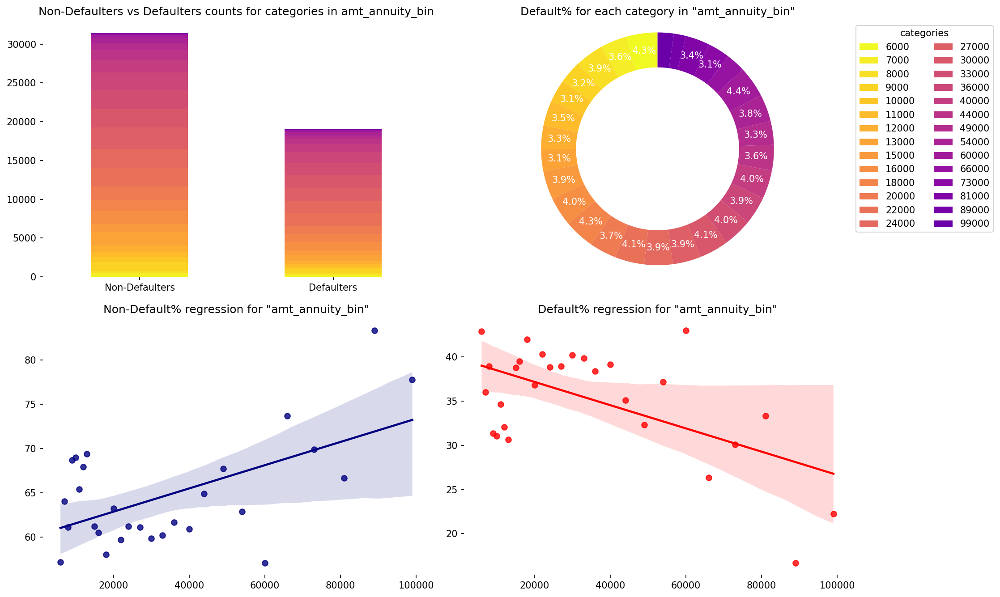

In [82]:
annuity = biv_vizz_n('amt_annuity_bin', 'target', df2)

#### Higher annuity amounts tend to have fewer total applicants (both defaulters and non-defaulters).
#### The annuity amount by itself might not be a strong predictor of default rates, given the relatively small fluctuation in default percentages across different annuity bins.
#### However, a slight trend can be observed: as the annuity amount increases, the likelihood of default appears to decrease

<Axes: >

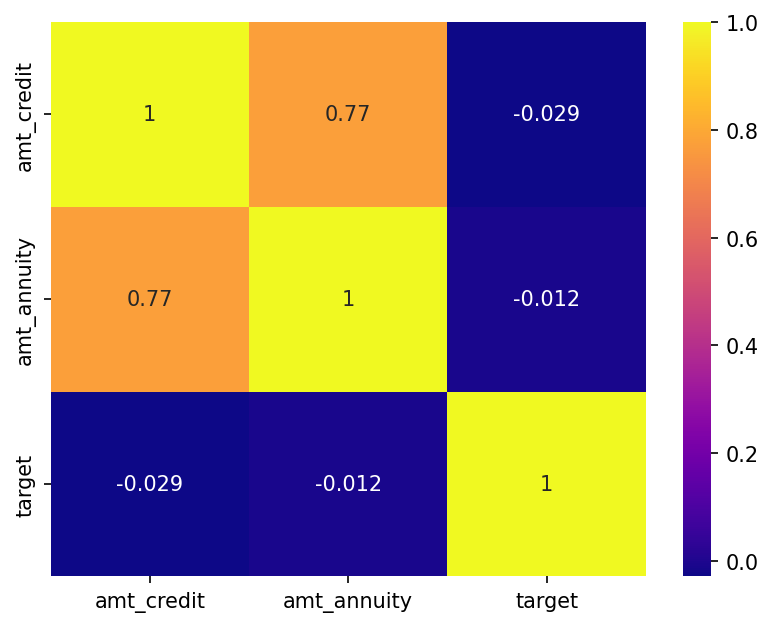

In [83]:
amt_correlation_matrix = df[['amt_credit', 'amt_annuity', 'target']].corr()
sns.heatmap(amt_correlation_matrix, cmap='plasma', annot=True)

### Are certain income types more prone to defaulting than others?

In [84]:
df2['organization_type'].value_counts() # XNA could possibley denote individuals who are not working or retired.

Business Entity Type 3    12297
Self-employed              7802
Other                      3090
Medicine                   2367
Business Entity Type 2     2315
XNA                        2270
Government                 2001
School                     1806
Kindergarten               1611
Trade: type 7              1560
Construction               1222
Business Entity Type 1     1078
Transport: type 4           967
Trade: type 3               711
Industry: type 3            689
Industry: type 11           625
Housing                     572
Security                    529
Industry: type 9            465
Transport: type 2           426
Agriculture                 419
Postal                      418
Bank                        405
Military                    381
Restaurant                  369
Industry: type 7            334
Police                      332
Security Ministries         326
Services                    307
Transport: type 3           254
University                  229
Industry

In [85]:
df2 = df2[np.where(df2['organization_type'] == 'XNA', False, True)]

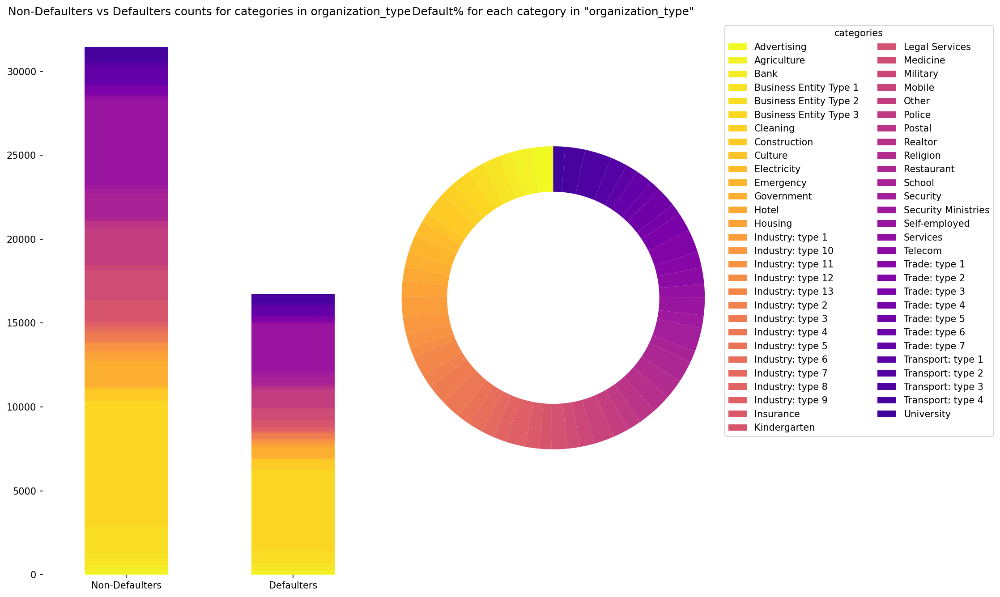

In [86]:
org_type = biv_vizz_c('organization_type', 'target', df2)

#### High Non-default Rates: It's worth noting that "Business Entity Type 3" and "Self-employed" not only have high default rates but also have a significant number of non-defaulters. This suggests a larger client base in these occupational categories.

### How does the duration of current employment correlate with default rates?

In [87]:
np.exp(df2['days_employed']).value_counts()

2     6077
3     5620
1     5107
4     4728
5     4224
6     3029
7     2839
8     2459
9     2142
10    1638
11    1402
12    1112
13     993
15     922
14     895
16     527
17     465
18     405
19     404
20     377
21     337
22     317
23     271
24     232
25     226
26     189
27     159
29     155
28     131
30     131
31     113
35      91
32      89
33      81
34      71
36      58
37      35
40      27
38      26
39      26
41      12
42      11
43       9
45       8
44       3
47       1
46       1
Name: days_employed, dtype: int64

In [88]:
df2['years_employed'] = np.exp(df2['days_employed']).astype(int)

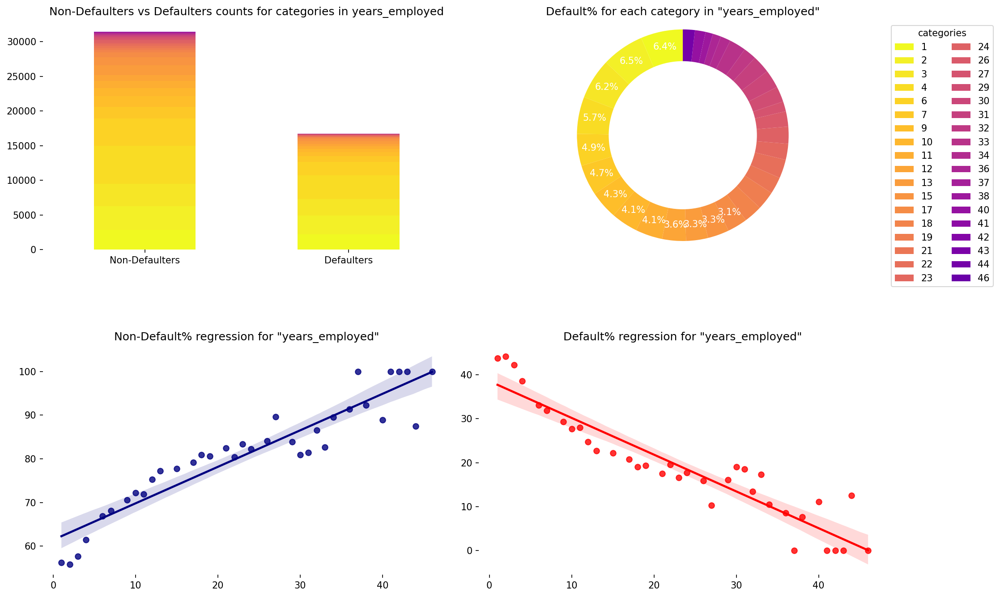

In [89]:
biv_vizz_n('years_employed', 'target', df2)

#### The longer someone has been employed, the less likely they are to default. This could be due to increased financial stability and experience managing finances over time.

## Address Verification:
### Are clients who have mismatched addresses (work, contact, permanent) more prone to defaulting?

In [90]:
mismatched = df2.columns[df2.columns.str.contains('not')].tolist()
df2['mismatched_add'] = np.exp(df2[['reg_region_not_live_region', 'reg_region_not_work_region', 'live_region_not_work_region', 'reg_city_not_live_city',
     'reg_city_not_work_city', 'live_city_not_work_city']]).replace([1,2], [0,1]).sum(axis=1)
df2['mismatched_add'] = df2['mismatched_add'].astype(int)
df2['mismatched_add'].value_counts()

0    42522
1     5653
Name: mismatched_add, dtype: int64

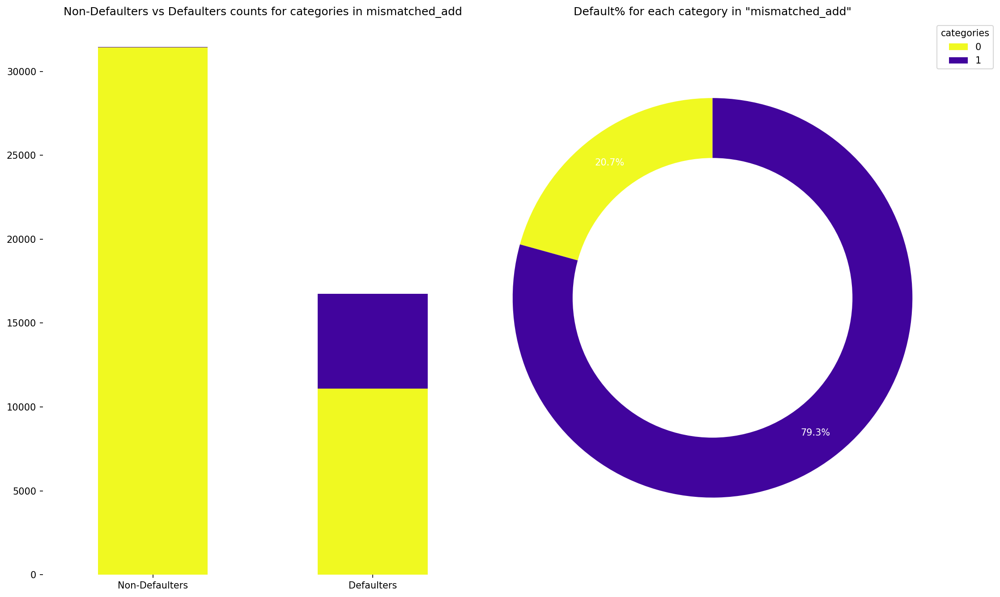

In [91]:
biv_vizz_c('mismatched_add', 'target', df2)

#### Default rate is higher for those who submitted incorrect information '1' compared to those who submitted correct information '0'. Thus more attention might be required for applications with incorrect information given the slightly elevated default rates.

## Surroundings and Social Influence:
### Do clients with more observations of social surroundings defaulting have a higher chance of defaulting themselves?

In [92]:
social = df2.columns[df2.columns.str.contains('social')]
df2[['obs_30_cnt_social_circle','def_30_cnt_social_circle','obs_60_cnt_social_circle','def_60_cnt_social_circle', 'target']].sample(5)

,obs_30_cnt_social_circle,def_30_cnt_social_circle,obs_60_cnt_social_circle,def_60_cnt_social_circle,target
3870,0,0,0,0,0
48512,2,0,2,0,0
8868,0,0,0,0,0
48352,0,0,0,0,0
33178,0,0,0,0,0


In [93]:
df2['obs_30_cnt_social_circle_exp'] = (np.exp(df2['obs_30_cnt_social_circle'])).astype(int)
df2['obs_30_cnt_social_circle_exp'].value_counts()

1     26883
2      7248
4      5142
3      4459
6      2432
7       679
9       434
10      331
11      207
13      179
12      134
15       47
Name: obs_30_cnt_social_circle_exp, dtype: int64

In [ ]:
biv_vizz_n('obs_30_cnt_social_circle_exp', 'target', df2)

#### Individuals in the "high" social circle of credit observed influence group, although fewer in number, tend to have the highest likelihood to default.

In [ ]:
# dropping columns with low variance
cols_to_drop = ['def_30_cnt_social_circle','obs_60_cnt_social_circle','def_60_cnt_social_circle']
df2.drop(columns = cols_to_drop, inplace=True)
df2.shape

## Credit History:
### Does the number of enquiries to the Credit Bureau before application correlate with default rates?

In [96]:
bureau = df2.columns[df2.columns.str.contains('bureau')]
np.exp(df2[bureau]).sample(5)

,amt_req_credit_bureau_hour,amt_req_credit_bureau_day,amt_req_credit_bureau_week,amt_req_credit_bureau_mon,amt_req_credit_bureau_qrt,amt_req_credit_bureau_year
11673,1,1,1,1,1,10
23301,1,1,1,1,1,8
17981,1,1,1,1,1,2
6820,1,1,1,1,1,2
17557,1,1,1,1,1,1


In [97]:
df2['amt_req_credits_total'] = np.exp(df2[bureau].sum(axis=1)).astype(int)

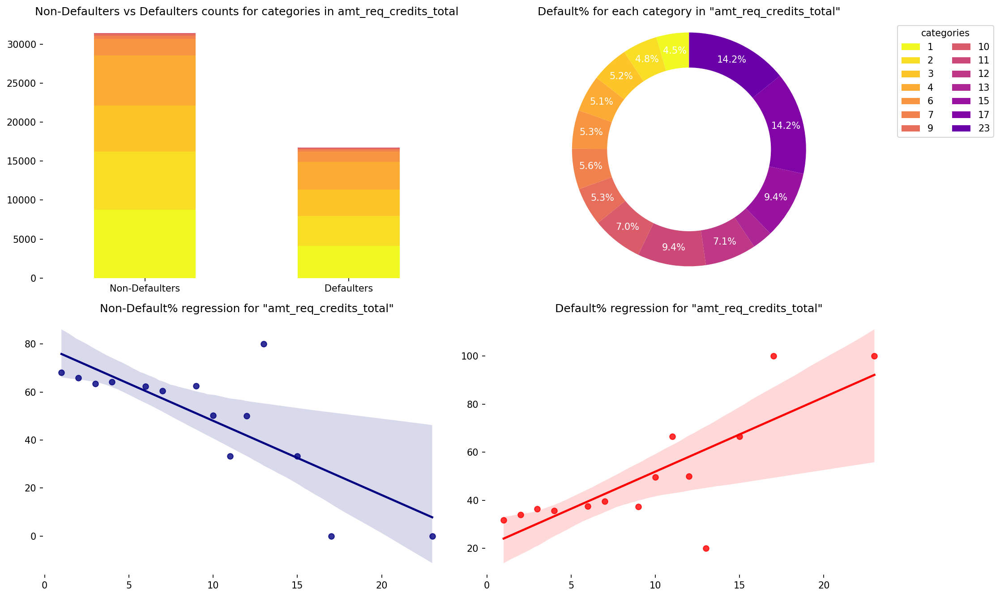

In [98]:
biv_vizz_n('amt_req_credits_total', 'target', df2)

#### There's an upward trend indicating that as the number of credit inquiries increases, the percentage of Defaulters also increases.

## Behavioral Analysis:
### Are clients who provided more contact points (mobile, work phone, home phone, email) less likely to default?

In [99]:
df2['flag_contact_points'] = df2[['flag_emp_phone', 'flag_work_phone', 'flag_cont_mobile', 'flag_phone',
       'flag_email']].sum(axis=1)
df2['flag_contact_points'] = df2['flag_contact_points'].astype(int)
df2['flag_contact_points'].value_counts()

1    38063
2    10112
Name: flag_contact_points, dtype: int64

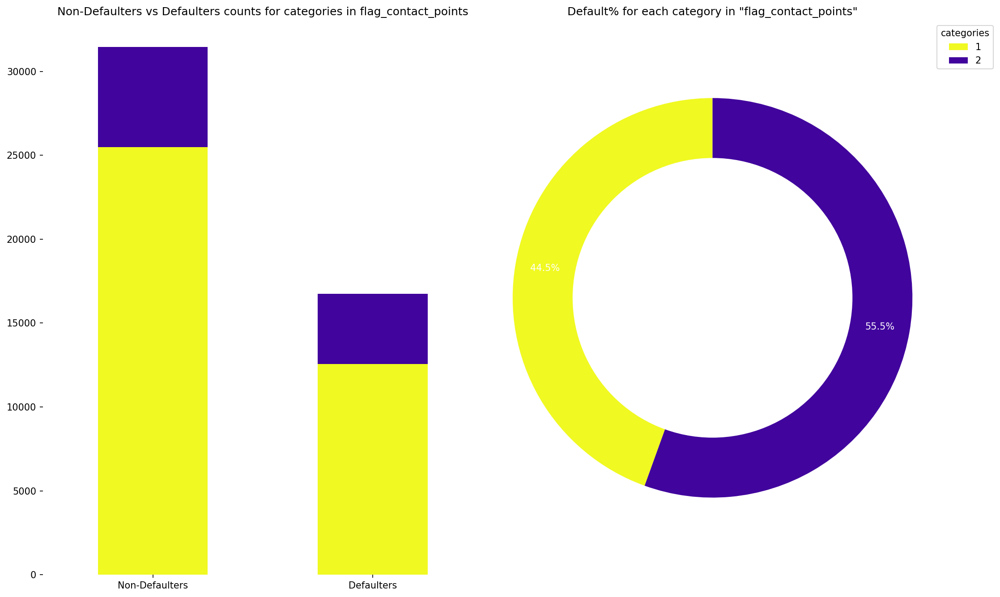

In [100]:
biv_vizz_c('flag_contact_points', 'target', df2)

#### Clients in category 2 (presumably those who provided more contact points) are less likely to default than those in category 1. Thus, providing more contact points seems to be associated with a reduced risk of defaulting.

### Do clients who changed their phones closer to the application date default more frequently?

In [101]:
df2.rename(columns = {'days_last_phone_change' : 'years_last_phone_change'}, inplace=True)
df2['years_last_phone_change'].value_counts()

0     14538
1      8949
4      6042
2      5866
3      4652
5      3475
6      2465
7      1335
8       637
9       194
10       22
Name: years_last_phone_change, dtype: int64

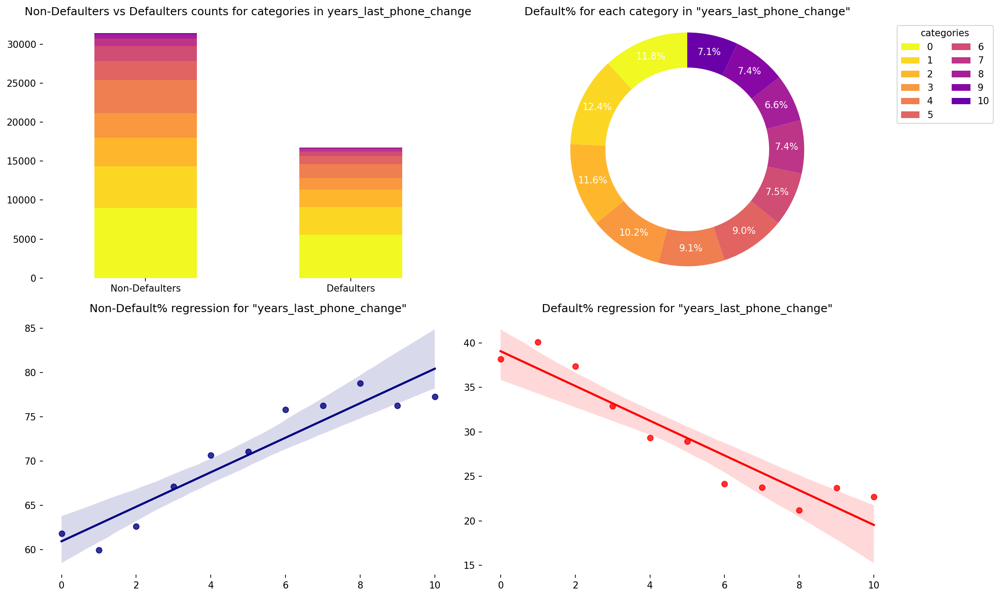

In [102]:
biv_vizz_n('years_last_phone_change', 'target', df2)

#### We can observe that categories corresponding to more recent phone changes (like 0 or 1 year) have higher default percentages (11.8% and 11.6% respectively). Meanwhile, the default rate tends to decrease slightly for longer durations since the last phone change.

## Attributes Specific:
### Is there a correlation between the number of family members and default rates?

In [103]:
df2['cnt_fam_members'].value_counts()

2    23698
3    10450
1     9487
4     4540
Name: cnt_fam_members, dtype: int64

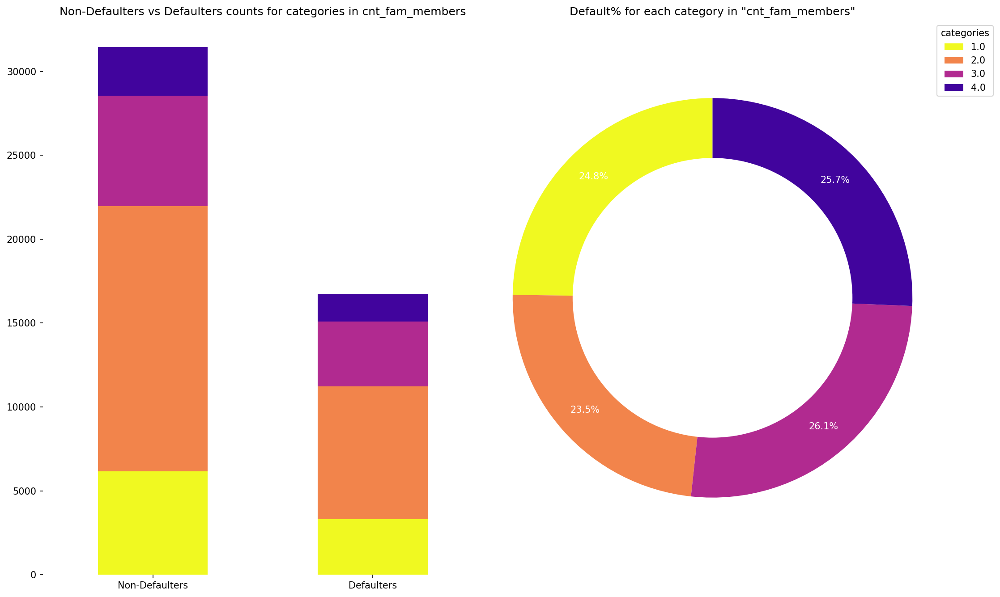

In [104]:
biv_vizz_c('cnt_fam_members', 'target', df2)

#### The differences in default rates across the family member categories are relatively minor. 

### Is there a particular price range of goods for which default rates are higher?

In [105]:
df2['amt_goods_price_bins'] = np.exp(df2['amt_goods_price'].round(1)).astype(int).round(-5)

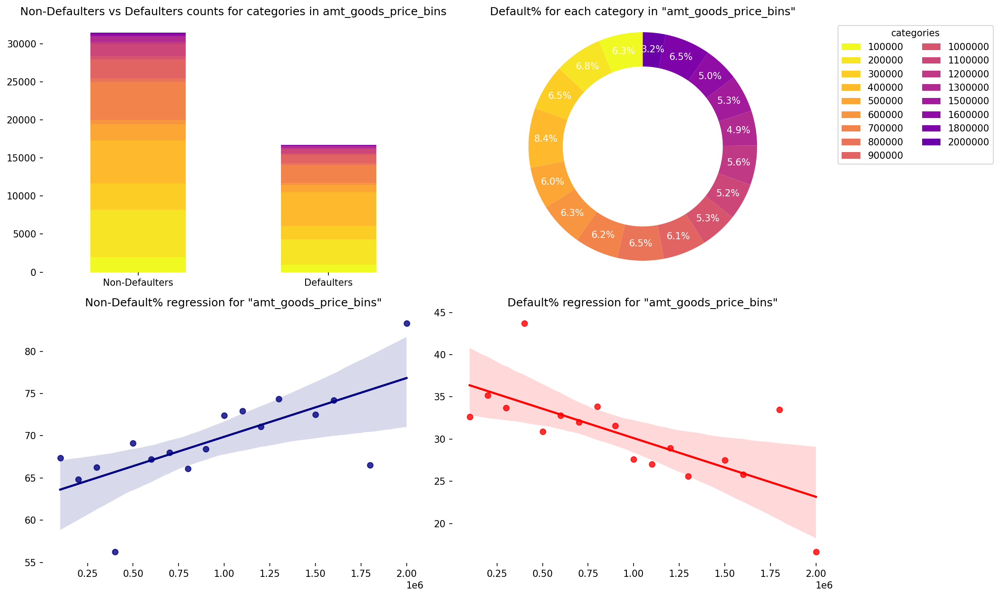

In [106]:
biv_vizz_n('amt_goods_price_bins', 'target', df2)

#### A strong downward trend suggests that low priced range of goods has great many defaulters.

### Are certain housing situations (like renting or living with parents) more associated with defaults?

In [107]:
df2['name_housing_type'].value_counts()

House / apartment      42612
With parents            2707
Municipal apartment     1573
Rented apartment         700
Office apartment         395
Co-op apartment          188
Name: name_housing_type, dtype: int64

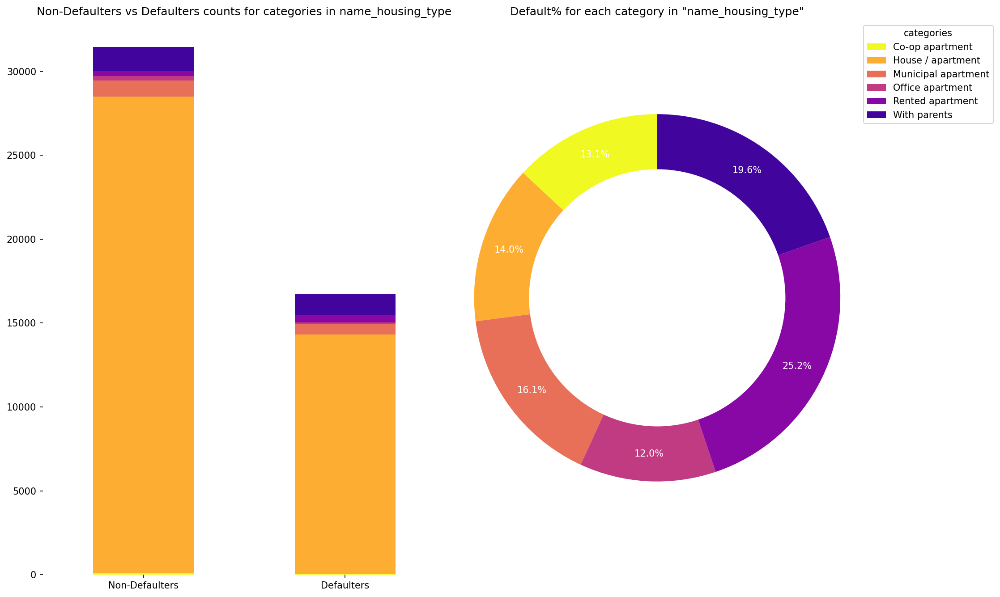

In [108]:
biv_vizz_c('name_housing_type', 'target', df2)

#### Clients living in a "Rented apartment" or "With parents" appear to be more associated with defaults, whereas those living in a "Office apartment" have the lowest association with defaults. Living "Municipal apartment" or in a "House / apartment" seems to have a moderate association with defaults.

### Do clients with older or newer cars have a higher likelihood of defaulting?

In [109]:
np.exp(df2['own_car_age']).value_counts()

1     32280
8      1081
7       982
4       887
9       884
3       874
2       863
5       808
10      784
11      777
14      731
15      726
13      660
12      626
65      548
16      547
6       502
17      500
18      485
19      383
20      283
21      247
22      233
23      206
24      179
66      175
25      173
26      136
29      107
27       83
28       67
30       65
31       49
32       38
33       32
35       28
34       22
36       21
39       18
41       15
37       14
38       14
40       14
42       13
43        5
44        4
45        3
55        2
92        1
Name: own_car_age, dtype: int64

In [110]:
df2['own_car_age'].skew()

1.1550622547960616

In [111]:
condition = np.exp(df2['own_car_age']) > 30
df2.loc[condition, 'own_car_age'] = df2['own_car_age'].quantile(0.75)

In [112]:
df2['own_car_age'].skew()

1.050895816696798

In [113]:
df2['own_car_age_bins'] = df2['own_car_age'].round().astype(int)
df2['own_car_age_bins'] = df2['own_car_age_bins'].replace([0,1,2,3], ['new', 'moderately old', 'old', 'very old'])
df2['own_car_age_bins'].value_counts()

new               32280
old                7525
very old           5746
moderately old     2624
Name: own_car_age_bins, dtype: int64

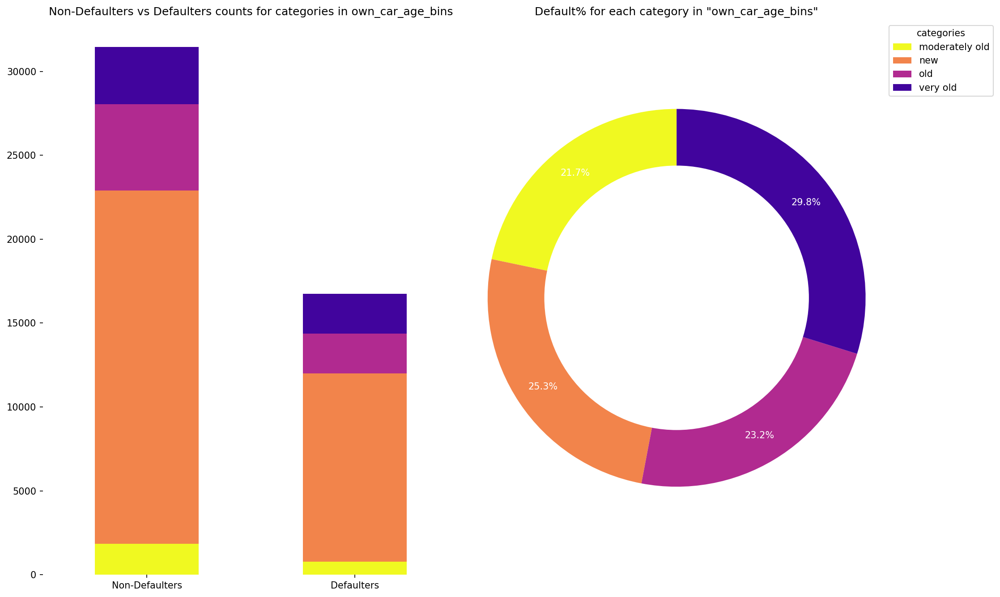

In [114]:
biv_vizz_c('own_car_age_bins', 'target', df2)

#### Clients with "very old" or "new" cars have the highest likelihood of defaulting.

## Other Factors:
### Do clients from more populated regions have a different default rate compared to those from less populated regions?

In [115]:
df2['region_population_relative_bin'] = (df2['region_population_relative']*1000).round()
df2['region_population_relative_bin'] = df2['region_population_relative_bin'].astype(int)

In [116]:
df2['region_population_relative_bin'].value_counts()

19    5361
7     3774
10    3704
35    3066
25    2426
31    2379
18    2260
26    2243
30    2175
28    2073
9     2010
5     1808
14    1613
22    1407
8     1394
11    1393
15    1236
6     1175
24    1162
16     913
23     800
12     759
20     586
4      539
21     498
45     451
3      315
1      258
32     207
2      190
Name: region_population_relative_bin, dtype: int64

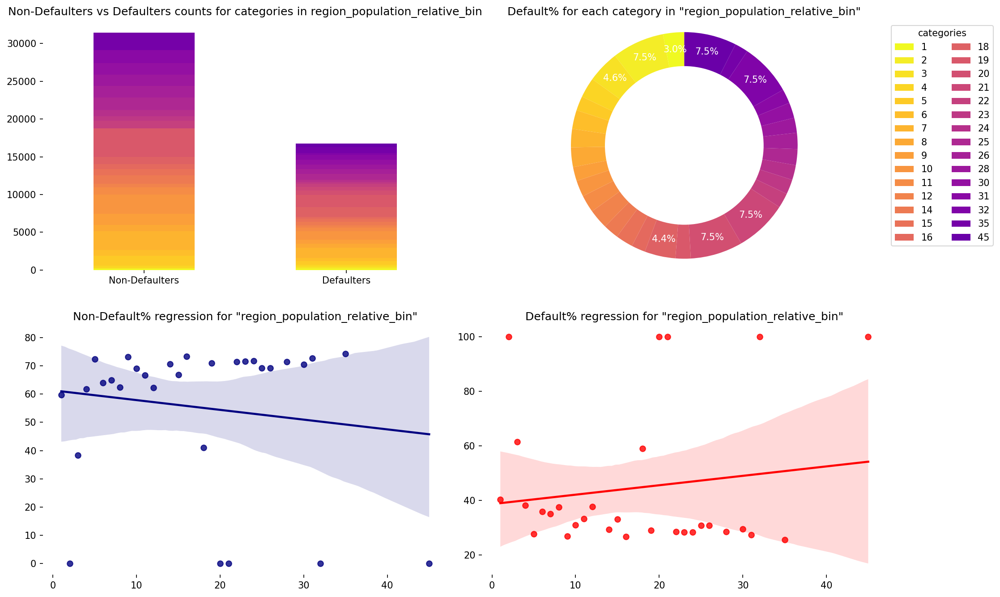

In [117]:
biv_vizz_n('region_population_relative_bin', 'target', df2)

#### Clients from more populated regions seem to have a slightly higher default rate compared to those from less populated regions. The relationship isn't overwhelmingly strong, but there's a discernible pattern indicating that population density plays a role in default tendencies.

### Is there a correlation between the recency of changing identity documents and defaulting?

In [118]:
df2['days_id_publish'].value_counts()

11    5962
12    4997
7     3260
2     3157
6     3155
8     3122
10    3090
3     3055
9     3030
4     3011
5     2943
1     2879
0     2672
13    2643
14     772
15     309
16     115
17       2
19       1
Name: days_id_publish, dtype: int64

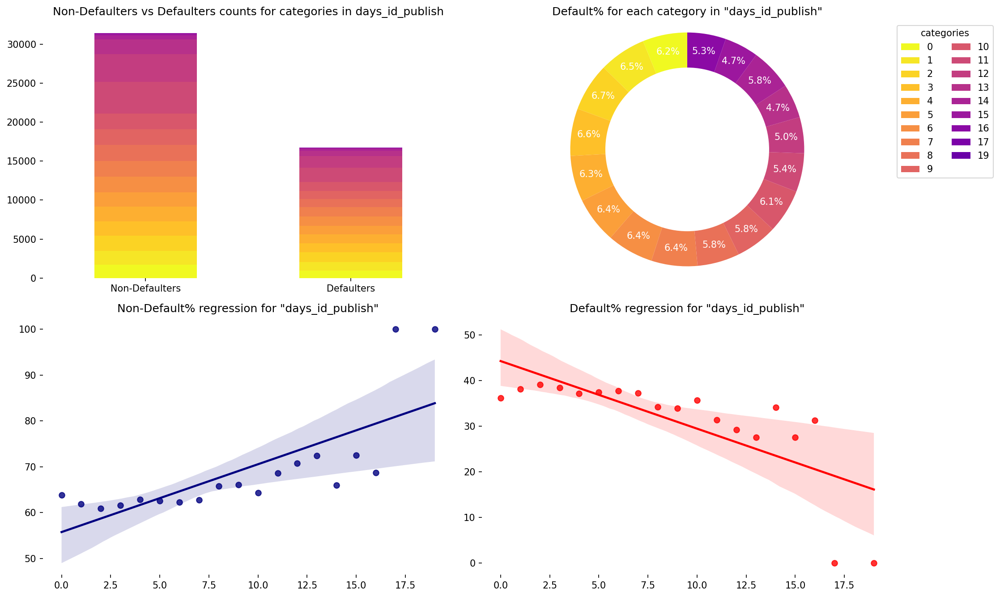

In [119]:
biv_vizz_n('days_id_publish', 'target', df2)

#### As the recency of ID publication increases (or as the ID gets older), the likelihood of defaulting appears to decrease. However, it's worth noting that the differences in default rates are relatively small, so while there is a correlation, the effect might not be very strong.

### Do clients who changed their registration closer to the application date have a higher default rate?

In [121]:
df0 = pd.read_csv(r"C:\Users\dell\Downloads\Loan Defaulter Project\Loan Defaulter Datasets\application_data.csv")

In [122]:
rows_to_retrieve = df2['days_registration'].index
col_idx = df0.columns.get_loc('DAYS_REGISTRATION')
df2['days_registration_df'] = df0.iloc[rows_to_retrieve, col_idx]
df2['days_registration_df'] = df2['days_registration_df'].abs()
reg_closer = df2[df2['days_registration_df'] <= 365]
reg_closer['days_registration_df_bins'] = reg_closer['days_registration_df'].astype(int).round(-1)

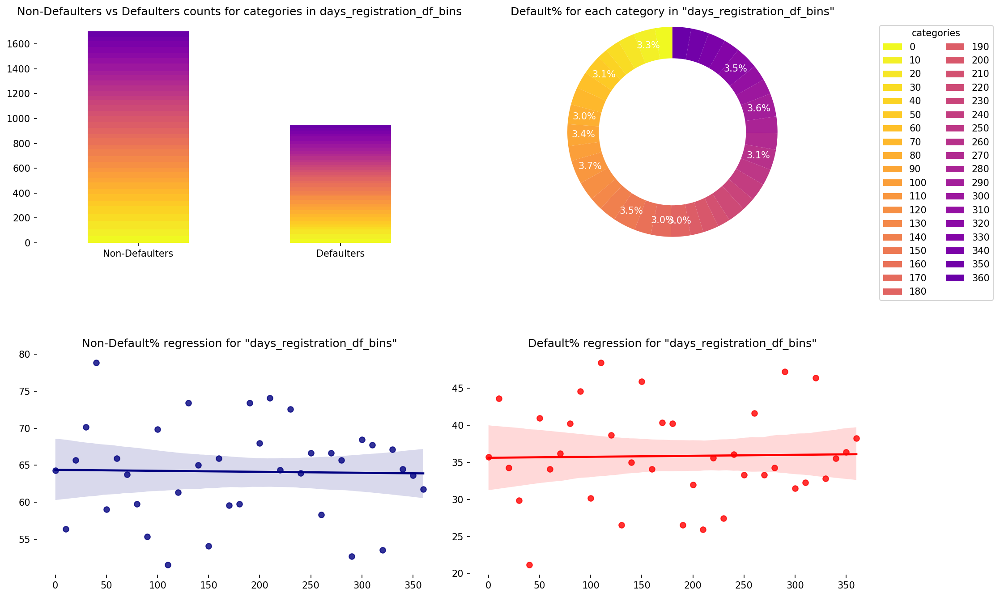

In [123]:
biv_vizz_n('days_registration_df_bins', 'target', reg_closer)

#### As the days of registration decrease (closer to the application date), the Default percentage appears to rise slightly. This suggests that individuals who have changed their registration more recently (closer to the application date) have a slightly higher likelihood of defaulting, though the difference is relatively small. 

### Are lower or higher scores from these external data sources associated with higher default rates?

In [124]:
df2[['ext_source_2', 'ext_source_3']].corr()

,ext_source_2,ext_source_3
ext_source_2,1,0
ext_source_3,0,1


In [125]:
df2['ext_source_2_bins'] = df2['ext_source_2'].round(1)

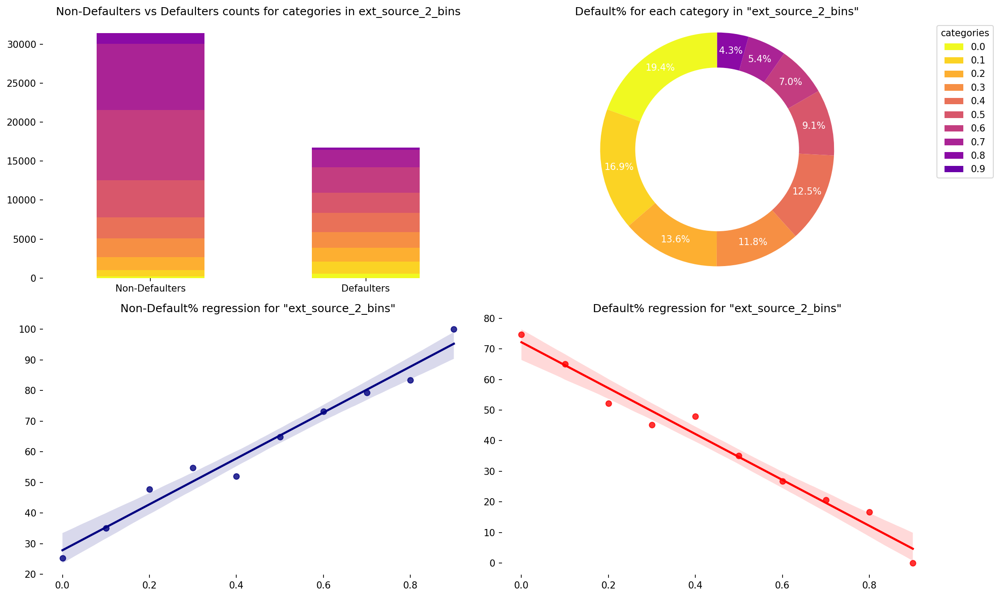

In [126]:
biv_vizz_n('ext_source_2_bins', 'target', df2)

In [127]:
df2['ext_source_3_bins'] = df2['ext_source_3'].round(1)

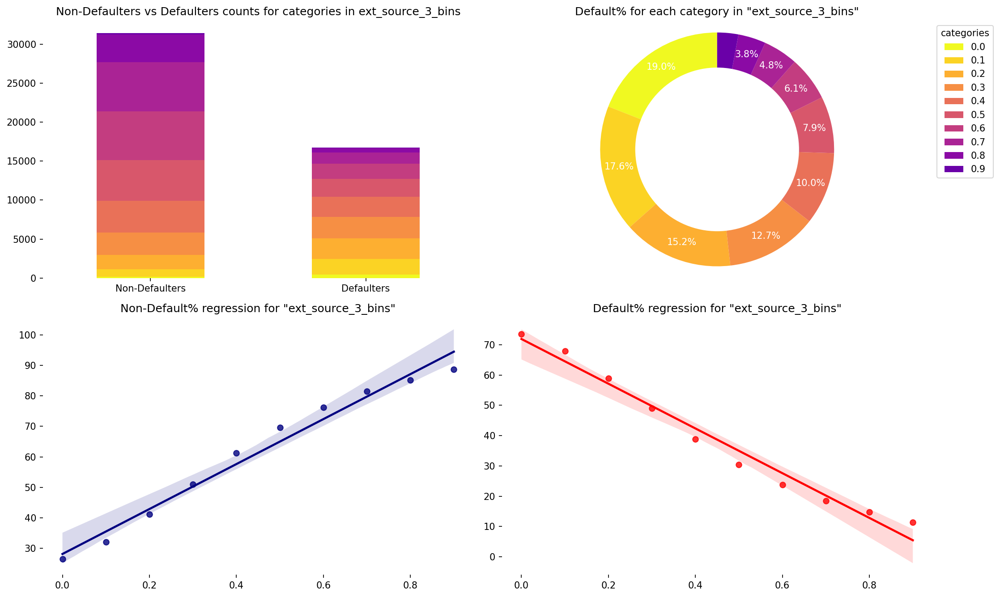

In [128]:
biv_vizz_n('ext_source_3_bins', 'target', df2)

#### There is a clear downward trend in the regression line, indicating that as the external scores increase, the default percentage decreases. This means that higher scores from these external data sources are associated with lower default rates.

In [129]:
cols_to_drop_2 = ['region_rating_client', 'region_rating_client_w_city'] # no variance
df2.drop(columns = cols_to_drop_2, inplace=True)
df2.shape

(48175, 85)

In [130]:
df2.columns[df2.columns.str.contains('document')].value_counts()

flag_document_2     1
flag_document_3     1
flag_document_20    1
flag_document_19    1
flag_document_18    1
flag_document_17    1
flag_document_16    1
flag_document_15    1
flag_document_14    1
flag_document_13    1
flag_document_12    1
flag_document_11    1
flag_document_10    1
flag_document_9     1
flag_document_8     1
flag_document_7     1
flag_document_6     1
flag_document_5     1
flag_document_4     1
flag_document_21    1
dtype: int64

In [131]:
df2.drop(columns = (df2.columns[df2.columns.str.contains('document')]), inplace = True)
df2.shape

(48175, 65)

In [132]:
df3 = df2.copy()

In [133]:
pdf = pd.read_csv(r"C:\Users\dell\Downloads\Loan Defaulter Project\Loan Defaulter Datasets\previous_application.csv")
pdf.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,"1,730","17,145","17,145",0,"17,145",SATURDAY,15,Y,1,0,0,1,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12,middle,POS mobile with interest,"365,243",-42,300,-42,-37,0
1,2802425,108129,Cash loans,"25,189","607,500","679,671",NaN,"607,500",THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36,low_action,Cash X-Sell: low,"365,243",-134,916,"365,243","365,243",1
2,2523466,122040,Cash loans,"15,061","112,500","136,444",NaN,"112,500",TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12,high,Cash X-Sell: high,"365,243",-271,59,"365,243","365,243",1
3,2819243,176158,Cash loans,"47,041","450,000","470,790",NaN,"450,000",MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12,middle,Cash X-Sell: middle,"365,243",-482,-152,-182,-177,1
4,1784265,202054,Cash loans,"31,924","337,500","404,055",NaN,"337,500",THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [134]:
pdf.columns = [cols.lower() for cols in pdf.columns]
data = df3.join(pdf, on='sk_id_curr', how='left', lsuffix='1')
data.sample(5)

,sk_id_curr1,target,name_contract_type1,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,amt_credit1,amt_annuity1,amt_goods_price1,name_type_suite1,name_income_type,name_education_type,name_family_status,name_housing_type,region_population_relative,years_birth,days_employed,days_registration,days_id_publish,own_car_age,flag_emp_phone,flag_work_phone,flag_cont_mobile,flag_phone,flag_email,occupation_type,cnt_fam_members,weekday_appr_process_start1,hour_appr_process_start1,reg_region_not_live_region,reg_region_not_work_region,live_region_not_work_region,reg_city_not_live_city,reg_city_not_work_city,live_city_not_work_city,organization_type,ext_source_2,ext_source_3,obs_30_cnt_social_circle,years_last_phone_change,amt_req_credit_bureau_hour,amt_req_credit_bureau_day,amt_req_credit_bureau_week,amt_req_credit_bureau_mon,amt_req_credit_bureau_qrt,amt_req_credit_bureau_year,years_birth_bins,flag_own_car_and_realty,flag_own_none,flag_own_car_or_realty,amt_credit_bin,amt_annuity_bin,years_employed,mismatched_add,obs_30_cnt_social_circle_exp,amt_req_credits_total,flag_contact_points,amt_goods_price_bins,own_car_age_bins,region_population_relative_bin,days_registration_df,ext_source_2_bins,ext_source_3_bins,sk_id_prev,sk_id_curr,name_contract_type,amt_annuity,amt_application,amt_credit,amt_down_payment,amt_goods_price,weekday_appr_process_start,hour_appr_process_start,flag_last_appl_per_contract,nflag_last_appl_in_day,rate_down_payment,rate_interest_primary,rate_interest_privileged,name_cash_loan_purpose,name_contract_status,days_decision,name_payment_type,code_reject_reason,name_type_suite,name_client_type,name_goods_category,name_portfolio,name_product_type,channel_type,sellerplace_area,name_seller_industry,cnt_payment,name_yield_group,product_combination,days_first_drawing,days_first_due,days_last_due_1st_version,days_last_due,days_termination,nflag_insured_on_approval
45145,417866,0,Cash loans,F,0,0,1,12,13,10,13,Other_B,Working,Higher education,Single / not married,House / apartment,0,32,1,10,11,0,1,0,1,1,0,Core staff,2,TUESDAY,13,0,0,0,0,0,0,Self-employed,0,1,0,0,0,0,0,0,0,0,30,0,1,0,440000,22000,3,0,1,1,2,400000,new,25,"1,320",0,1,2567901,110774,Consumer loans,"8,094","74,250","72,450","7,425","74,250",SATURDAY,12,Y,1,0,NaN,NaN,XAP,Approved,-200,Cash through the bank,XAP,NaN,Repeater,Furniture,POS,XNA,Stone,500,Furniture,10,low_normal,POS industry with interest,"365,243",-157,113,"365,243","365,243",0
13173,192503,0,Cash loans,F,1,1,0,12,14,11,13,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0,33,2,1,10,2,1,0,1,0,0,Private service staff,2,THURSDAY,12,0,0,0,0,0,0,Business Entity Type 3,0,0,0,0,0,0,0,0,0,1,30,1,0,1,810000,49000,9,0,1,4,1,700000,old,19,"4,662",0,0,2672855,169301,Consumer loans,"5,494","40,401","43,956",0,"40,401",THURSDAY,15,Y,1,0,NaN,NaN,XAP,Approved,-749,Cash through the bank,XAP,NaN,Repeater,Consumer Electronics,POS,XNA,Country-wide,2301,Consumer electronics,10,high,POS household with interest,"365,243",-716,-446,-446,-438,0
10209,171772,1,Cash loans,M,0,0,0,12,13,10,13,Unaccompanied,Commercial associate,Secondary / secondary special,Civil marriage,House / apartment,0,27,1,11,6,0,1,0,1,0,0,Laborers,2,SUNDAY,9,0,0,0,0,1,0,Other,0,0,1,0,0,0,0,0,0,1,30,0,1,0,360000,18000,2,1,4,4,1,400000,new,25,340,0,0,2485425,392707,Consumer loans,"4,073","21,150","19,976","2,115","21,150",WEDNESDAY,13,Y,1,0,NaN,NaN,XAP,Refused,-1799,Cash through the bank,HC,Unaccompanied,Repeater,Furniture,POS,XNA,Stone,207,Furniture,6,high,POS industry with interest,NaN,NaN,NaN,NaN,NaN,NaN
39218,376276,1,Cash loans,F,0,0,0,12,14,11,14,Family,Working,Secondary / secondary special,Married,House / apartment,0,41,2,13,14,0,1,0,1,1,0,Laborers,2,THURSDAY,16,0,0,0,0,0,0,Trade: type 7,0,0,1,0,0,0,0,0,0,1,40,0,1,0,980000,44000,6,0,2,2,2,900000,new,10,593,0,0,1184587,233565,Revolving loans,"2,250","45,000","45,000",NaN,"45,000",SUNDAY,14,Y,1,NaN,NaN,NaN,XAP,Approved,-21,XNA,XAP,Unaccompanied,Repeater,XNA

In [135]:
data.shape

(48175, 102)

In [136]:
cols_to_drop_3 = data.columns[data.columns.str.contains('1')] # dropping duplicatted columns
data.drop(columns = cols_to_drop_3, inplace = True)
data.shape

(48175, 93)

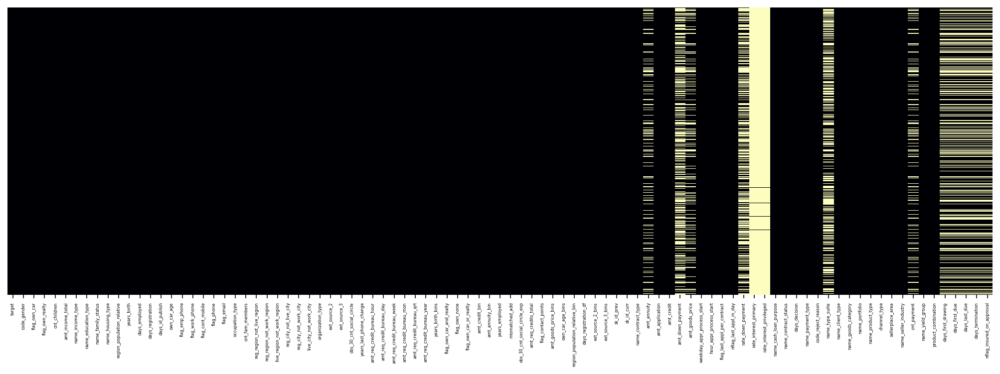

In [137]:
plt.figure(figsize=(17, 5))
sns.heatmap(data.isna(),cbar=False, yticklabels = False, cmap='magma')
plt.xticks(fontsize=4);

In [138]:
data.dropna(axis=1, inplace=True) # dropping columns with null values
data.shape

(48175, 79)

In [139]:
data.columns.get_loc('name_contract_type')

59

In [140]:
data.iloc[:, 56:].sample(5)

,ext_source_3_bins,sk_id_prev,sk_id_curr,name_contract_type,amt_application,amt_credit,weekday_appr_process_start,hour_appr_process_start,flag_last_appl_per_contract,nflag_last_appl_in_day,name_cash_loan_purpose,name_contract_status,days_decision,name_payment_type,code_reject_reason,name_client_type,name_goods_category,name_portfolio,name_product_type,channel_type,sellerplace_area,name_seller_industry,name_yield_group
46440,1,2316691,200678,Cash loans,0,0,WEDNESDAY,17,Y,1,XNA,Canceled,-288,XNA,XAP,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,XNA
16851,0,2111448,180278,Cash loans,0,0,MONDAY,15,Y,1,XNA,Canceled,-185,XNA,XAP,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,XNA
16081,0,2784678,100344,Cash loans,"67,500","71,955",SUNDAY,13,Y,1,XNA,Approved,-202,Cash through the bank,XAP,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,low_normal
25443,0,1206472,141520,Consumer loans,"244,318","268,506",SUNDAY,18,Y,1,XAP,Approved,-845,Cash through the bank,XAP,Repeater,Audio/Video,POS,XNA,Country-wide,1700,Consumer electronics,low_normal
21511,1,1587575,194702,Cash loans,0,0,THURSDAY,10,Y,1,XNA,Canceled,-83,XNA,XAP,Repeater,XNA,XNA,XNA,Contact center,-1,XNA,XNA


In [141]:
data.iloc[:, 56:].columns # 8 coloumns already analysed

Index(['ext_source_3_bins', 'sk_id_prev', 'sk_id_curr', 'name_contract_type',
       'amt_application', 'amt_credit', 'weekday_appr_process_start',
       'hour_appr_process_start', 'flag_last_appl_per_contract',
       'nflag_last_appl_in_day', 'name_cash_loan_purpose',
       'name_contract_status', 'days_decision', 'name_payment_type',
       'code_reject_reason', 'name_client_type', 'name_goods_category',
       'name_portfolio', 'name_product_type', 'channel_type',
       'sellerplace_area', 'name_seller_industry', 'name_yield_group'],
      dtype='object')

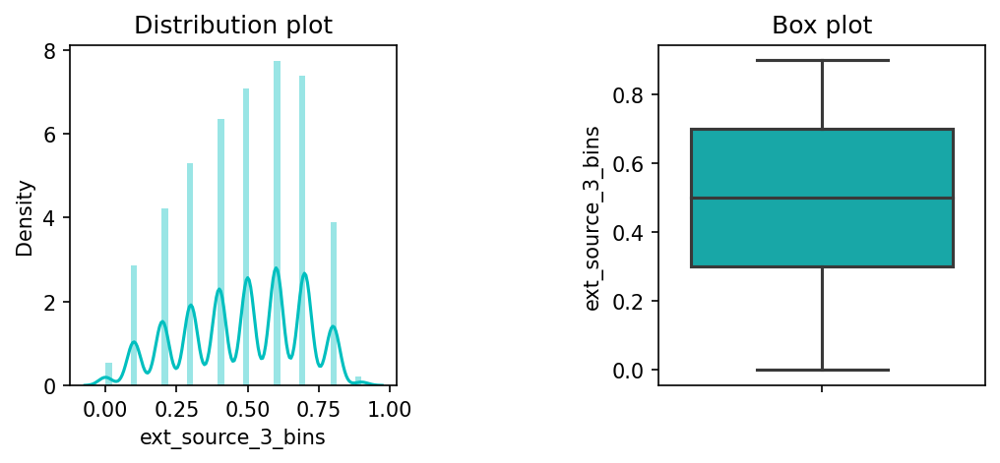

ext_source_3_bins, no of outliers 0


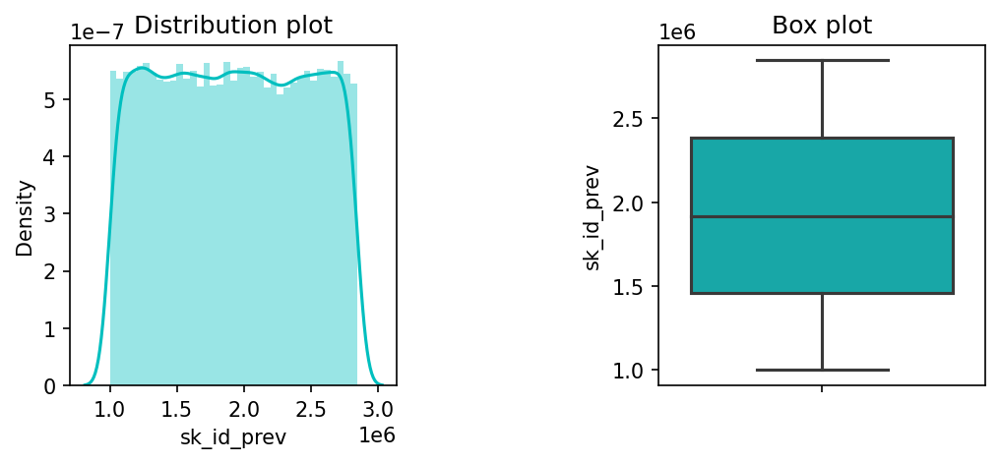

sk_id_prev, no of outliers 0


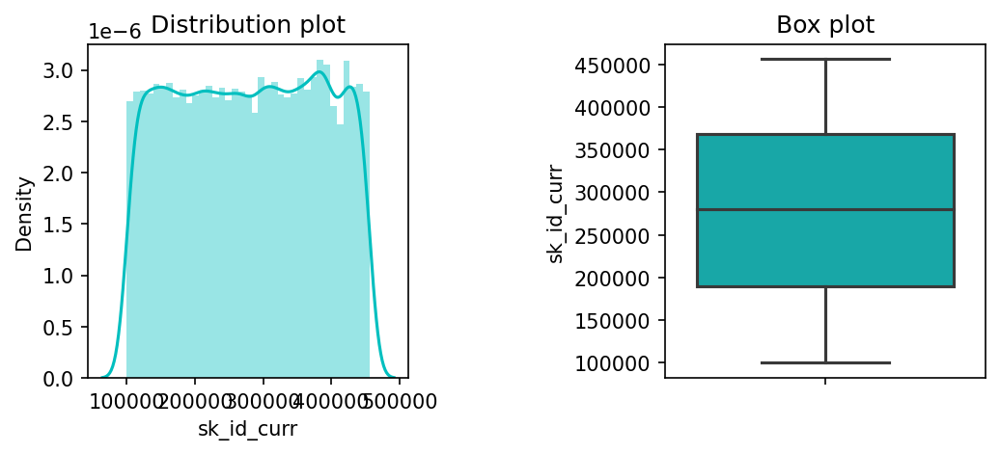

sk_id_curr, no of outliers 0


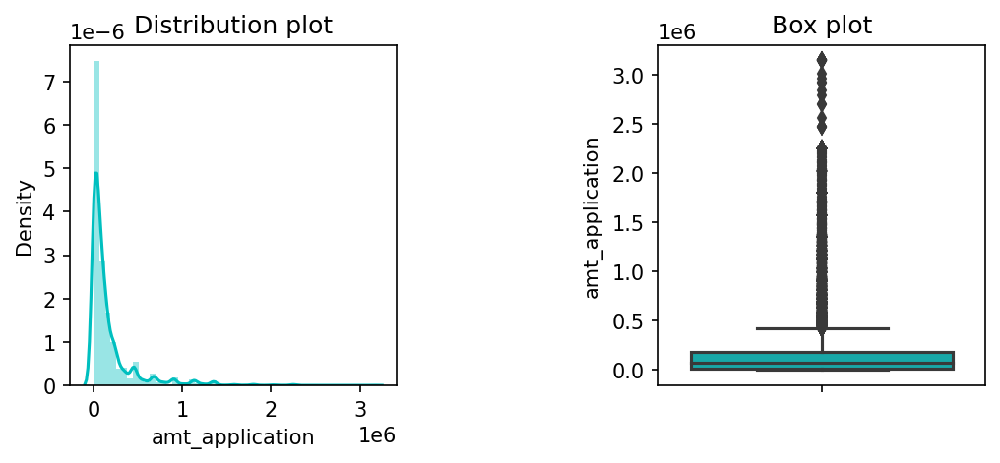

amt_application, no of outliers 5896


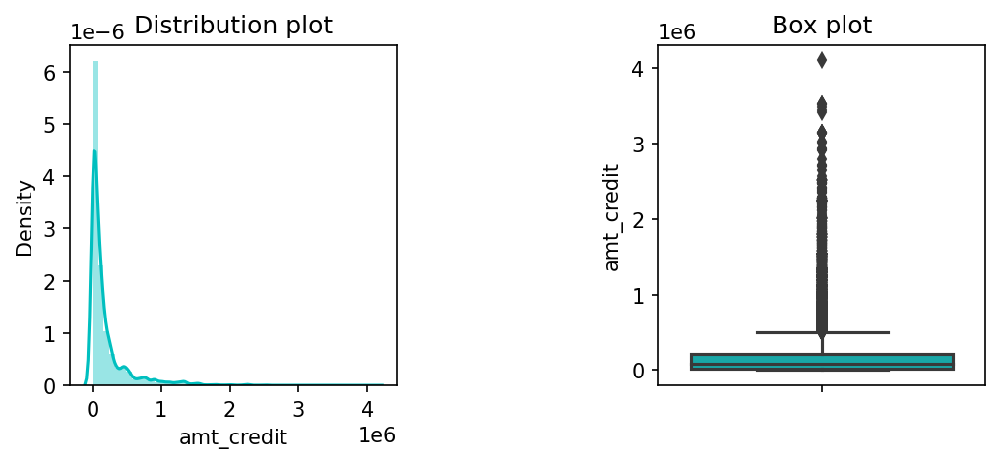

amt_credit, no of outliers 5147


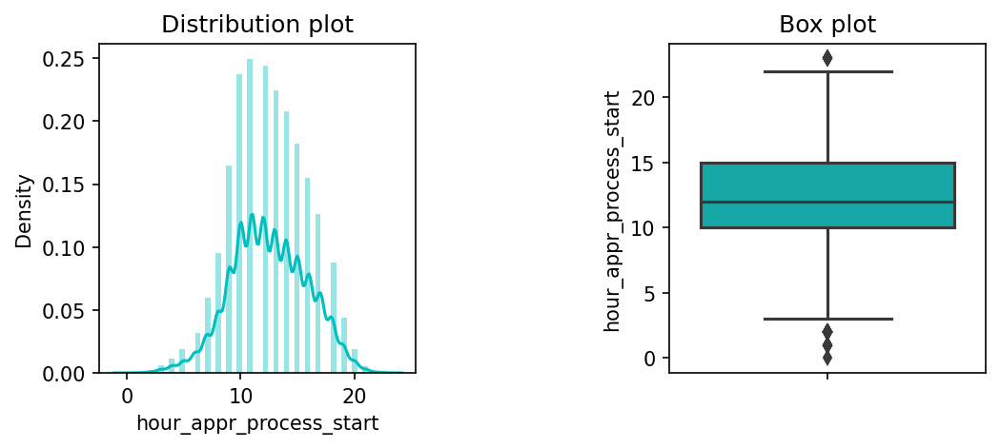

hour_appr_process_start, no of outliers 54


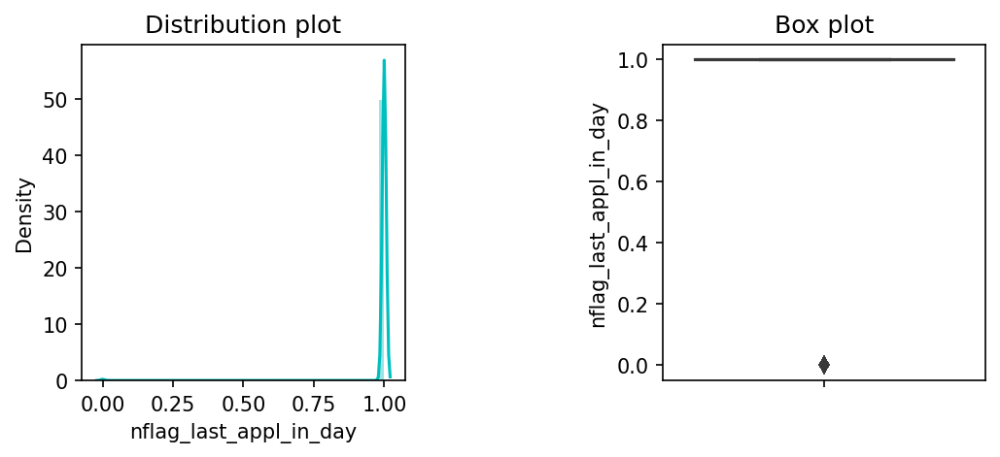

nflag_last_appl_in_day, no of outliers 176


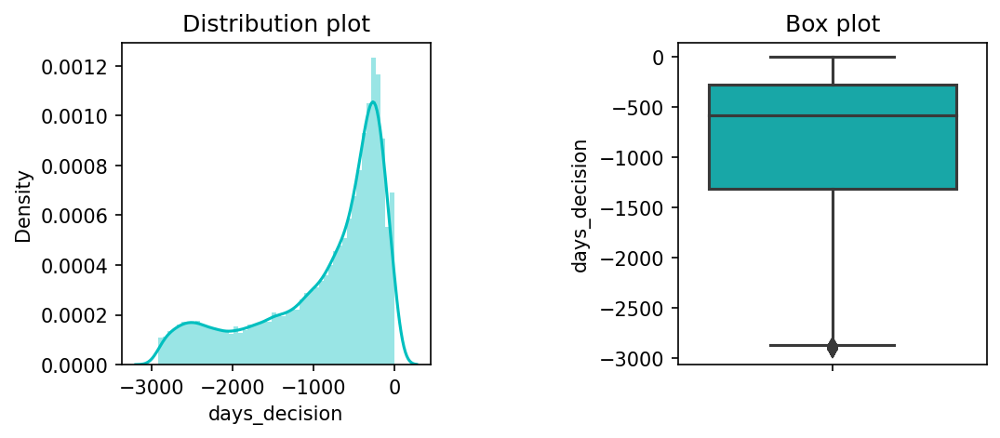

days_decision, no of outliers 233


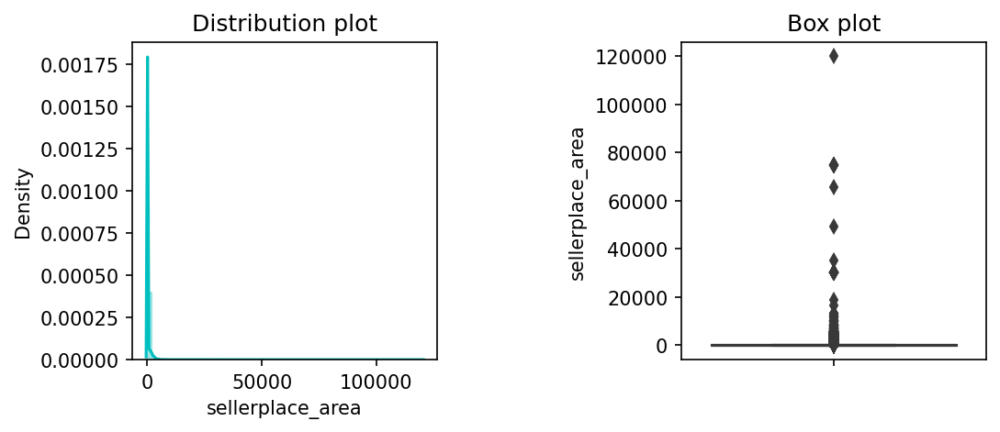

sellerplace_area, no of outliers 7755


In [142]:
univatriate_analysis(data.iloc[:, 56:])

In [143]:
def outlier_treatment_2(df):
    
    numeric_columns = df.select_dtypes(include='number').columns

    for cols in numeric_columns: 
        col = df[cols]
        
        # outlier detection
        IQR = np.percentile(col, 75) - np.percentile(col, 25)
        cutoff = IQR * 1.5
        upper_bound = np.percentile(col, 75) + cutoff
        lower_bound = np.percentile(col, 25) - cutoff
        
        upper_outliers_mask = (df[cols] > upper_bound)
        lower_outliers_mask = (df[cols] < lower_bound)
        
        # Combine the masks
        outliers_mask = upper_outliers_mask | lower_outliers_mask
        outliers = df[outliers_mask]
        
        print(cols)
        
        # treating outliers            
        if not outliers.empty:
            df.loc[upper_outliers_mask, cols] = df[cols].quantile(0.75)
            df.loc[lower_outliers_mask, cols] = df[cols].quantile(0.25)
                
        print(df[cols].skew())
        print()
        
    return df

In [144]:
data_tr = outlier_treatment_2(data.iloc[:, 56:])

ext_source_3_bins
-0.272550343723456

sk_id_prev
0.006184256586338482

sk_id_curr
-0.013763295080308954

amt_application
0.9231148978929936

amt_credit
1.1532165954614526

hour_appr_process_start
0.009597330381097793

nflag_last_appl_in_day
0

days_decision
-1.0265481228095783

sellerplace_area
1.3079382674225222



In [145]:
xna_list = data.columns[(data == 'XNA').any()].tolist()
cols_to_drop_7 = data[xna_list].apply(lambda x: x.value_counts().get('XNA', 0)).to_dict()
cols_to_drop_7

{'name_contract_type': 14,
 'name_cash_loan_purpose': 19461,
 'name_payment_type': 18011,
 'code_reject_reason': 163,
 'name_client_type': 55,
 'name_goods_category': 27320,
 'name_portfolio': 10826,
 'name_product_type': 30853,
 'name_seller_industry': 24565,
 'name_yield_group': 14985}

In [146]:
cols_values = [col for col, value in cols_to_drop_7.items() if value > 10000]
data.drop(columns = cols_values, inplace = True) # High percentage of values marked as XNA
data.shape

(48175, 72)

In [147]:
data['flag_last_appl_per_contract'].value_counts()

Y    47921
N      254
Name: flag_last_appl_per_contract, dtype: int64

In [148]:
data['nflag_last_appl_in_day'].value_counts()

1    47999
0      176
Name: nflag_last_appl_in_day, dtype: int64

In [149]:
data.drop(columns = ['flag_last_appl_per_contract', 'nflag_last_appl_in_day'], inplace = True) # very less variance
data.shape

(48175, 70)

In [150]:
data['sellerplace_area'].value_counts() # data is skewed as well as seems ininformative according to domian
data.drop(columns = 'sellerplace_area', inplace = True)
data.shape

(48175, 69)

In [151]:
data['code_reject_reason'].value_counts() # XAP

XAP       39043
HC         5010
LIMIT      1639
SCO        1046
CLIENT      786
SCOFR       372
XNA         163
VERIF        91
SYSTEM       25
Name: code_reject_reason, dtype: int64

In [152]:
data.drop(columns = 'code_reject_reason', inplace = True)
data.shape

(48175, 68)

### Is there a specific loan application amount range where defaults are more prevalent?

In [153]:
pd.set_option('display.float_format', '{:,.3f}'.format)

In [154]:
data['amt_application_bins'] = data['amt_application'].astype(int).round(-5)

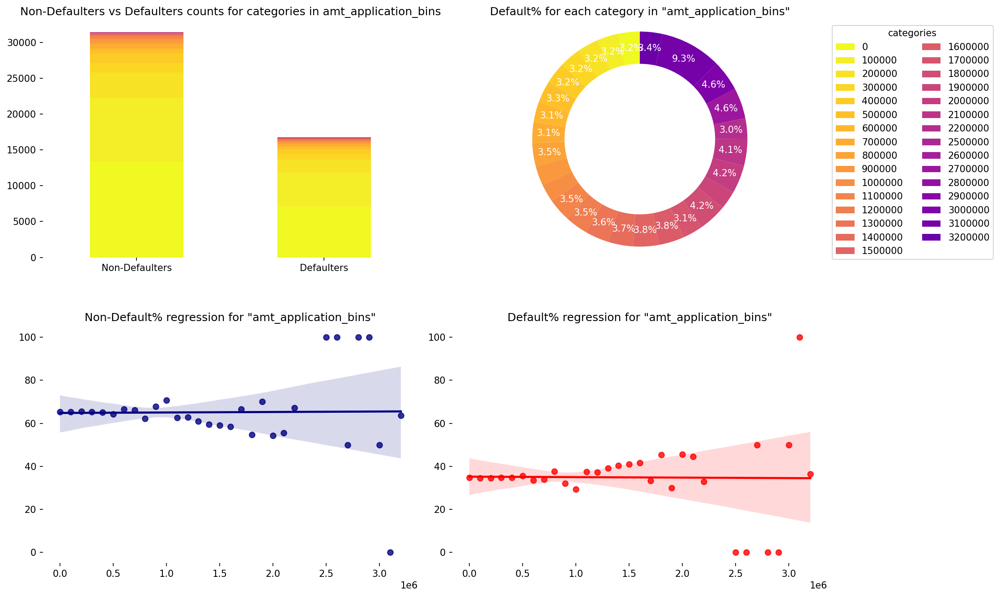

In [155]:
biv_vizz_n('amt_application_bins', 'target', data)

#### Lower loan amounts might have a slightly higher default rate than middle amounts, with variability in the higher loan amounts.

## Is there any type of contract that has higher default rate?

In [156]:
data.loc[data['name_contract_type'] == 'XNA', 'name_contract_type'] = data['name_contract_type'].mode()[0]
data['name_contract_type'].value_counts()

Cash loans         21502
Consumer loans     21139
Revolving loans     5534
Name: name_contract_type, dtype: int64

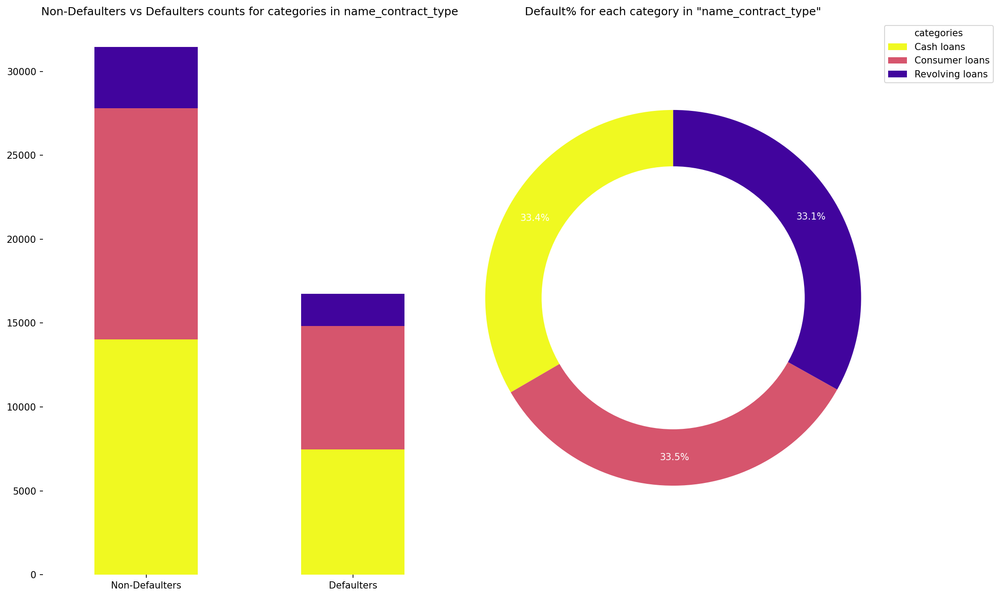

In [157]:
biv_vizz_c('name_contract_type', 'target', data)

#### The distribution is very similar for each contract type.

### Does the time gap (in days) between consecutive applications within a day influence default rates?

In [158]:
data['days_decision'] = data['days_decision'].abs()
data['days_decision_bins'] = data['days_decision'].round(-2)

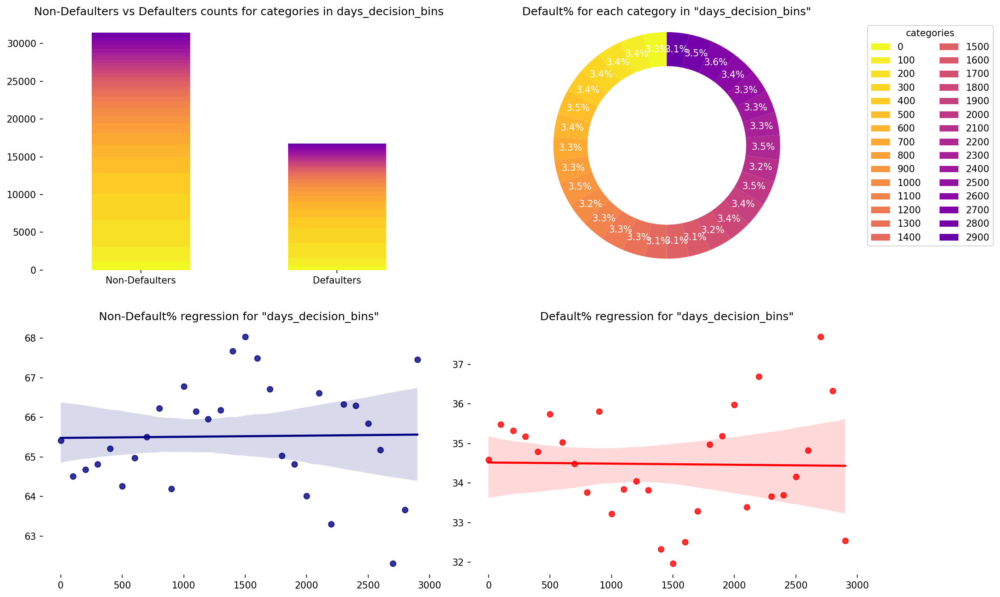

In [159]:
biv_vizz_n('days_decision_bins', 'target', data)

In [160]:
decision_data = data[data['days_decision'] <= 30]
decision_data['decision_in_a_month'] = decision_data['days_decision'].round(-1)
decision_data['decision_in_a_month'] = decision_data['decision_in_a_month'].replace([0,10,20,30], ['on same day', 'within 10 days', '10-20 days', 'about a month\'s time'])

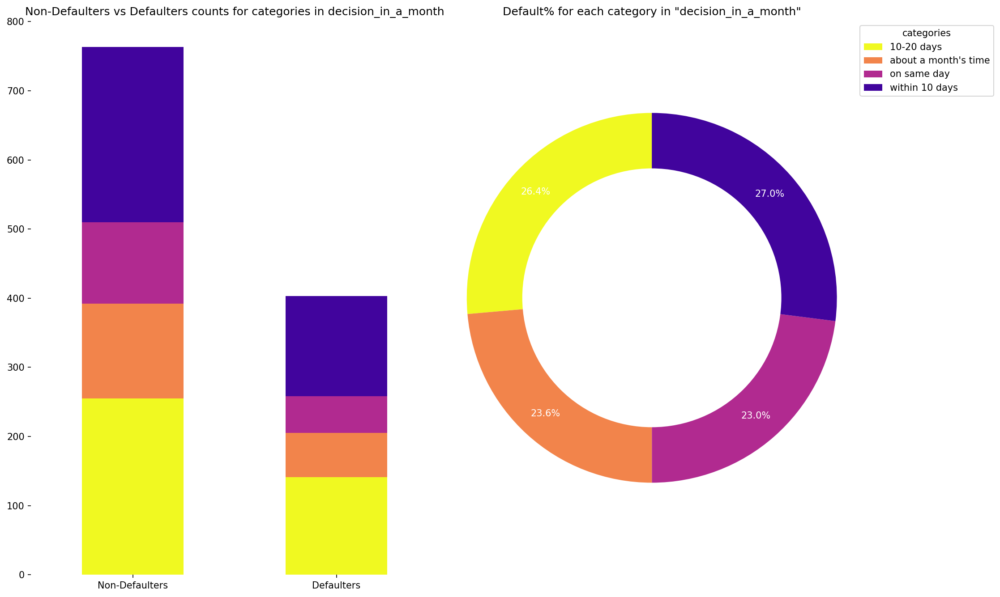

In [161]:
biv_vizz_c('decision_in_a_month', 'target', decision_data)

#### Defaults are roughly evenly distributed across the various time intervals. The data suggests that there is not a clear linear trend between the time gap of consecutive applications and default rates.

## Loan History:
### Is there a relationship between the channel through which a client was acquired and the likelihood of default?

In [162]:
data['channel_type'].value_counts()

Credit and cash offices       20540
Country-wide                  14414
Stone                          6128
Regional / Local               3090
Contact center                 2190
AP+ (Cash loan)                1650
Channel of corporate sales      150
Car dealer                       13
Name: channel_type, dtype: int64

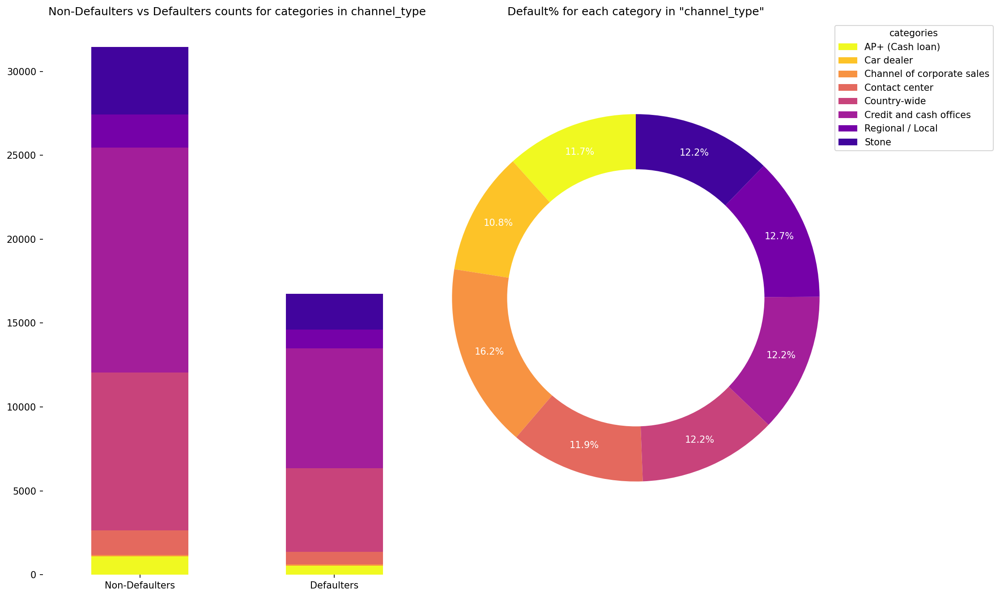

In [163]:
biv_vizz_c('channel_type', 'target', data)

#### The "Channel of corporate sales" stands out with the highest percentage, while "Car dealer" has the lowest. But significance of relationship between the acquisition channel and the likelihood of default is still questionable.

### How does the default rate vary for clients based on their previous contract status?

In [164]:
data['name_contract_status'].value_counts() # assuming if the variable is related to a prior loan and the target is related to a subsequent loan, then this variable can be very useful. 
data.groupby('name_contract_status')['target'].value_counts(normalize = True)

name_contract_status  target
Approved              0        0.656
                      1        0.344
Canceled              0        0.649
                      1        0.351
Refused               0        0.644
                      1        0.356
Unused offer          0        0.644
                      1        0.356
Name: target, dtype: float64

In [165]:
status_data = data.groupby('name_contract_status')['target'].value_counts().unstack()
status_data = status_data.reset_index()
status_data_no_difficulties = status_data.drop(index = 0)
status_data_no_difficulties

target,name_contract_status,0,1
1,Canceled,5964,3223
2,Refused,5378,2967
3,Unused offer,506,280


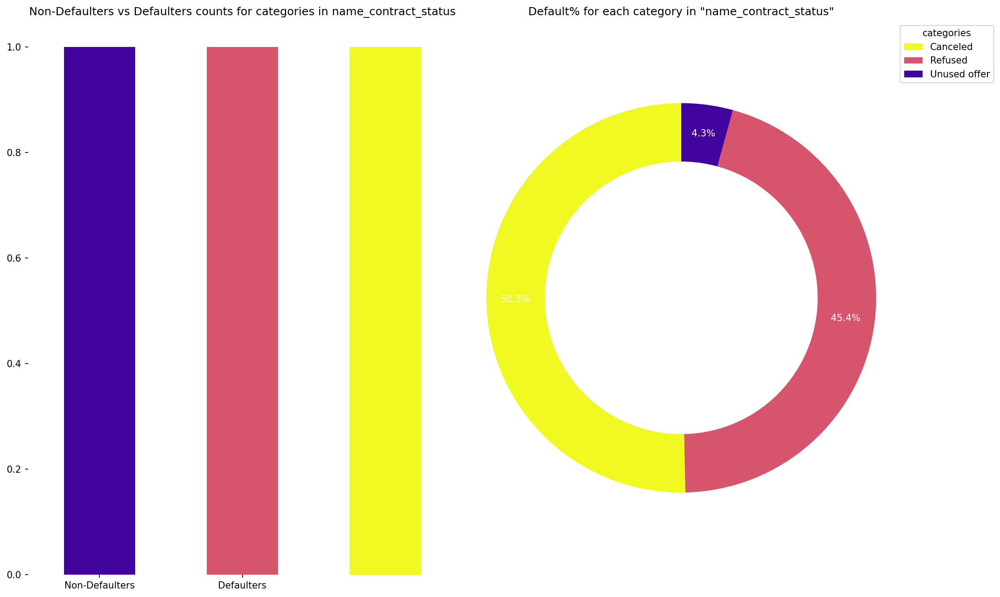

In [166]:
biv_vizz_c( 'name_contract_status', 0, status_data_no_difficulties) # The score is ambiguous unless it refers to a subsequent loan.

Clients those had no or '0' difficulty in paying for the loan and were previously had cancelled/left unused or were rejected applications i.e. suggesting type 1 error

In [167]:
status_data_with_difficulty_1 = status_data[status_data['name_contract_status'] == 'Approved']
status_data_with_difficulty_1

target,name_contract_status,0,1
0,Approved,19592,10265


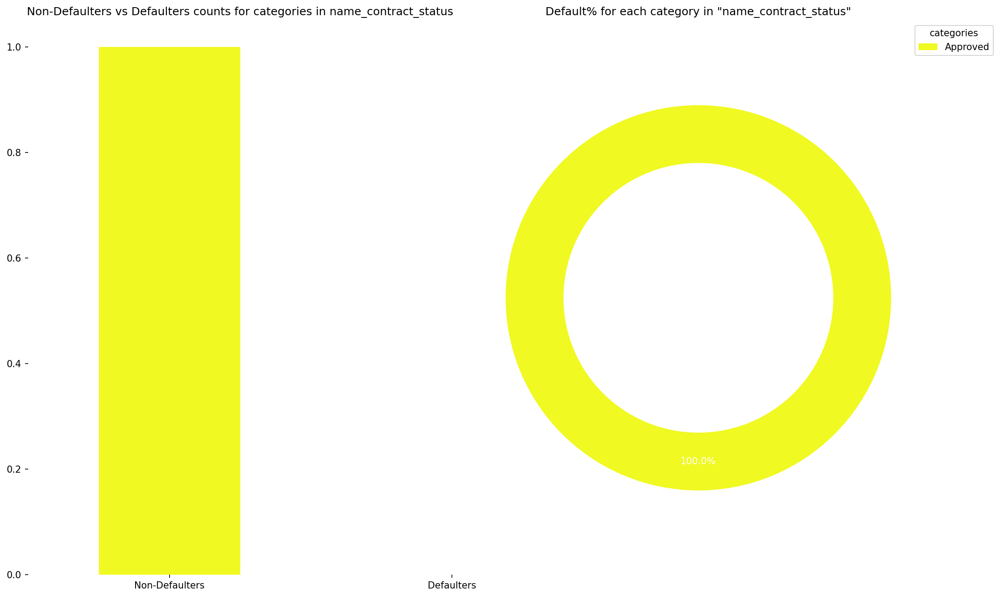

In [168]:
biv_vizz_c('name_contract_status', 1,  status_data_with_difficulty_1)

Clients those had no or '0' difficulty in paying for the loan and were previously had cancelled/left unused or were rejected applications i.e. suggesting type 2 error

In [169]:
data['name_contract_status'] = data['name_contract_status'].replace(['Approved', 'Canceled' ,'Refused' ,'Unused offer'], [0, 1, 1, 1])

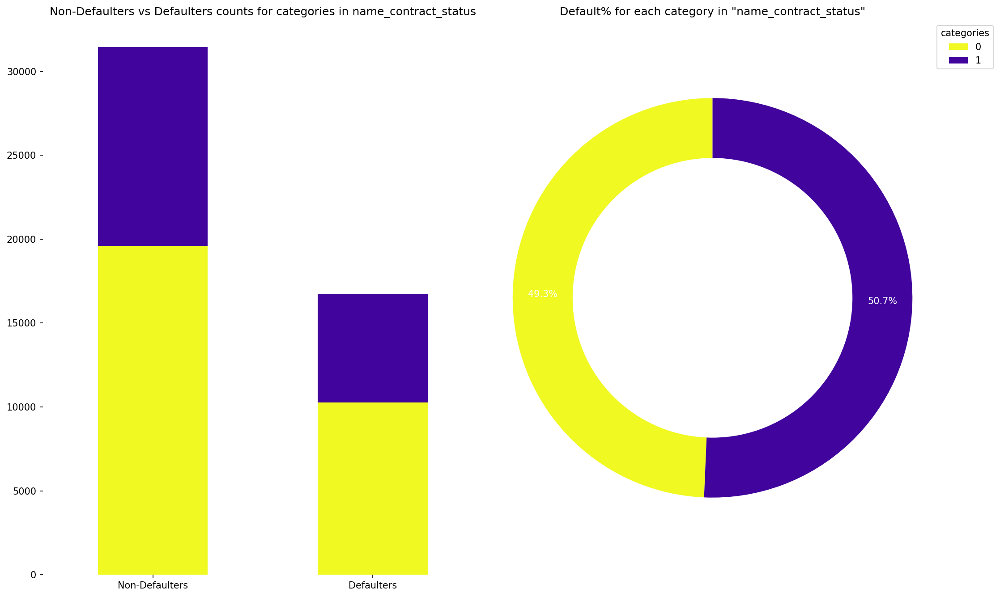

In [170]:
biv_vizz_c('name_contract_status', 'target', data)

#### It is not so strong an argument to justify if those who were previously not sanctioned a loan if they would have lower ability to repay a loan in future. And also if those who were approved of loans earlier will not end up defualting.

### Do clients who seek for loan again tend to default less than others?

In [171]:
data['name_client_type'].value_counts()
data['name_client_type'] = data['name_client_type'].replace('XNA', 'Repeater') ## Mode Imputation
data.groupby('name_client_type')['target'].value_counts()

name_client_type  target
New               0          5716
                  1          3092
Refreshed         0          2518
                  1          1394
Repeater          0         23206
                  1         12249
Name: target, dtype: int64

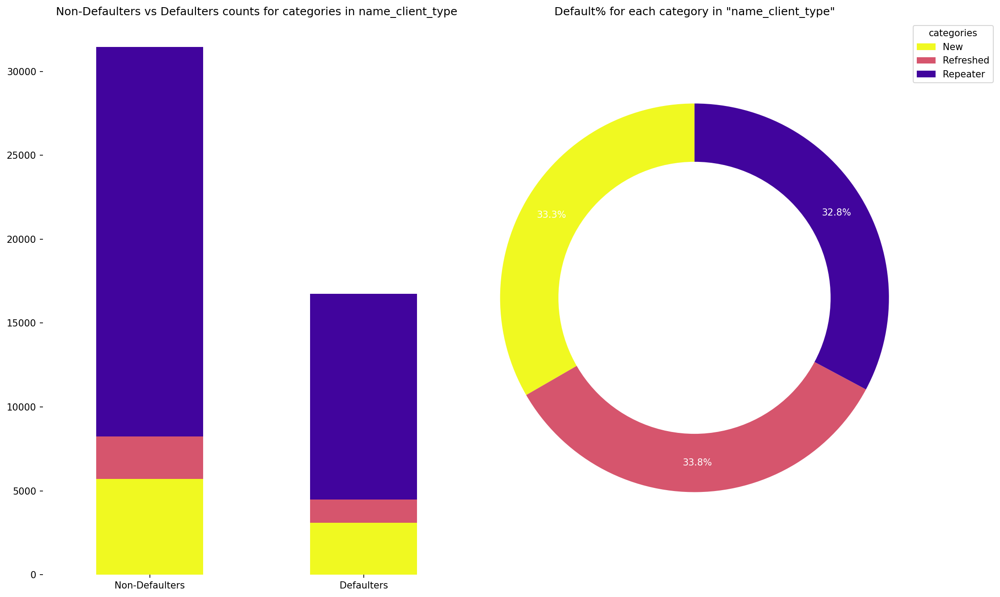

In [172]:
biv_vizz_c('name_client_type', 'target', data)

###  Repeaters might gain lender's trust but it's essential to note that while there is a difference in default rates among the categories, the difference is not very large.

## Multivariate Analysis

### How does the combination of gender, owning a house, and number of children affect the likelihood of loan default?

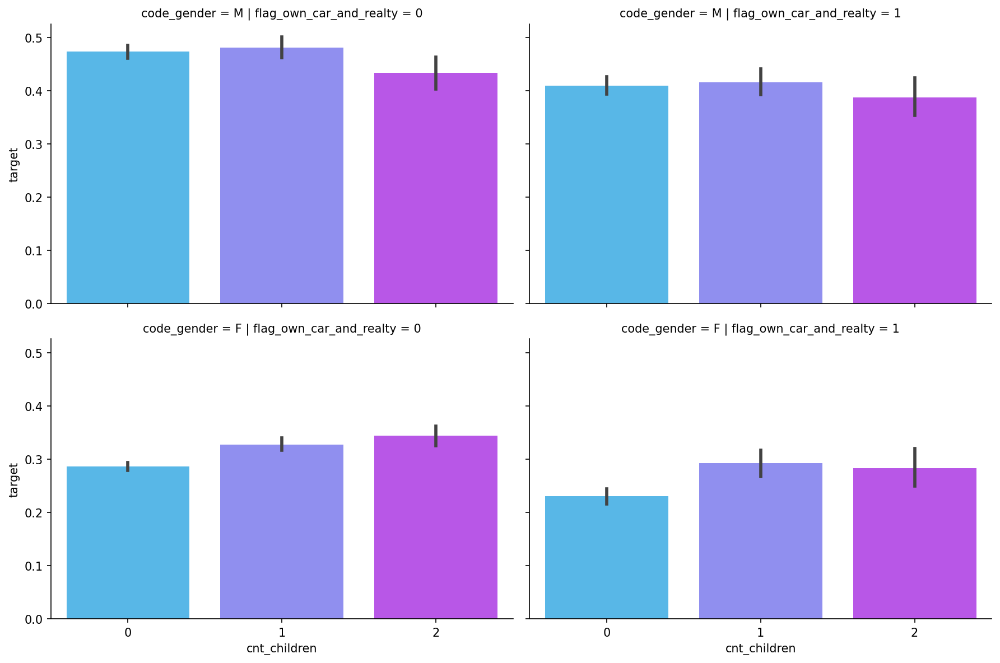

In [173]:
g = sns.FacetGrid(data, col='flag_own_car_and_realty', row='code_gender', height=4, aspect=1.5)
g.map(sns.barplot, 'cnt_children', 'target', order=sorted(data['cnt_children'].unique()), palette='cool')
plt.show()

#### Owning both a car and real estate seems to slightly mitigate the likelihood of defaulting on a loan, especially evident when comparing people with the same number of children.

### Are there significant interactions between gender and income level in influencing default rates?

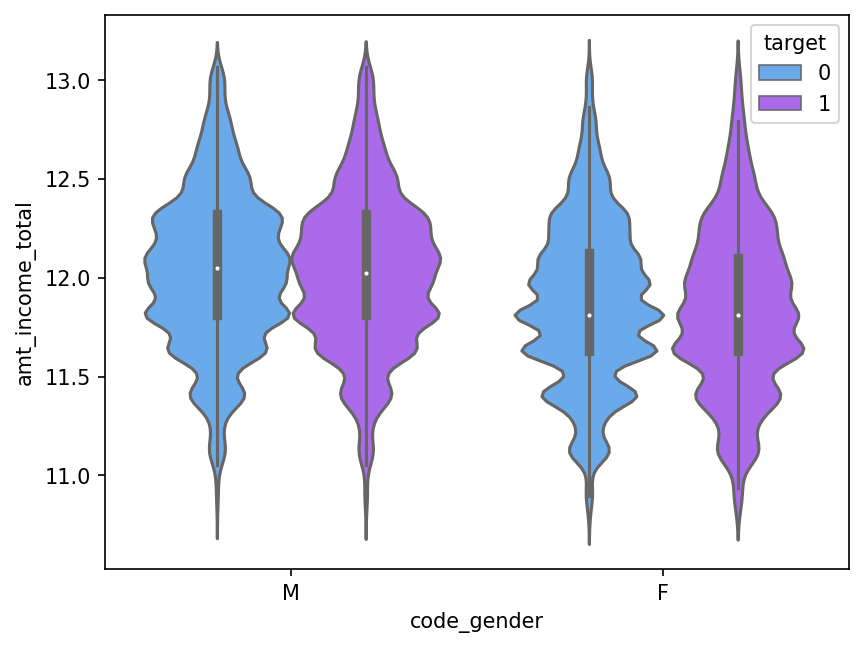

In [174]:
sns.violinplot(x='code_gender', y='amt_income_total', data=data, hue='target', palette='cool');

#### The income distribution for male and female non-defaulters looks quite similar, with no significant differences in the medians.

### How does the interaction between client's income, credit amount, and loan annuity impact default rates?

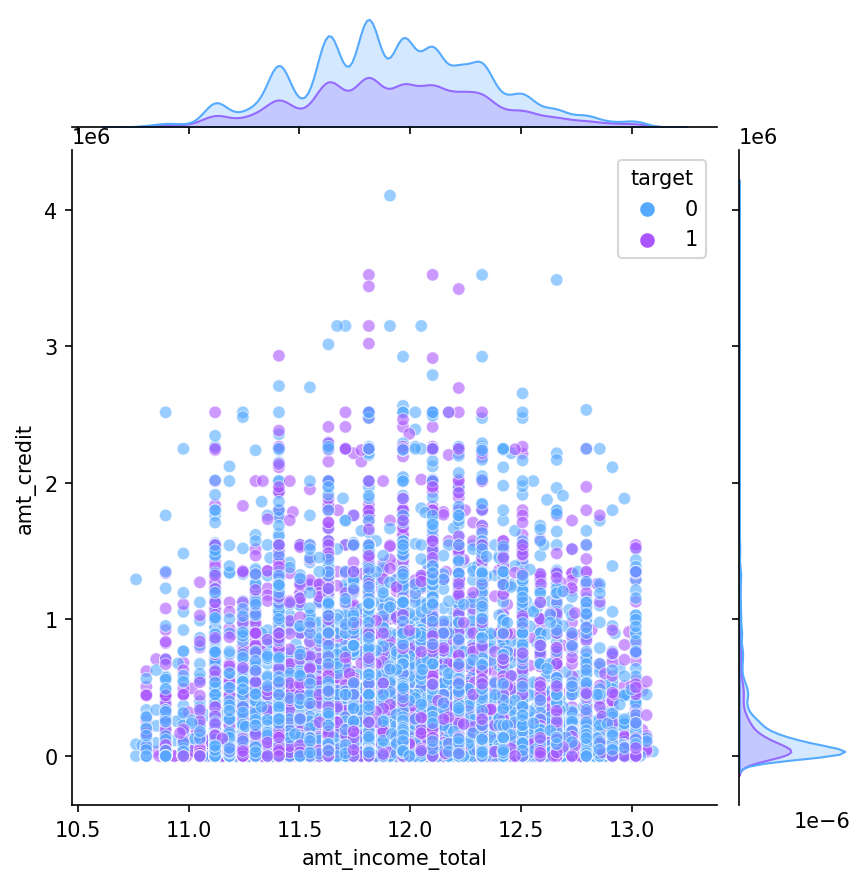

In [175]:
sns.jointplot(x = 'amt_income_total', y = 'amt_credit', data=data, hue='target', alpha = 0.6, palette = 'cool');

#### There's a higher density of points (both blue and purple) towards the lower left corner of the plot, indicating that most clients fall into a category of lower income and lower credit amounts.

### How do loan type, day of the week, and application hour jointly influence default rates?

In [176]:
g = sns.FacetGrid(data, col= 'weekday_appr_process_start', row= 'hour_appr_process_start', height= 4, aspect=1.5)
g.map(sns.barplot,'name_contract_type', 'target', palette='cool');

### Do clients from certain occupations with specific education levels show distinct patterns in defaulting?

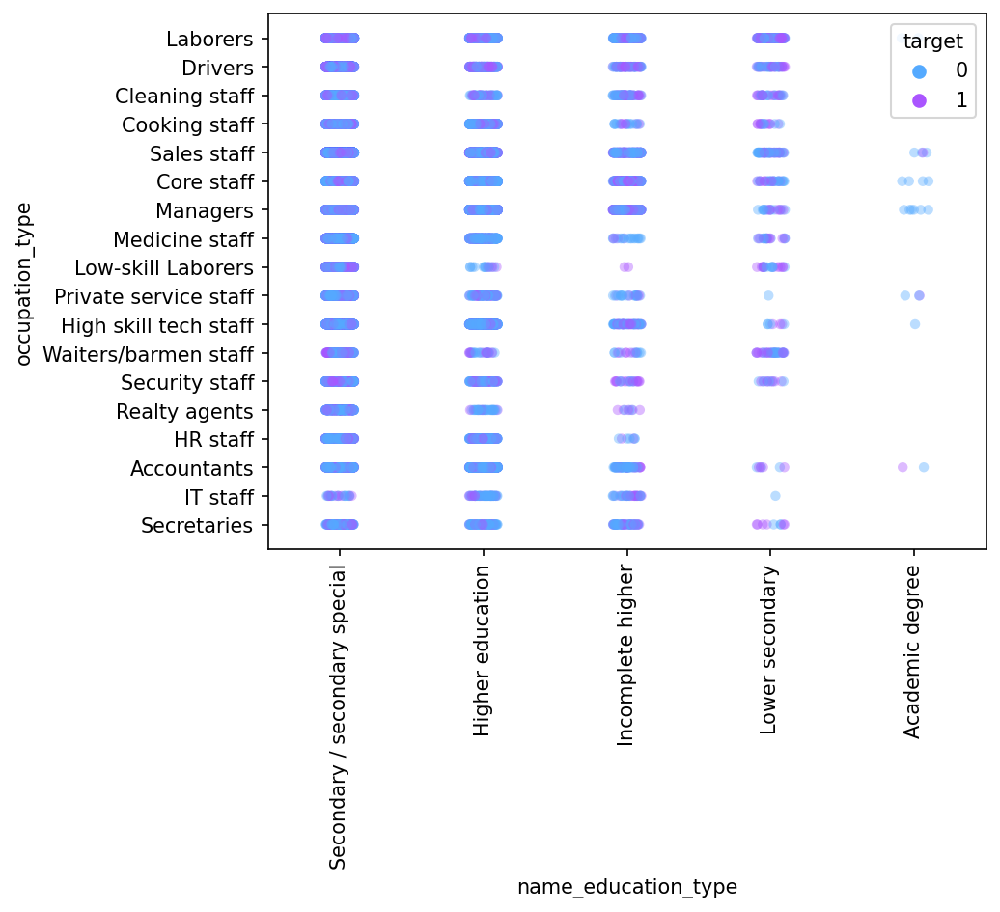

In [177]:
sns.stripplot(x = 'name_education_type', y = 'occupation_type', data=data, hue = 'target', alpha=0.4, palette='cool')
plt.xticks(rotation=90);

#### The default behavior doesn't seem to be strongly tied to education level alone. 

### How does the employment duration, occupation type correlate with default rates?

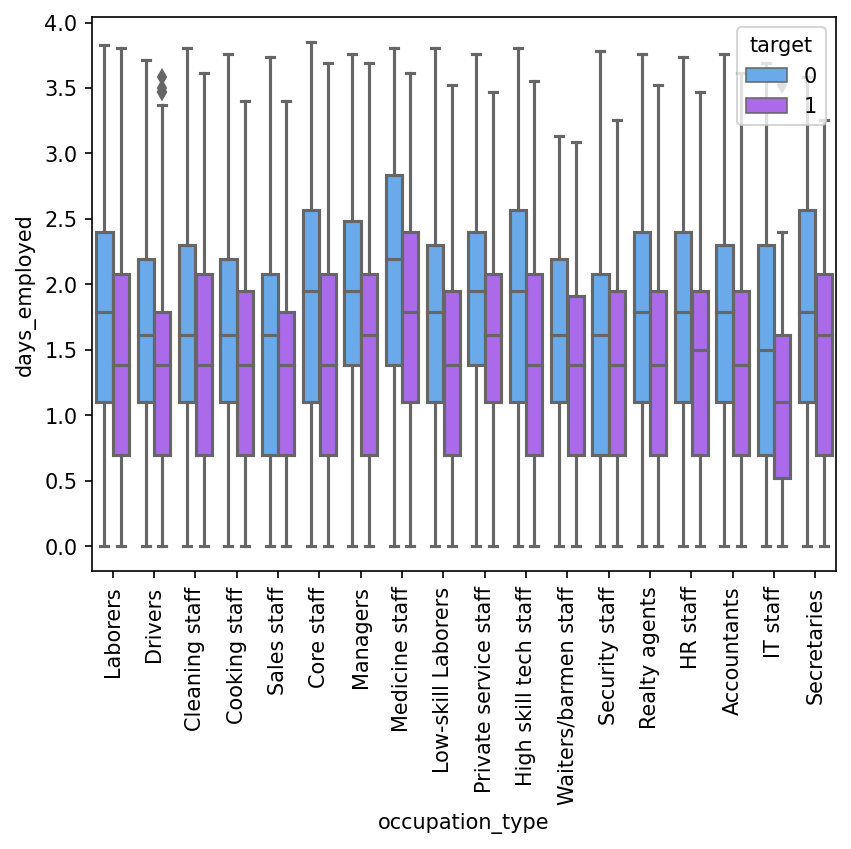

In [178]:
sns.boxplot(y='days_employed', hue='target', x='occupation_type', data=data, palette = 'cool')
plt.xticks(rotation=90);

#### Across most occupation types, the median employment duration for individuals who default (target = 1) is generally lower than for those who don't default (target = 0). This suggests that individuals with shorter employment durations are somewhat more likely to default.

### How does the combination of family status and count of children influence default rates?

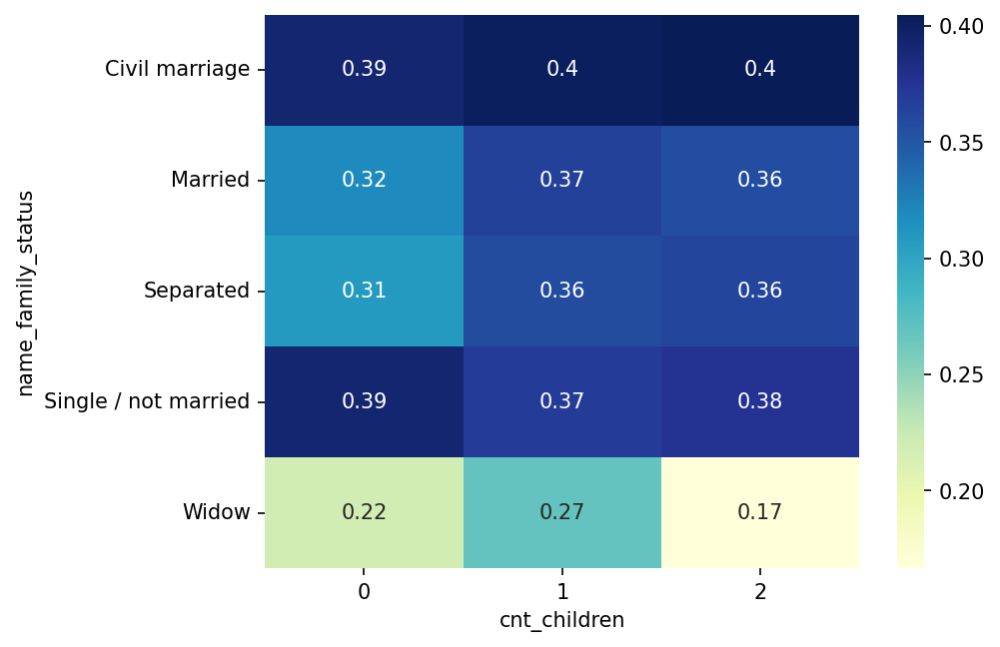

In [179]:
pivot_dg = data.pivot_table(values='target', index='name_family_status', columns='cnt_children')
sns.heatmap(pivot_dg, annot=True, cmap="YlGnBu");

#### Widows tend to have the lowest default rates, especially those without children. On the other hand, individuals in a civil marriage or those who are single/not married tend to have higher default rates.

### Is there a relationship between the terms of the previous credit, the amount of goods price, and the likelihood of defaulting on the current loan?

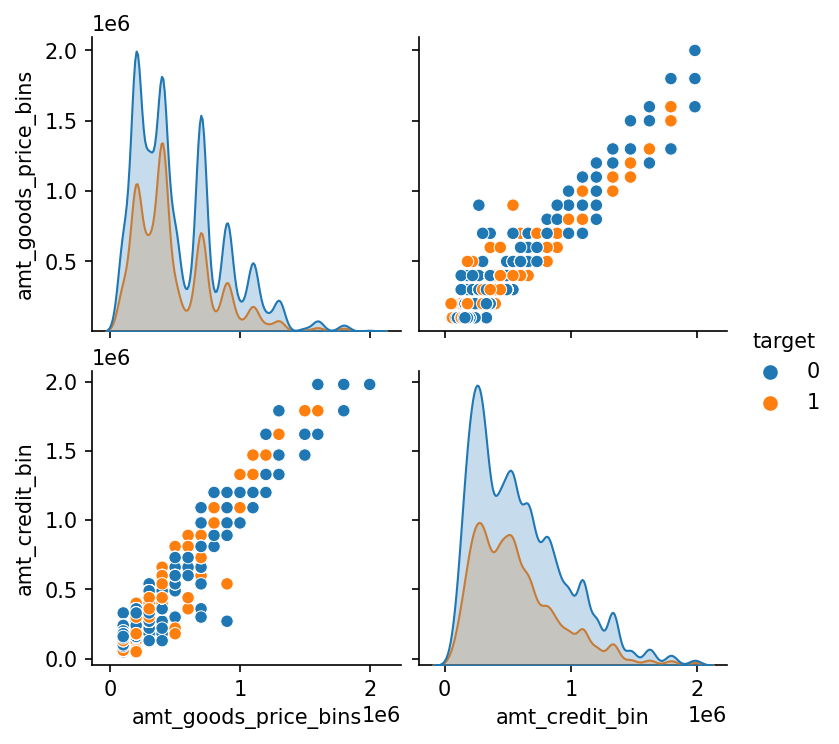

In [180]:
sns.pairplot(data[['amt_goods_price_bins', 'amt_credit_bin', 'target']], hue='target');

#### There are certain regions, especially in the lower ranges of both amt_goods_price_bins and amt_credit_bin, where there's a denser concentration of non-defaulters. This could suggest that loans with lower goods prices and credit amounts might have a reduced likelihood of default.

## Important Features
#### Dropping redundant, multicollinear, or a variable that exhibits a flat trend in bivariate analysis with respect to default rate!

In [181]:
feature_data = data[['target', 'code_gender', 'amt_income_total', 'name_family_status', 'years_birth', 'ext_source_2', 'ext_source_3', 'flag_own_car_or_realty',  'years_employed', 'mismatched_add', 'obs_30_cnt_social_circle_exp',
 'amt_req_credits_total', 'years_last_phone_change', 'amt_goods_price_bins', 'region_population_relative_bin', 'amt_application', 'days_registration_df', 'days_id_publish', 'flag_contact_points', 'name_education_type', 'cnt_children']]

In [182]:
categorical_columns = feature_data.select_dtypes(exclude='number')

In [183]:
for col in categorical_columns:
    dummies = pd.get_dummies(categorical_columns[col], drop_first=True, prefix=f'{col}')
    categorical_columns.drop(col, axis=1, inplace = True)
    feature_data = pd.concat([feature_data, dummies], axis=1)

In [184]:
feature_data.head()

,target,code_gender,amt_income_total,name_family_status,years_birth,ext_source_2,ext_source_3,flag_own_car_or_realty,years_employed,mismatched_add,obs_30_cnt_social_circle_exp,amt_req_credits_total,years_last_phone_change,amt_goods_price_bins,region_population_relative_bin,amt_application,days_registration_df,days_id_publish,flag_contact_points,name_education_type,cnt_children,code_gender_M,name_family_status_Married,name_family_status_Separated,name_family_status_Single / not married,name_family_status_Widow,name_education_type_Higher education,name_education_type_Incomplete higher,name_education_type_Lower secondary,name_education_type_Secondary / secondary special
0,1,M,12.219,Single / not married,25,0.263,0.139,1,2,0,3,2,3,400000,19,"32,710.500","3,648.000",5,2,Secondary / secondary special,0,1,0,0,1,0,0,0,0,1
1,0,M,12.324,Married,38,0.567,0.770,1,9,0,1,2,0,700000,16,0.000,"1,186.000",13,1,Secondary / secondary special,1,1,1,0,0,0,0,0,0,1
2,0,F,11.408,Married,52,0.651,0.461,1,10,0,1,1,0,200000,28,"135,000.000","4,260.000",7,2,Secondary / secondary special,0,0,1,0,0,0,0,0,0,1
3,1,F,11.631,Widow,51,0.548,0.191,1,7,0,11,3,0,700000,18,"450,000.000","9,833.000",5,1,Secondary / secondary special,0,0,0,0,0,1,0,0,0,1
4,1,M,12.219,Married,47,0.307,0.320,1,4,0,1,4,2,900000,25,"99,000.000","4,311.000",2,1,Secondary / secondary special,0,1,1,0,0,0,0,0,0,1


In [185]:
num_feature_data = feature_data.select_dtypes(include=['float64', 'int64'])
num_feature_data.corr()['target']

target                  1.000
amt_income_total        0.005
ext_source_2           -0.285
ext_source_3           -0.345
amt_application         0.008
days_registration_df   -0.002
cnt_children            0.024
Name: target, dtype: float64

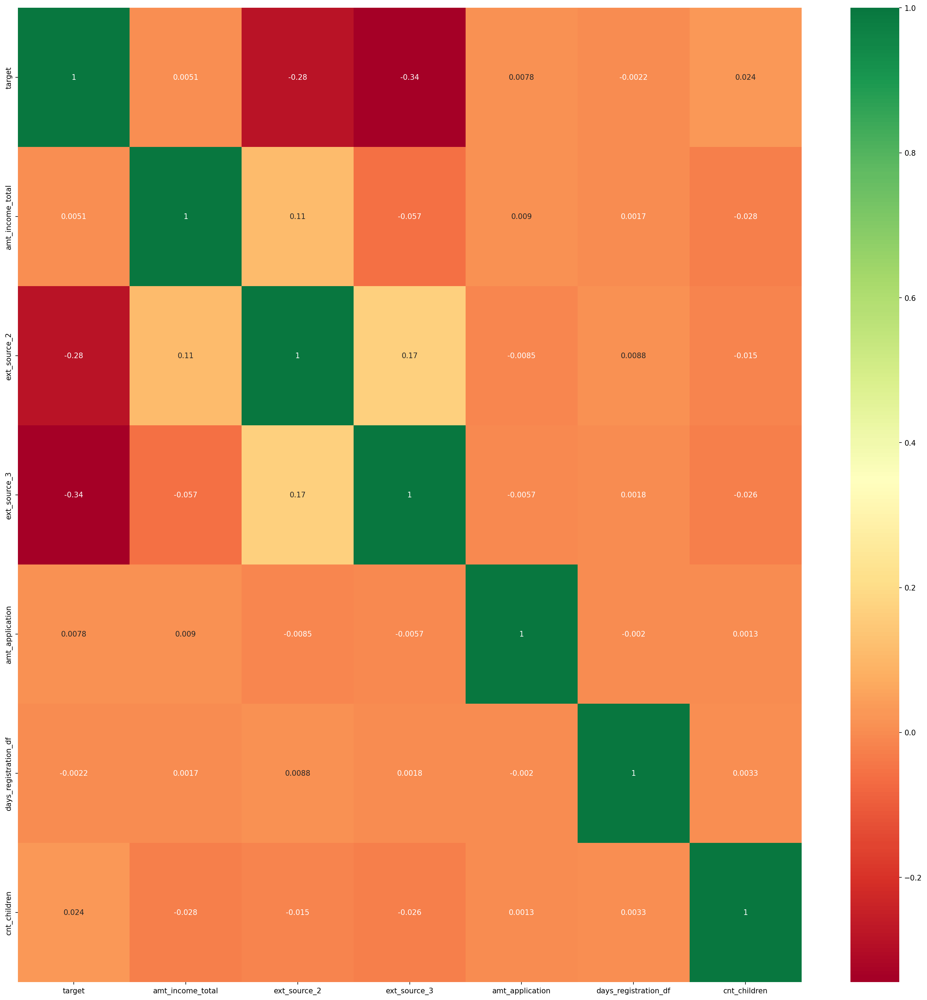

In [186]:
plt.figure(figsize=(24,24))
sns.heatmap(num_feature_data.corr(), annot=True, cmap='RdYlGn', center = 0.35);

### 10 most strongly correlated variables

#### ext_source_3: -0.345
### Both features show a clear pattern. These external sources seem significant in differentiating between defaulters and non-defaulters.

#### ext_source_2: -0.285
### As their values increase, the likelihood of defaulting decreases.

#### years_employed: -0.173
### Those who have been employed for fewer days (closer to the current date) seem to have a higher likelihood of defaulting.

#### years_last_phone_change: -0.105
### Clients who changed their phones more recently have a slightly higher likelihood of defaulting.

#### region_population_relative_bin: -0.084
### The distribution shows that clients from regions with a smaller relative population have a slightly higher default rate.

#### days_id_publish: -0.082
### Clients who updated their ID more recently are more likely to default.

#### years_birth: -0.078
### Younger clients, especially those in their 20s to 40s, have a higher likelihood of defaulting compared to older clients.

#### name_education_type_Higher education: -0.065
### Clients with a secondary or lower level of education have a higher default rate compared to those with a higher education.

#### amt_goods_price_bins: -0.054
### Loans with lower goods prices seem to have a higher likelihood of default.

#### obs_30_cnt_social_circle_exp: 0.053
### Clients with a higher number of observations about their social surroundings in the last 30 days tend to default more.

## RECOMMENDATIONS
### Incorporate external data source scores as significant indicators for loan decisions.
### Be cautious with younger clients and those with recent behavioral changes.
### Consider education level and regional population as key determinants.
### Consider additional financial checks for clients with larger families.
### Offer specialized financial products or guidance for clients in lower income brackets.


## CONCLUSION

### Through the detailed analysis, we've derived actionable insights related to client loan defaults. By considering the key features, financial institutions can enhance their loan default predictions. Continuous adaptation based on these features will lead to better lending decisions and minimized risks.
